# Machinelearning Pipeline

**Volgens patroon “rasbt/pattern_classification,” GitHub. [Online]. Available:
https://github.com/rasbt/pattern_classification zie capstoneproposal.pdf**
<br><br>

Important things to doublecheck when finishing:
* DId you solve the inverse problem?
* https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.SelectPercentile.html toepassen?
* https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.RFECV.html#sklearn.feature_selection.RFECV

## Libraries

In [1]:
#Import statements
import os
import sys
import pymysql
print('Python: {}'.format(sys.version))
import scipy
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', 50)
import matplotlib
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
from statistics import mean, stdev, median
import stad
import sklearn
from sklearn.model_selection import train_test_split

from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import permutation_importance
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

from collections import Counter

import warnings
warnings.filterwarnings("ignore")

%matplotlib inline
np.random.seed(7)


Python: 3.7.7 (default, Apr 15 2020, 05:09:04) [MSC v.1916 64 bit (AMD64)]


## Loading data

In [2]:
#All data must be exported using the ExportFirstStudyTemplate
longData = pd.read_csv("DataOutput/LongData23042020.csv") 
wideData = pd.read_csv("DataOutput/WideData23042020.csv") 

In [3]:
wideData=wideData.iloc[1:]
wideData=wideData.drop(columns=['MCI.1', 'MCI.2','age','age.1','age.2','gameseed','gameseed.1','gameseed.2','personID.1','personID.2'])
cols_to_move = ['personID']
wideData           = wideData[ cols_to_move + [ col for col in wideData.columns if col not in cols_to_move ] ]

In [4]:
longData.head()

,MCI,age,gameID,personID,gameTime,isSolved,gameseed,score,totalMoves,msPerMove,totalTimeMoveAvg,totalTimeMoveMdn,totalTimeMoveSD,totalTimeMoveMin,totalTimeMoveMax,thinkTimeMoveAvg,thinkTimeMoveMdn,thinkTimeMoveSD,thinkTimeMoveMin,thinkTimeMoveMax,thinkTimeMoveSuccesAvg,thinkTimeMoveSuccesMdn,thinkTimeMoveSuccesSD,thinkTimeMoveSuccesMin,thinkTimeMoveSuccesMax,...,moveTimeMoveErrorMax,pileMovesPercentage,succesfulMovesPercentage,erroneousMovesPercentage,accuracyAvg,accuracyMdn,accuracySD,accuracyMin,accuracyMax,numberOfCardsMovedAvg,numberOfCardsMovedMdn,numberOfCardsMovedSD,rankErrorPercentage,suitErrorPercentage,betaErrorPercentage,aceBetaErrorPercentage,kingBetaErrorPercentage,taps,hintMovePercentage,undoMovePercentage,noAceOnSuitErrorPercentage,noKingOnBuildStackErrorPercentage,finalBetaError,CardGamesFrequency,TabletUseFrequency
0,MCI,79,8287,484,218065,0,498512,-270,38.0,5738.552632,5229.0,4710.0,2241.0,1702.0,12362.0,3203.0,3313.0,1391.0,1101.0,5006.0,3196.0,3363.0,1476.0,1101.0,5006.0,...,0.0,71.052632,81.818182,9.090909,75.0,80.0,16.0,48.0,97.0,1.000000,1.0,0.000000,9.090909,9.090909,70.370370,0.000000,31.578947,2.0,0.0,2.564103,0.0,0.0,0.0,Daily,Daily
1,MCI,79,8290,484,218311,0,221,95,36.0,6064.194444,5509.0,4715.0,2834.0,1426.0,13470.0,3205.0,2918.0,1458.0,1612.0,6108.0,3205.0,2918.0,1458.0,1612.0,6108.0,...,0.0,61.111111,100.000000,0.000000,65.0,64.0,11.0,48.0,82.0,1.142857,1.0,0.534522,0.000000,0.000000,77.272727,0.000000,0.000000,2.0,0.0,2.702703,0.0,0.0,0.0,Daily,Daily
2,MCI,79,8293,484,642954,0,7894515,-2090,125.0,5143.632000,5082.0,4123.0,3697.0,765.0,22160.0,3284.0,2810.0,1573.0,1457.0,7755.0,3129.0,2808.0,1485.0,1457.0,7755.0,...,2608.0,72.000000,68.571429,8.571429,67.0,69.0,14.0,30.0,88.0,1.142857,1.0,0.429970,8.571429,8.571429,23.333333,0.000000,0.000000,11.0,0.0,0.000000,0.0,0.0,0.0,Daily,Daily
3,MCI,84,8299,487,379024,0,7894515,645,78.0,4859.282051,4622.0,3886.0,2785.0,785.0,18405.0,2997.0,2521.0,1880.0,447.0,10508.0,2933.0,2482.0,1895.0,447.0,10508.0,...,4848.0,39.743590,89.361702,6.382979,75.0,77.0,10.0,49.0,96.0,1.276596,1.0,0.901741,6.382979,6.382979,67.741935,0.000000,0.000000,10.0,0.0,1.265823,0.0,0.0,1.0,Weekly,Never
4,MCI,84,8302,487,304475,0,221,220,71.0,4288.380282,4062.0,3523.0,2115.0,900.0,13563.0,2744.0,2157.0,1422.0,1170.0,6052.0,2725.0,2157.0,1427.0,1170.0,6052.0,...,3521.0,49.295775,94.444444,5.555556,74.0,75.0,16.0,6.0,95.0,1.166667,1.0,0.609449,2.777778,2.777778,68.571429,1.408451,0.000000,6.0,0.0,1.388889,0.0,0.0,1.0,Weekly,Never


In [5]:
wideData.head(20)

,personID,MCI,accuracyAvg,accuracyAvg.1,accuracyAvg.2,accuracyMax,accuracyMax.1,accuracyMax.2,accuracyMdn,accuracyMdn.1,accuracyMdn.2,accuracyMin,accuracyMin.1,accuracyMin.2,accuracySD,accuracySD.1,accuracySD.2,aceBetaErrorPercentage,aceBetaErrorPercentage.1,aceBetaErrorPercentage.2,betaErrorPercentage,betaErrorPercentage.1,betaErrorPercentage.2,erroneousMovesPercentage,erroneousMovesPercentage.1,...,thinkTimeMoveSuccesMin.2,thinkTimeMoveSuccesSD,thinkTimeMoveSuccesSD.1,thinkTimeMoveSuccesSD.2,totalMoves,totalMoves.1,totalMoves.2,totalTimeMoveAvg,totalTimeMoveAvg.1,totalTimeMoveAvg.2,totalTimeMoveMax,totalTimeMoveMax.1,totalTimeMoveMax.2,totalTimeMoveMdn,totalTimeMoveMdn.1,totalTimeMoveMdn.2,totalTimeMoveMin,totalTimeMoveMin.1,totalTimeMoveMin.2,totalTimeMoveSD,totalTimeMoveSD.1,totalTimeMoveSD.2,undoMovePercentage,undoMovePercentage.1,undoMovePercentage.2
1,484,MCI,65.0,75.0,67.0,82.0,97.0,88.0,64.0,80.0,69.0,48.0,48.0,30.0,11.0,16.0,14.0,0.000000,0.000000,0.0,77.272727,70.370370,23.333333,0.000000,9.090909,...,1457.0,1458.0,1476.0,1485.0,36.0,38.0,125.0,5509.0,5229.0,5082.0,13470.0,12362.0,22160.0,4715.0,4710.0,4123.0,1426.0,1702.0,765.0,2834.0,2241.0,3697.0,2.702703,2.564103,0.000000
2,487,MCI,74.0,77.0,75.0,95.0,96.0,96.0,75.0,78.0,77.0,6.0,50.0,49.0,16.0,13.0,10.0,1.408451,0.000000,0.0,68.571429,81.081081,67.741935,5.555556,6.666667,...,447.0,1427.0,1724.0,1895.0,71.0,67.0,78.0,4062.0,4392.0,4622.0,13563.0,9429.0,18405.0,3523.0,4514.0,3886.0,900.0,884.0,785.0,2115.0,1794.0,2785.0,1.388889,0.000000,1.265823
3,490,MCI,70.0,74.0,71.0,93.0,96.0,91.0,71.0,74.0,72.0,42.0,47.0,49.0,13.0,11.0,12.0,0.000000,0.000000,0.0,75.862069,86.956522,78.260870,7.692308,5.128205,...,1890.0,10200.0,8577.0,4840.0,42.0,62.0,92.0,12822.0,13163.0,11797.0,32413.0,38333.0,71298.0,13144.0,10882.0,9410.0,1273.0,1351.0,922.0,7916.0,9213.0,10146.0,0.000000,0.000000,0.000000
4,493,MCI,75.0,75.0,76.0,93.0,95.0,97.0,74.0,75.0,77.0,55.0,50.0,49.0,11.0,10.0,13.0,0.000000,0.000000,0.0,19.565217,45.000000,18.421053,0.000000,6.896552,...,974.0,4089.0,2863.0,2239.0,73.0,78.0,78.0,5471.0,6047.0,4863.0,22202.0,17760.0,11526.0,4965.0,4589.0,4489.0,1049.0,802.0,947.0,4057.0,3747.0,2583.0,0.000000,0.000000,0.000000
5,496,MCI,77.0,82.0,80.0,93.0,98.0,97.0,81.0,83.0,80.0,35.0,67.0,62.0,13.0,7.0,8.0,0.000000,0.000000,0.0,3.571429,91.176471,83.823529,10.526316,8.695652,...,1081.0,3895.0,2062.0,1561.0,47.0,103.0,109.0,4140.0,3664.0,3486.0,21047.0,11752.0,16662.0,2678.0,2903.0,2841.0,500.0,357.0,748.0,4361.0,2420.0,2168.0,0.000000,0.000000,0.000000
6,499,MCI,70.0,75.0,75.0,94.0,95.0,97.0,74.0,75.0,76.0,44.0,54.0,37.0,15.0,10.0,13.0,0.000000,0.000000,0.0,17.857143,86.363636,38.888889,0.000000,0.000000,...,1055.0,2767.0,2697.0,1656.0,40.0,77.0,77.0,4854.0,5017.0,4576.0,15410.0,13206.0,10367.0,3770.0,4111.0,4373.0,1851.0,1390.0,400.0,2749.0,2963.0,2306.0,0.000000,0.000000,0.000000
7,505,MCI,77.0,76.0,75.0,88.0,96.0,93.0,76.0,77.0,75.0,71.0,53.0,49.0,5.0,9.0,9.0,0.000000,0.000000,0.0,28.571429,58.823529,32.432432,0.000000,0.000000,...,1072.0,3651.0,4011.0,2341.0,37.0,76.0,75.0,5417.0,6217.0,6009.0,17574.0,21478.0,33176.0,4466.0,3968.0,4237.0,661.0,848.0,662.0,3560.0,4678.0,4951.0,0.000000,0.000000,0.000000
8,508,MCI,71.0,73.0,79.0,92.0,81.0,95.0,72.0,72.0,78.0,19.0,63.0,64.0,16.0,6.0,8.0,0.000000,0.000000,0.0,10.000000,15.384615,100.000000,5.555556,0.000000,...,1967.0,3861.0,4020.0,6041.0,38.0,34.0,58.0,7076.0,5876.0,4714.0,24936.0,18906.0,25723.0,5866.0,4669.0,4235.0,601.0,857.0,600.0,4715.0,4207.0,3375.0,5.000000,0.000000,0.000000
9,511,MCI,77.0,80.0,79.0,95.0,94.0,90.0,77.0,82.0,82.0,50.0,54.0,58.0,11.0,10.0,8.0,0.000000,0.000000,0.0,60.606061,76.315789,80.000000,5.555556,0.000000,...,973.0,1969.0,1979.0,1174.0,51.0,62.0,62.0,3429.0,4163.0,3498.0,8871.0,13721.0,12256.0,3038.0,3686.0,2916.0,624.0,884.0,566.0,1886.0,2443.0,2093.0,1.923077,0.000000,0.000000
10,514,MCI,83.0,82.0,80.0,94.0,97.0,96.0,84.0,85.0,81.0,70.0,60.0,49.0,8.0,9.0,9.0,0.000000,0.000000,0.0,13.793103,82.352

In [6]:
wideData.MCI=wideData.MCI.replace('Healthy',0)
wideData.MCI=wideData.MCI.replace('MCI',1)

# Data Exploration 

What we do at this stage is called EDA (Exploratory Data Analysis), which means analytically exploring data in order to provide some insights for subsequent processing and modeling.

Some common practices:
* Inspect the distribution of target variable. Depending on what scoring metric is used, an imbalanced distribution of target variable might harm the model’s performance.
* For numerical variables, use box plot and scatter plot to inspect their distributions and check for outliers.
https://towardsdatascience.com/exploring-your-data-with-just-1-line-of-python-4b35ce21a82d  

What I want to do here is to get insight into the features as is. Are they off? Do they need preprocessing to turn into more useful features? 

Going to explore game 1 here. This makes things simpler to do and this way I do not have to worry about aggregating the three games. Also establishes a baseline to see whether adding games actually does a lot. Perhaps look into which game is the most defining.<br><br>
After first profiling, decided to do the following:
* removed meta data:  
gameID
cardGamesFrequency
tabletUseFrequency
gameseed

* removed due to high correlation: subdivisions moveTime and thinkTime  
thinkTimeMoveSuccesAvg
thinkTimeMoveSuccesMdn
thinkTimeMoveSuccesSD
thinkTimeMoveSuccesMin
thinkTimeMoveSuccesMax
thinkTimeMoveErrorAvg
thinkTimeMoveErrorMdn
thinkTimeMoveErrorSD
thinkTimeMoveErrorMin
thinkTimeMoveErrorMax
moveTimeMoveSuccesAvg
moveTimeMoveSuccesMdn
moveTimeMoveSuccesSD
moveTimeMoveSuccesMin
moveTimeMoveSuccesMax
moveTimeMoveErrorAvg
moveTimeMoveErrorMdn
moveTimeMoveErrorSD
moveTimeMoveErrorMin
moveTimeMoveErrorMax
  
After the second profiling, decided to do the following:  
* Remove accuracyMdn: is highly correlated with accuracyAvg (ρ = 0.9387089371)
* Remove numberOfCardsMovedMdn: has constant value "1.0"
* Remove thinkTimeMoveMdn: is highly correlated with thinkTimeMoveAvg (ρ = 0.9005413612)
* Remove msPerMove: is highly correlated with totalTimeMoveAvg  (ρ = 0.9966874984) 	
* Remove totalTimeMoveMdn: is highly correlated with totalTimeMoveAvg (ρ = 0.939920302) 
<br><br>
I have a preference of removing medians instead of averages. Medians do not reflect the homogenousity MCI's have by ignoring their outliers. When we look at the confidence intervals of my first data exploration, we see that they are much more inconsistent. <br>

Now let's look into the variables. What can we learn from the third pandas report?
* the mins/maxes are often geometric distributed, should do a log transform do make them normally distributed?
* aceBetaError is almost always 0. Remove it as it does not bring consistent information to the table. Or the algo could learn everyone with a 0 is X/Y. The profiling even mistakes it as categorical.
* Like min/max, error distributions are sort of geometric, with a lot of people not making them. Log transform?
* hintMovePercentage is equally mistaken as categorical
* kingBetaError is 66% empty, maybe remove it?
* noKingOnBuildstack and noAceonSuitstack mistaken as categorical, remove.
* rankErrorPercentage very heavily exponential, log transform
* idem succesfulMovePercentage, suiterrorPercentage,
* undoMovePercentage 87.2% null
  
Decisions:
* remove hintmovePercentage
* remove aceBetaError
* remove kingBetaErrorPercentage
* remove noAceOnSuitStackErrorPercentage
* remove noKingOnBuildStackErrorPercentage
* remove undoMovePercentage
* remove moveTimeMdn (last mdn in the set)
* remove age (unnessecary for ML)
* remove personID (unnessecary for ML)


**Quite often, people do not remove this much features a priori and let CV and other feature selection methods do their thing. We don't have enough data+highly correlated features are normally removed by regularization techniques. Anyhow, also run it with all the removed features later on.**

In [7]:
# Game.1=498512  Game2=221 Game3=7894515
seed=7894515
data = longData[longData.gameseed==seed] #Get First Game Data
data= data.drop(['gameID', 'CardGamesFrequency', 'TabletUseFrequency', 'gameseed','thinkTimeMoveSuccesAvg','thinkTimeMoveSuccesMdn'
               ,'thinkTimeMoveSuccesSD','thinkTimeMoveSuccesMin','thinkTimeMoveSuccesMax','thinkTimeMoveErrorAvg','thinkTimeMoveErrorMdn',
                'thinkTimeMoveErrorSD','thinkTimeMoveErrorMin','thinkTimeMoveErrorMax','moveTimeMoveSuccesAvg','moveTimeMoveSuccesMdn','moveTimeMoveSuccesSD',
                'moveTimeMoveSuccesMin','moveTimeMoveSuccesMax','moveTimeMoveErrorAvg','moveTimeMoveErrorMdn','moveTimeMoveErrorSD','moveTimeMoveErrorMin',
                'moveTimeMoveErrorMax','accuracyMdn','numberOfCardsMovedMdn','thinkTimeMoveMdn','msPerMove','totalTimeMoveMdn',
                'hintMovePercentage','aceBetaErrorPercentage','noAceOnSuitErrorPercentage','noKingOnBuildStackErrorPercentage','undoMovePercentage',
                'moveTimeMoveMdn','kingBetaErrorPercentage'], axis=1)
data.MCI=data.MCI.replace('Healthy',0)
data.MCI=data.MCI.replace('MCI',1)
data.head(60)


,MCI,age,personID,gameTime,isSolved,score,totalMoves,totalTimeMoveAvg,totalTimeMoveSD,totalTimeMoveMin,totalTimeMoveMax,thinkTimeMoveAvg,thinkTimeMoveSD,thinkTimeMoveMin,thinkTimeMoveMax,moveTimeMoveAvg,moveTimeMoveSD,moveTimeMoveMin,moveTimeMoveMax,pileMovesPercentage,succesfulMovesPercentage,erroneousMovesPercentage,accuracyAvg,accuracySD,accuracyMin,accuracyMax,numberOfCardsMovedAvg,numberOfCardsMovedSD,rankErrorPercentage,suitErrorPercentage,betaErrorPercentage,taps,finalBetaError
2,1,79,484,642954,0,-2090,125.0,5082.0,3697.0,765.0,22160.0,3284.0,1573.0,1457.0,7755.0,1460.0,3348.0,377.0,17885.0,72.000000,68.571429,8.571429,67.0,14.0,30.0,88.0,1.142857,0.429970,8.571429,8.571429,23.333333,11.0,0.0
3,1,84,487,379024,0,645,78.0,4622.0,2785.0,785.0,18405.0,2997.0,1880.0,447.0,10508.0,1435.0,1508.0,470.0,7757.0,39.743590,89.361702,6.382979,75.0,10.0,49.0,96.0,1.276596,0.901741,6.382979,6.382979,67.741935,10.0,1.0
8,1,84,490,1096116,0,10,92.0,11797.0,10146.0,922.0,71298.0,7589.0,4891.0,1890.0,23132.0,1047.0,516.0,501.0,3330.0,50.000000,91.304348,6.521739,71.0,12.0,49.0,91.0,1.782609,1.896348,6.521739,0.000000,78.260870,2.0,1.0
9,1,89,493,393271,0,-105,78.0,4863.0,2583.0,947.0,11526.0,3938.0,2216.0,974.0,9130.0,893.0,812.0,400.0,4741.0,48.717949,87.500000,7.500000,76.0,13.0,49.0,97.0,1.800000,2.322686,7.500000,5.000000,18.421053,3.0,0.0
14,1,77,496,387677,0,-380,109.0,3486.0,2168.0,748.0,16662.0,2948.0,1763.0,1081.0,8238.0,635.0,262.0,300.0,1606.0,62.385321,95.121951,2.439024,80.0,8.0,62.0,97.0,1.512195,1.451240,2.439024,2.439024,83.823529,3.0,1.0
17,1,85,499,360491,0,585,77.0,4576.0,2306.0,400.0,10367.0,2871.0,1640.0,1055.0,7577.0,905.0,1040.0,300.0,5709.0,46.753247,90.243902,4.878049,75.0,13.0,37.0,97.0,1.268293,0.895109,4.878049,4.878049,38.888889,1.0,0.0
20,1,73,505,461315,0,450,75.0,6009.0,4951.0,662.0,33176.0,3665.0,2314.0,1072.0,9769.0,1064.0,1274.0,500.0,7414.0,49.333333,94.736842,2.631579,75.0,9.0,49.0,93.0,1.236842,0.633916,0.000000,0.000000,32.432432,0.0,0.0
23,1,77,508,287331,0,-255,58.0,4714.0,3375.0,600.0,25723.0,5181.0,5853.0,1967.0,25177.0,944.0,472.0,541.0,2500.0,72.413793,93.750000,6.250000,79.0,8.0,64.0,95.0,1.000000,0.000000,0.000000,6.250000,100.000000,2.0,1.0
26,1,82,511,221274,0,-275,62.0,3498.0,2093.0,566.0,12256.0,2242.0,1148.0,973.0,6176.0,757.0,340.0,364.0,1567.0,64.516129,90.909091,4.545455,79.0,8.0,58.0,90.0,1.000000,0.000000,0.000000,4.545455,80.000000,0.0,1.0
29,1,88,514,425967,0,30,79.0,5318.0,3551.0,1080.0,20276.0,3400.0,2456.0,1457.0,11581.0,1061.0,874.0,600.0,5610.0,50.632911,100.000000,0.000000,80.0,9.0,49.0,96.0,1.435897,1.651074,0.000000,0.000000,50.000000,26.0,0.0


In [8]:
for col in data.columns: 
    print(col) 

MCI
age
personID
gameTime
isSolved
score
totalMoves
totalTimeMoveAvg
totalTimeMoveSD
totalTimeMoveMin
totalTimeMoveMax
thinkTimeMoveAvg
thinkTimeMoveSD
thinkTimeMoveMin
thinkTimeMoveMax
moveTimeMoveAvg
moveTimeMoveSD
moveTimeMoveMin
moveTimeMoveMax
pileMovesPercentage
succesfulMovesPercentage
erroneousMovesPercentage
accuracyAvg
accuracySD
accuracyMin
accuracyMax
numberOfCardsMovedAvg
numberOfCardsMovedSD
rankErrorPercentage
suitErrorPercentage
betaErrorPercentage
taps
finalBetaError


In [9]:
profile = ProfileReport(data)
profile

Number of variables,34
Number of observations,46
Total Missing (%),0.0%
Total size in memory,12.3 KiB
Average record size in memory,274.8 B
Numeric,23
Categorical,0
Boolean,3
Date,0
Text (Unique),0
Rejected,8


In [10]:
print(len(data.columns))

33


# Data Visualisation

* https://www.kaggle.com/pmarcelino/comprehensive-data-exploration-with-python
* Check https://www.kaggle.com/benhamner/python-data-visualizations 
* https://towardsdatascience.com/7-things-to-quickly-improve-your-data-analysis-in-python-3d434243da7 : plot with cufflinks and plotly
* feature correlation and final visualisations, heatmaps, ..
* https://towardsdatascience.com/better-heatmaps-and-correlation-matrix-plots-in-python-41445d0f2bec?source=bookmarks---------1-----------------------

* For classification tasks, plot the data with points colored according to their labels. This can help with feature engineering.
* Make pairwise distribution plots and examine their correlations.
* https://towardsdatascience.com/exploratory-data-analysis-feature-engineering-and-modelling-using-supermarket-sales-data-part-1-228140f89298
* STAD Gebruiken Jan Aerts https://github.com/vda-lab/pySTAD

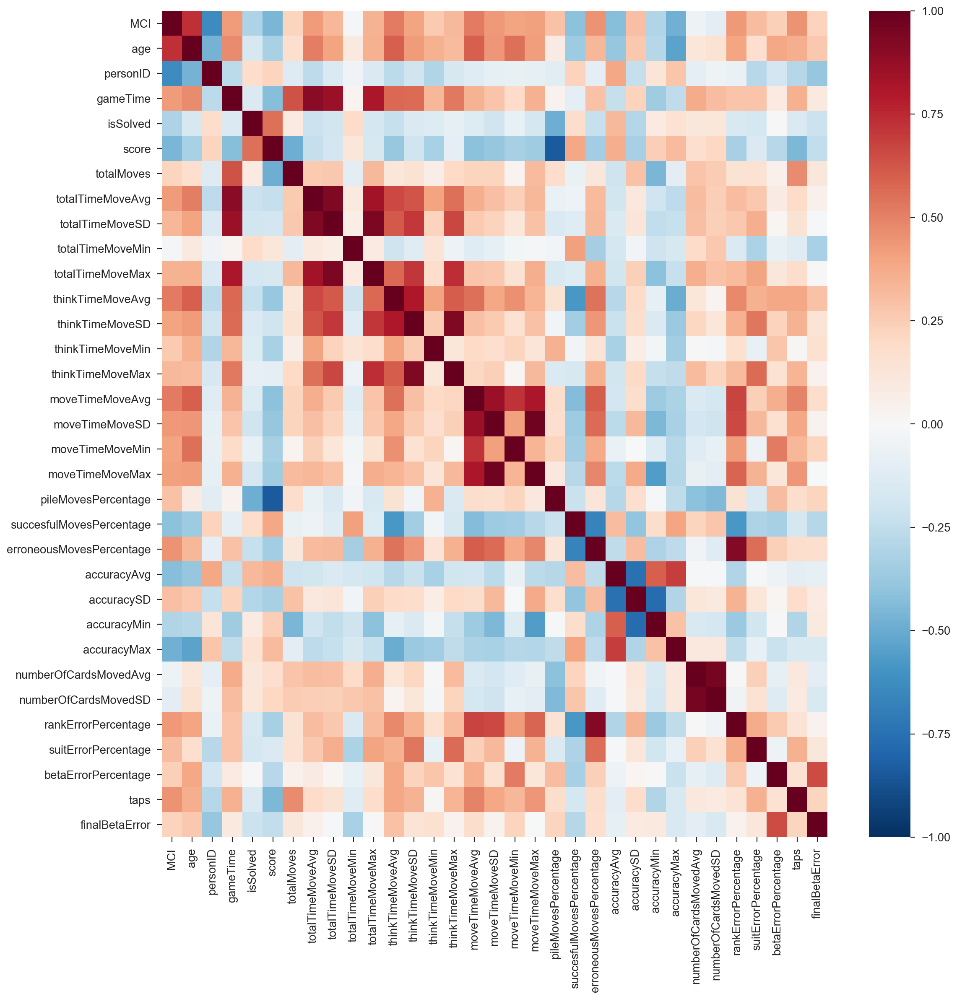

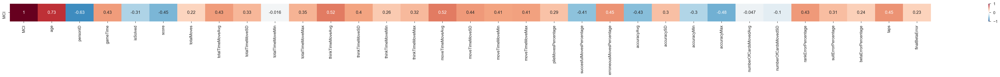

<Figure size 300x3000 with 0 Axes>

In [11]:
#Big Correlation Plot
sns.set_context("paper", font_scale=1.4) 
plt.figure(figsize=(16,16), dpi = 160, facecolor='w')
sns.heatmap(data.corr(), cmap="RdBu_r",vmin=-1,vmax=1)
plt.show()

#Get all MCI correlations
plt.figure(figsize=(64,1), dpi = 160, facecolor='w'),
sns.heatmap(data.corr().loc["MCI"].to_frame().T,vmin=-1,vmax=1, cmap="RdBu_r", annot=True)
plt.figure(figsize= (3,30))
plt.show()




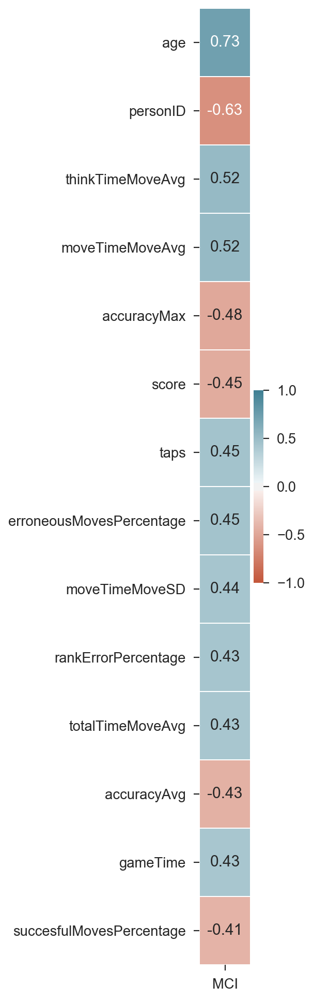

In [12]:
#Rank correlations them with absolute values
corr_with_MCI = data.corr().applymap(abs).loc["MCI"].nlargest(15).iloc[1:].to_frame()
plt.figure(figsize=(1,15), dpi = 160,facecolor="w")
corr_non_abs = data.corr().loc["MCI"].filter(list(corr_with_MCI.index.values)).to_frame()
sns.heatmap(corr_non_abs, cmap=sns.diverging_palette(20, 220, n=256), annot=True, linewidths=.5,vmin=-1,vmax=1,)

In [13]:
#Boiler code
def heatmap(x, y, **kwargs):
    if 'color' in kwargs:
        color = kwargs['color']
    else:
        color = [1]*len(x)

    if 'palette' in kwargs:
        palette = kwargs['palette']
        n_colors = len(palette)
    else:
        n_colors = 256 # Use 256 colors for the diverging color palette
        palette = sns.color_palette("Blues", n_colors) 

    if 'color_range' in kwargs:
        color_min, color_max = kwargs['color_range']
    else:
        color_min, color_max = min(color), max(color) # Range of values that will be mapped to the palette, i.e. min and max possible correlation

    def value_to_color(val):
        if color_min == color_max:
            return palette[-1]
        else:
            val_position = float((val - color_min)) / (color_max - color_min) # position of value in the input range, relative to the length of the input range
            val_position = min(max(val_position, 0), 1) # bound the position betwen 0 and 1
            ind = int(val_position * (n_colors - 1)) # target index in the color palette
            return palette[ind]

    if 'size' in kwargs:
        size = kwargs['size']
    else:
        size = [1]*len(x)

    if 'size_range' in kwargs:
        size_min, size_max = kwargs['size_range'][0], kwargs['size_range'][1]
    else:
        size_min, size_max = min(size), max(size)

    size_scale = kwargs.get('size_scale', 500)

    def value_to_size(val):
        if size_min == size_max:
            return 1 * size_scale
        else:
            val_position = (val - size_min) * 0.99 / (size_max - size_min) + 0.01 # position of value in the input range, relative to the length of the input range
            val_position = min(max(val_position, 0), 1) # bound the position betwen 0 and 1
            return val_position * size_scale
    if 'x_order' in kwargs: 
        x_names = [t for t in kwargs['x_order']]
    else:
        x_names = [t for t in sorted(set([v for v in x]))]
    x_to_num = {p[1]:p[0] for p in enumerate(x_names)}

    if 'y_order' in kwargs: 
        y_names = [t for t in kwargs['y_order']]
    else:
        y_names = [t for t in sorted(set([v for v in y]))]
    y_to_num = {p[1]:p[0] for p in enumerate(y_names)}

    plot_grid = plt.GridSpec(1, 15, hspace=0.2, wspace=0.1) # Setup a 1x10 grid
    ax = plt.subplot(plot_grid[:,:-1]) # Use the left 14/15ths of the grid for the main plot

    marker = kwargs.get('marker', 's')

    kwargs_pass_on = {k:v for k,v in kwargs.items() if k not in [
         'color', 'palette', 'color_range', 'size', 'size_range', 'size_scale', 'marker', 'x_order', 'y_order'
    ]}

    ax.scatter(
        x=[x_to_num[v] for v in x],
        y=[y_to_num[v] for v in y],
        marker=marker,
        s=[value_to_size(v) for v in size], 
        c=[value_to_color(v) for v in color],
        **kwargs_pass_on
    )
    ax.set_xticks([v for k,v in x_to_num.items()])
    ax.set_xticklabels([k for k in x_to_num], rotation=45, horizontalalignment='right')
    ax.set_yticks([v for k,v in y_to_num.items()])
    ax.set_yticklabels([k for k in y_to_num])

    ax.grid(False, 'major')
    ax.grid(True, 'minor')
    ax.set_xticks([t + 0.5 for t in ax.get_xticks()], minor=True)
    ax.set_yticks([t + 0.5 for t in ax.get_yticks()], minor=True)

    ax.set_xlim([-0.5, max([v for v in x_to_num.values()]) + 0.5])
    ax.set_ylim([-0.5, max([v for v in y_to_num.values()]) + 0.5])
    ax.set_facecolor('#F1F1F1')

    # Add color legend on the right side of the plot
    if color_min < color_max:
        ax = plt.subplot(plot_grid[:,-1]) # Use the rightmost column of the plot

        col_x = [0]*len(palette) # Fixed x coordinate for the bars
        bar_y=np.linspace(color_min, color_max, n_colors) # y coordinates for each of the n_colors bars

        bar_height = bar_y[1] - bar_y[0]
        ax.barh(
            y=bar_y,
            width=[5]*len(palette), # Make bars 5 units wide
            left=col_x, # Make bars start at 0
            height=bar_height,
            color=palette,
            linewidth=0
        )
        ax.set_xlim(1, 2) # Bars are going from 0 to 5, so lets crop the plot somewhere in the middle
        ax.grid(False) # Hide grid
        ax.set_facecolor('white') # Make background white
        ax.set_xticks([]) # Remove horizontal ticks
        ax.set_yticks(np.linspace(min(bar_y), max(bar_y), 3)) # Show vertical ticks for min, middle and max
        ax.yaxis.tick_right() # Show vertical ticks on the right 


def corrplot(data, size_scale=500, marker='s'):
    corr = pd.melt(data.reset_index(), id_vars='index')
    corr.columns = ['x', 'y', 'value']
    heatmap(
        corr['x'], corr['y'],
        color=corr['value'], color_range=[-1, 1],
        palette=sns.diverging_palette(20, 220, n=256),
        size=corr['value'].abs(), size_range=[0,1],
        marker=marker,
        x_order=data.columns,
        y_order=data.columns[::-1],
        size_scale=size_scale
    )

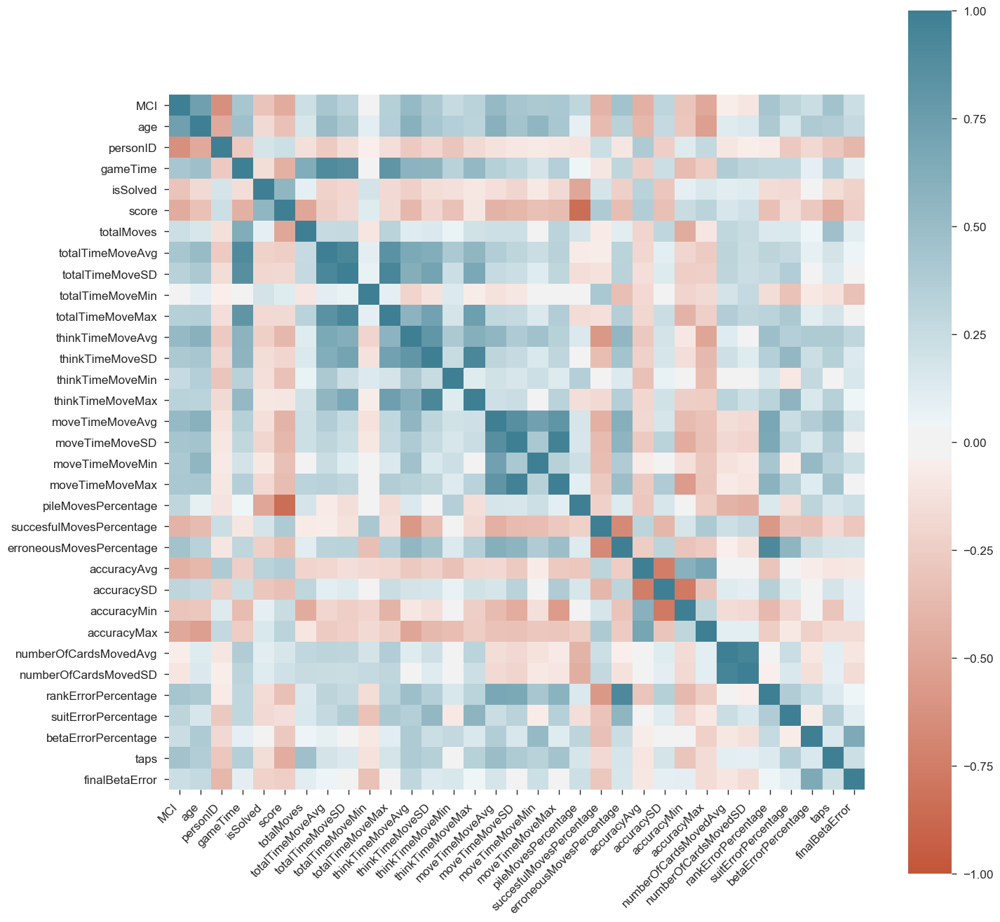

In [14]:
#Heatmap
corr = data.corr();
plt.figure(figsize=(16, 16));
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=256),
    square=True
);
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

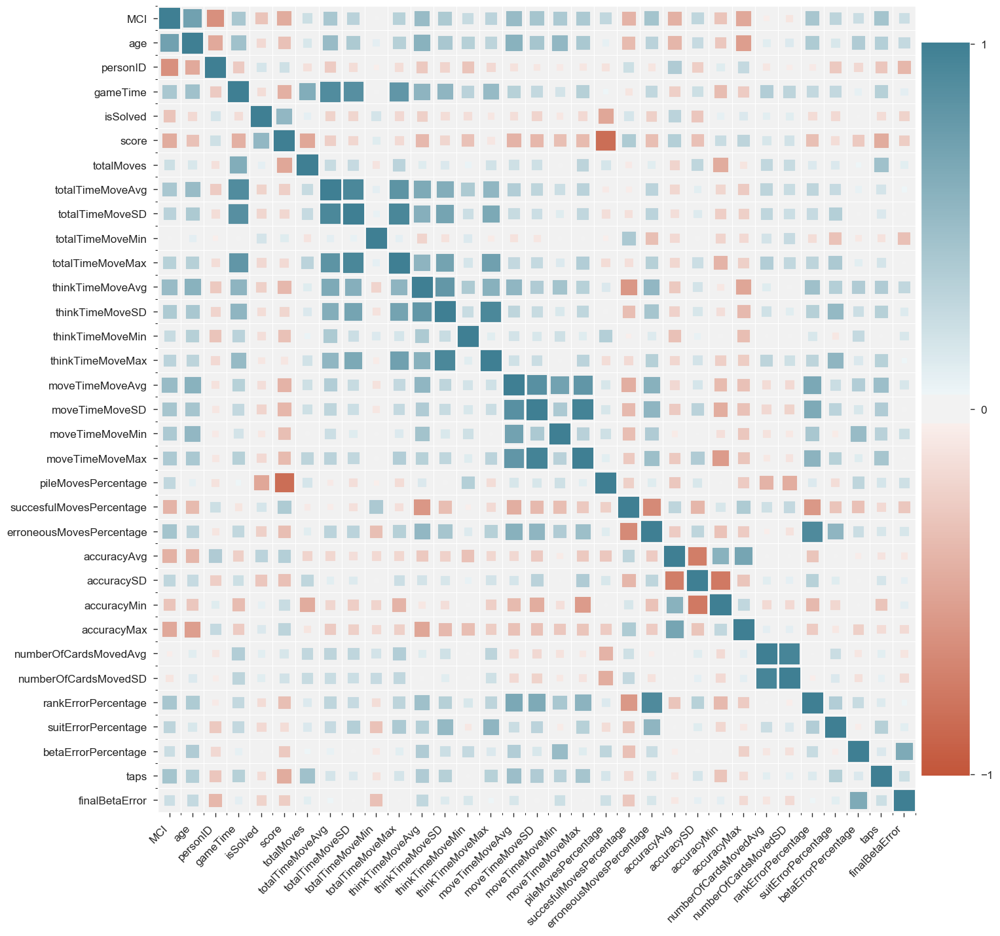

In [15]:

plt.figure(figsize=(16, 16))
corrplot(corr)

In [16]:
#Plot the hugely negative and positive related stuff
corr_biggest = data.corr().unstack().sort_values().drop_duplicates()
corr_biggest.tail(30)
corr_biggest.head(30)

score                     pileMovesPercentage        -0.842461
accuracyMin               accuracySD                 -0.770002
accuracySD                accuracyAvg                -0.748621
erroneousMovesPercentage  succesfulMovesPercentage   -0.664878
personID                  MCI                        -0.627875
succesfulMovesPercentage  thinkTimeMoveAvg           -0.585374
rankErrorPercentage       succesfulMovesPercentage   -0.583554
moveTimeMoveMax           accuracyMin                -0.558712
age                       accuracyMax                -0.537827
thinkTimeMoveAvg          accuracyMax                -0.496747
score                     totalMoves                 -0.489561
pileMovesPercentage       isSolved                   -0.488574
accuracyMax               MCI                        -0.480672
personID                  age                        -0.469881
accuracyMin               totalMoves                 -0.455234
MCI                       score                      -0

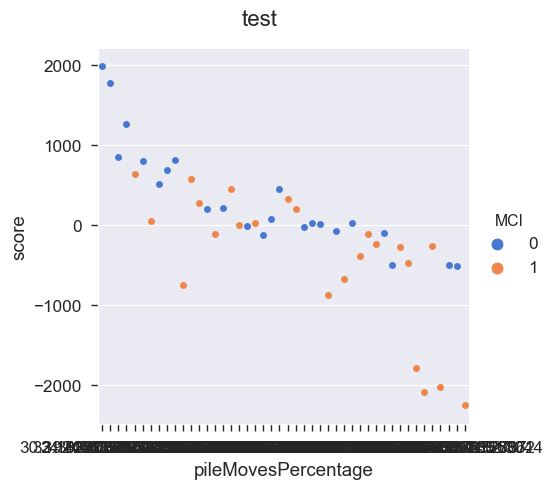

In [17]:
#We can see that score is correlated to pilemovespercentage, going through the pile does a heavy score penalty
test = sns.catplot(x="pileMovesPercentage", y='score', hue="MCI", data=data, kind="swarm", palette="muted")
test.fig.subplots_adjust(top=0.9);
test.fig.suptitle('test', fontsize=16);

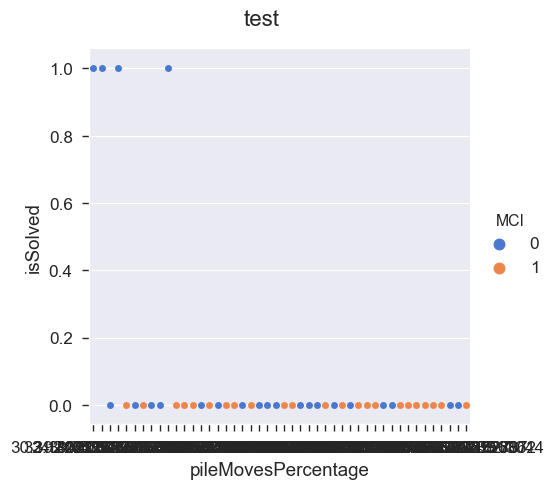

In [18]:
#Win or not, MCI's have high pilemovepercentages.
test = sns.catplot(x="pileMovesPercentage", y='isSolved', hue="MCI", data=data, kind="swarm", palette="muted")
test.fig.subplots_adjust(top=0.9);
test.fig.suptitle('test', fontsize=16);

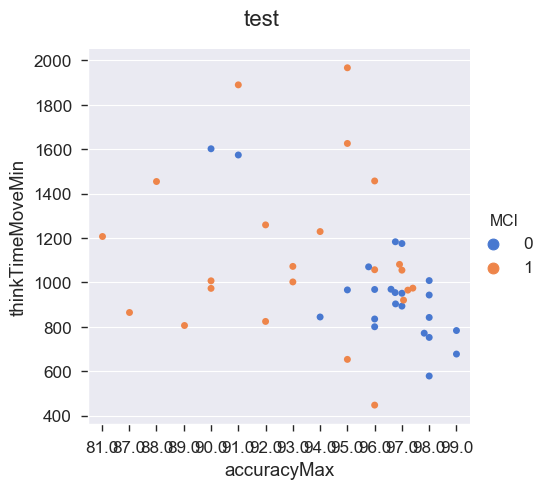

In [19]:
#We zien hier dat de correlatie tusesn thinkTimeMoveMin en accuracyMax is grotendeels te wijten aan de MCI person met de hoge thinkTimeMoveMin
#healthies hebben een hoge accuracy en lage thinkTimeMoveMin
test = sns.catplot(x="accuracyMax", y='thinkTimeMoveMin', hue="MCI", data=data, kind="swarm", palette="muted")
test.fig.subplots_adjust(top=0.9);
test.fig.suptitle('test', fontsize=16);

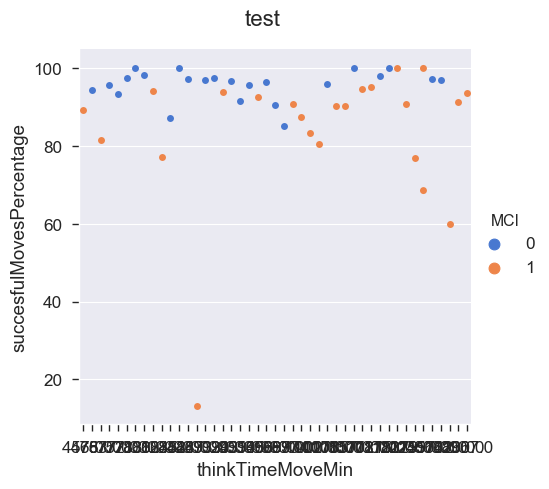

In [20]:
test = sns.catplot(x="thinkTimeMoveMin", y='succesfulMovesPercentage', hue="MCI", data=data, kind="swarm", palette="muted")
test.fig.subplots_adjust(top=0.9);
test.fig.suptitle('test', fontsize=16);

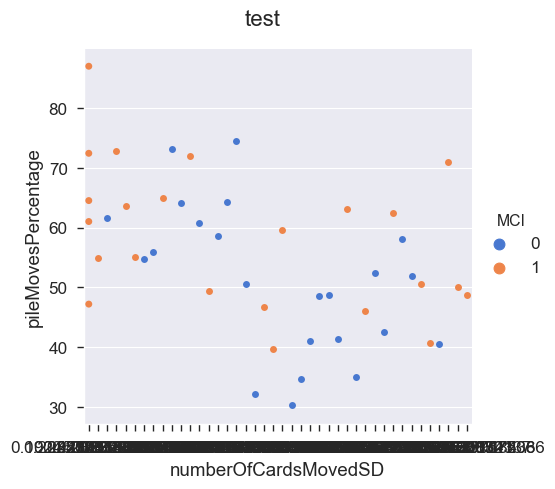

In [21]:
test = sns.catplot(x="numberOfCardsMovedSD", y='pileMovesPercentage', hue="MCI", data=data, kind="swarm", palette="muted")
test.fig.subplots_adjust(top=0.9);
test.fig.suptitle('test', fontsize=16);

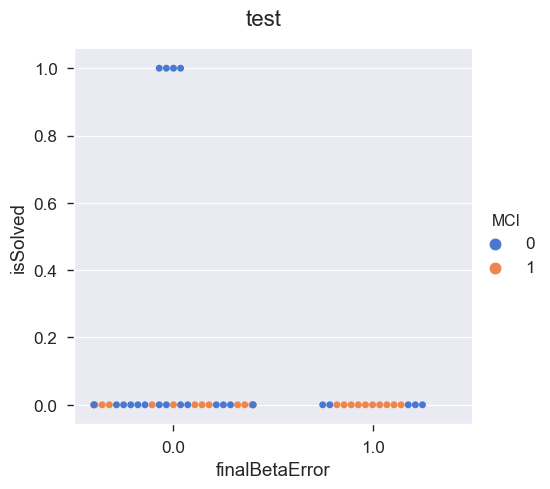

In [22]:
test = sns.catplot(x="finalBetaError", y='isSolved', hue="MCI", data=data, kind="swarm", palette="muted")
test.fig.subplots_adjust(top=0.9);
test.fig.suptitle('test', fontsize=16);

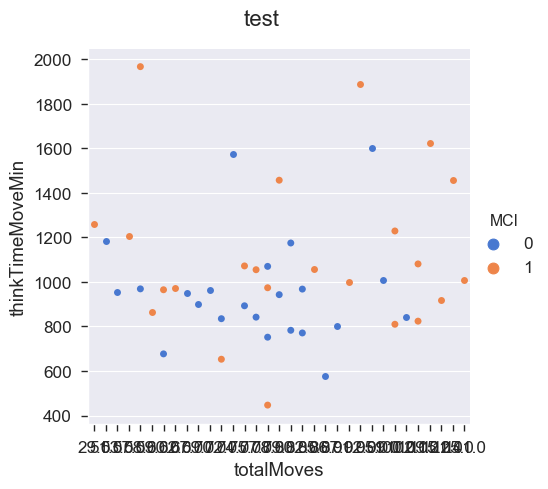

In [23]:
#Weinig zetten, weinig vooruitgeraakt in het spel. MCI's hebben een standaard hogere ThinkTime. 
test = sns.catplot(x="totalMoves", y='thinkTimeMoveMin', hue="MCI", data=data, kind="swarm", palette="muted")
test.fig.subplots_adjust(top=0.9);
test.fig.suptitle('test', fontsize=16);

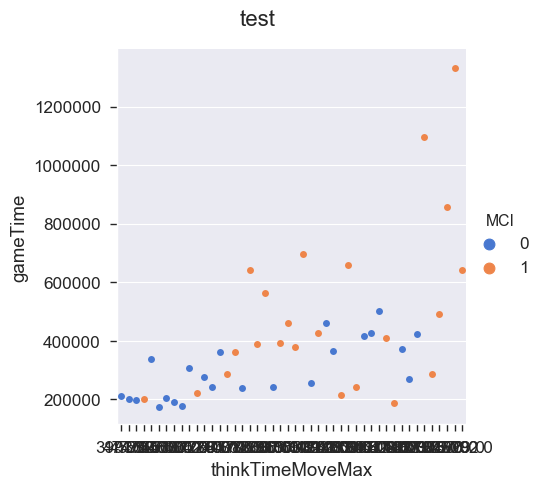

In [24]:
test = sns.catplot(x="thinkTimeMoveMax", y='gameTime', hue="MCI", data=data, kind="swarm", palette="muted")
test.fig.subplots_adjust(top=0.9);
test.fig.suptitle('test', fontsize=16);

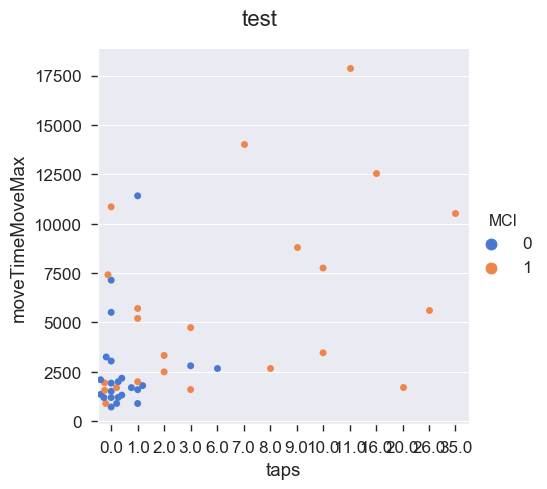

In [25]:
#Mensen die lang deden over zetten te doen, hebben vaker ook taps. <- fysieke problemen
test = sns.catplot(x="taps", y='moveTimeMoveMax', hue="MCI", data=data, kind="swarm", palette="muted")
test.fig.subplots_adjust(top=0.9);
test.fig.suptitle('test', fontsize=16);

In [26]:
#use STAD
## Load the data
## Extract the values we want to use in our distance, the lens, and optional features
values = data[['moveTimeMoveMax','score']].values.astype(int).tolist()
#lens = data['pileMovesPercentage'].astype(int).map(lambda x:stad.hex_to_hsv(x)[0]).values
xs = data['moveTimeMoveMax'].values.astype(int).tolist()
ys = data['score'].values.astype(int).tolist()
hues = data['MCI'].values.astype(int).tolist()

## Create the distance matrix in the high_dimensional space. This can be using
## cosine distance, euclidean, or any other.
#highD_dist_matrix = stad.calculate_highD_dist_matrix(values)

## Run STAD and show the result
#g = stad.run_stad(highD_dist_matrix, lens=lens, features={'x':xs, 'y':ys, 'hue': hues})
#stad.draw_stad(g)

# Feature Selection

Things we can consider before starting to model:
* Creating new features: did that the past few years. Also chance on creating spurious relationships. Creating features such as 'average think time times the median accuracy' can also hinder our models explainability.
* Run a random forest to see what the most important features are
* Look at permutation Importance
* Run a more advanced selection method such as t-SNE or STAD from Jan Aerts


Generally speaking, we should try to craft as many features as we can and have faith in the model’s ability to pick up the most significant features. Yet there’s still something to gain from feature selection beforehand:

The simplest way to inspect feature importance is by fitting a random forest model. There are more robust feature selection algorithms (e.g. this) which are theoretically superior but not practicable due to the absence of efficient implementation. You can combat noisy data (to an extent) simply by increasing number of trees used in a random forest.

Another popular method for feature reduction t-Stochastic Neighbor Embedding (t-SNE), which does non-linear dimensionality reduction. People typically use t-SNE for data visualization, but you can also use it for machine learning tasks like reducing the feature space and clustering, to mention just a few.

* t-SNE: https://github.com/gauss256/t-SNE 
* Feature Selection: https://towardsdatascience.com/feature-selection-with-pandas-e3690ad8504b   https://scikit-learn.org/stable/modules/feature_selection.html
* permutation importance: https://scikit-learn.org/stable/modules/generated/sklearn.inspection.permutation_importance.html
  
General reads:
* https://towardsdatascience.com/feature-engineering-and-data-preparation-using-supermarket-sales-data-part-2-171b7a7a7eb7
* https://medium.com/open-machine-learning-course/open-machine-learning-course-topic-6-feature-engineering-and-feature-selection-8b94f870706a



In [27]:
#data = data.drop(['age', 'personID'], axis=1) #unnessecary for ML


In [28]:
X= data.drop('MCI',axis=1)
y= data.MCI
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=7)

In [28]:
wideX= wideData.drop('MCI',axis=1)
widey= wideData.MCI
wideX_train, wideX_test, widey_train, widey_test = train_test_split(wideX, widey, stratify=widey, random_state=7)

In [29]:
#Let's fit a simple, unoptimised RF Classifier to see what the most important features are.

rf = Pipeline([
    ('classifier', RandomForestClassifier(min_samples_leaf=3))
])

rf.fit(X_train, y_train)
print("RF train accuracy: %0.3f" % rf.score(X_train, y_train))
print("RF test accuracy: %0.3f" % rf.score(X_test, y_test))

RF train accuracy: 0.941
RF test accuracy: 0.833


In [30]:
tree_feature_importances = pd.DataFrame(rf['classifier'].feature_importances_, index = X_train.columns, columns=['importance']).sort_values('importance',ascending=True);
tree_feature_importances

,importance
finalBetaError,0.000000
erroneousMovesPercentage,0.002908
thinkTimeMoveMax,0.007796
succesfulMovesPercentage,0.010430
totalTimeMoveSD,0.011525
suitErrorPercentage,0.011706
accuracySD,0.011971
moveTimeMoveMin,0.013633
taps,0.015945
moveTimeMoveMax,0.017243


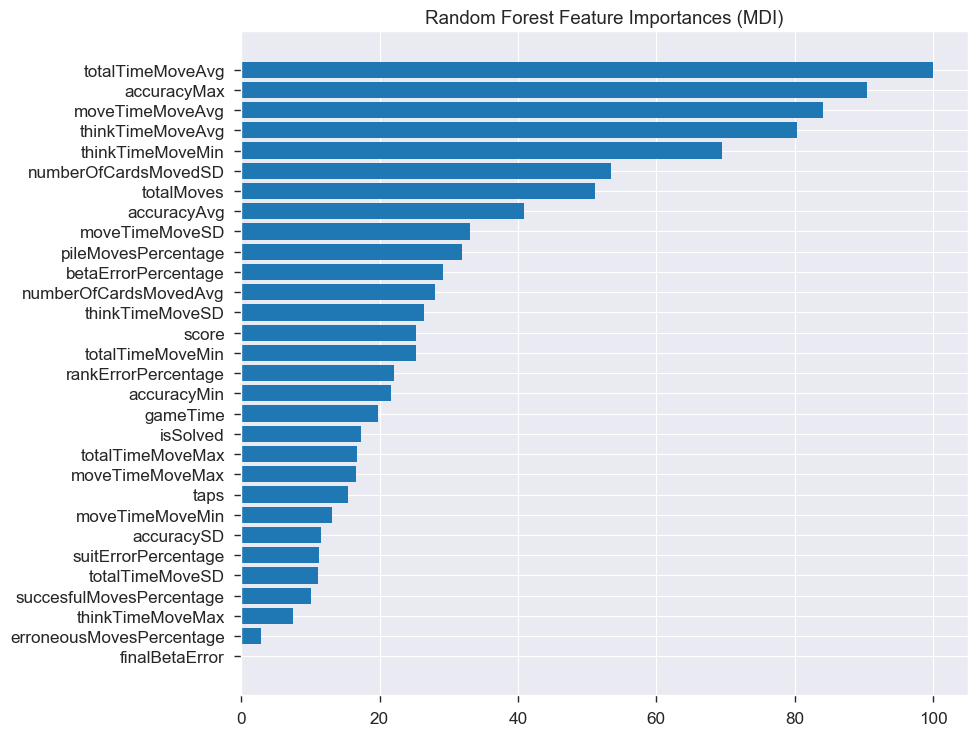

In [31]:
#Plot relative feature importances

tree_feature_importances.importance = 100.0 * (tree_feature_importances.importance.values / tree_feature_importances.importance.values.max())
y_ticks = np.arange(0, len(tree_feature_importances.importance.values))
fig, ax = plt.subplots()
ax.barh(y_ticks, tree_feature_importances.importance.values)
ax.set_yticklabels(tree_feature_importances.index)
ax.set_yticks(y_ticks)
ax.set_title("Random Forest Feature Importances (MDI)")
fig.tight_layout()
fig.set_size_inches(11,8)
plt.show()


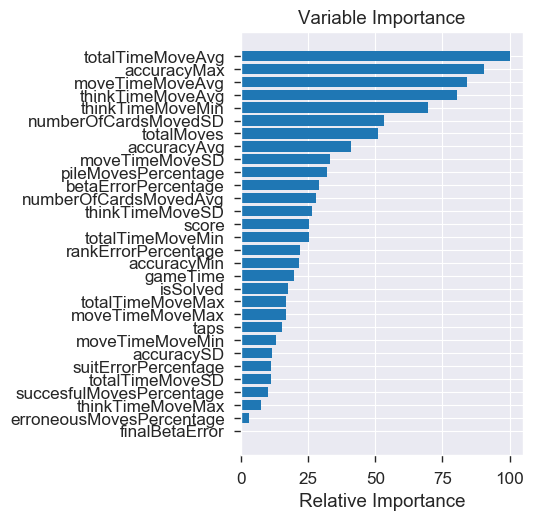

In [32]:

feature_importance = rf['classifier'].feature_importances_
# make importances relative to max importance
feature_importance = 100.0 * (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + .5
plt.subplot(1, 2, 2)
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, X_train.columns[sorted_idx])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
fig.tight_layout()
fig.set_size_inches(11,20)
plt.show()

In [33]:
result = permutation_importance(rf, X_train, y_train, n_repeats=10,random_state=7, n_jobs=2)

permutation_feature_importances = pd.DataFrame(result.importances_mean, index = X_train.columns, columns=['importance']).sort_values('importance',ascending=False)
permutation_feature_importances



,importance
totalMoves,0.029412
moveTimeMoveMin,0.026471
totalTimeMoveSD,0.026471
betaErrorPercentage,0.023529
accuracySD,0.023529
thinkTimeMoveMax,0.023529
accuracyMin,0.020588
numberOfCardsMovedAvg,0.017647
totalTimeMoveMin,0.017647
numberOfCardsMovedSD,0.017647


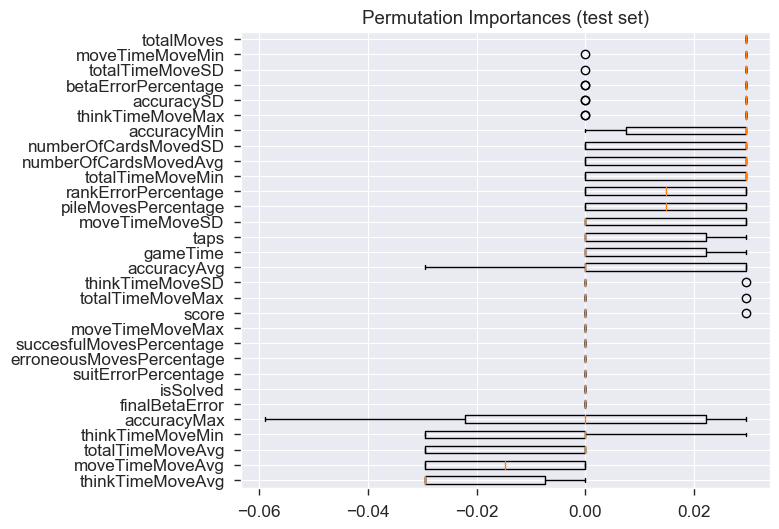

In [34]:
#Here timebased digital biomarkers are once again king. A lot of features however are put as importance 0.
#The trees are probably too small to contain most features.
sorted_idx = result.importances_mean.argsort()

fig, ax = plt.subplots()
ax.boxplot(result.importances[sorted_idx].T,
           vert=False, labels=X_train.columns[sorted_idx])
ax.set_title("Permutation Importances (test set)")
fig.tight_layout()
plt.show()

Issue: When comparing the impurity-based feature importance of RandomForestClassifier with the permutation importance. It can be shown that the impurity-based feature importance can inflate the importance of numerical features.
  
Furthermore, the impurity-based feature importance of random forests suffers from being computed on statistics derived from the training dataset: the importances can be high even for features that are not predictive of the target variable, as long as the model has the capacity to use them to overfit.

* impurity-based importances are biased towards high cardinality features;

* impurity-based importances are computed on training set statistics and therefore do not reflect the ability of feature to be useful to make predictions that generalize to the test set (when the model has enough capacity).


**Run t-SNE**  
t-distributed Stochastic Neighbor Embedding.

t-SNE [1] is a tool to visualize high-dimensional data. It converts similarities between data points to joint probabilities and tries to minimize the Kullback-Leibler divergence between the joint probabilities of the low-dimensional embedding and the high-dimensional data. t-SNE has a cost function that is not convex, i.e. with different initializations we can get different results.

It is highly recommended to use another dimensionality reduction method (e.g. PCA for dense data or TruncatedSVD for sparse data) to reduce the number of dimensions to a reasonable amount (e.g. 50) if the number of features is very high. This will suppress some noise and speed up the computation of pairwise distances between samples. For more tips see Laurens van der Maaten’s FAQ [2].

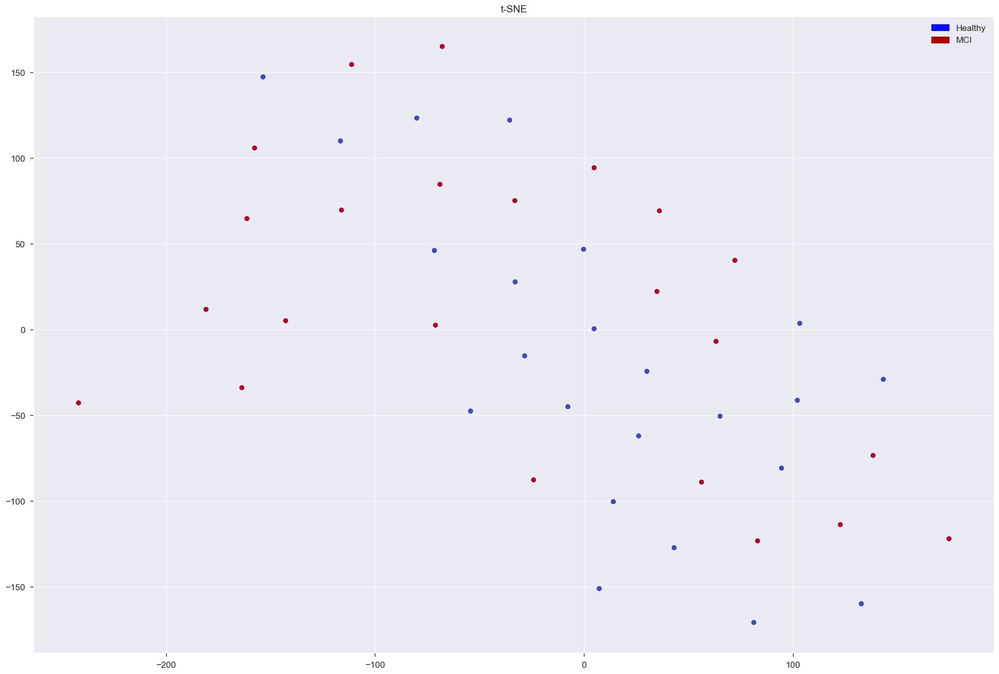

In [35]:
#Run t-SNE
import matplotlib.patches as mpatches
from sklearn.manifold import TSNE
X_reduced_tsne = TSNE(n_components=2, random_state=7).fit_transform(X.values)


f, ax = plt.subplots(figsize=(24,16))


blue_patch = mpatches.Patch(color='#0A0AFF', label='Healthy')
red_patch = mpatches.Patch(color='#AF0000', label='MCI')

ax.scatter(X_reduced_tsne[:,0], X_reduced_tsne[:,1], c=(y == 0), cmap='coolwarm', label='Healthy', linewidths=2)
ax.scatter(X_reduced_tsne[:,0], X_reduced_tsne[:,1], c=(y == 1), cmap='coolwarm', label='MCI', linewidths=2)
ax.set_title('t-SNE', fontsize=14)

ax.grid(True)

ax.legend(handles=[blue_patch, red_patch])

# Data Preprocessing

This step is mainly covered by the data cleaning in the previous notebook.


**Encode categorical variables** if necessary.
  
Perhaps also **whiten the data**? Clasically a more deep learning transformation for images. But before or after feature selection? https://medium.com/free-code-camp/https-medium-com-hadrienj-preprocessing-for-deep-learning-9e2b9c75165c





# Model Selection

**This is the start of the pipe building** 
Training, checking for under/overfitting, performance, .. General pipe stuff. Also try rfe.

Pipeline reads:
* https://medium.com/vickdata/a-simple-guide-to-scikit-learn-pipelines-4ac0d974bdcf
* https://towardsdatascience.com/a-simple-example-of-pipeline-in-machine-learning-with-scikit-learn-e726ffbb6976
* https://towardsdatascience.com/use-scikit-learn-pipelines-to-clean-data-and-train-models-faster-82a5171f50dc
* https://medium.com/python-data/implementing-the-model-selection-triple-with-sklearns-machine-learning-classification-pipelines-1375162da2d1


Nieuwigheden SKLearn
* https://scikit-learn.org/stable/modules/generated/sklearn.metrics.plot_roc_curve.html
* https://scikit-learn.org/stable/modules/generated/sklearn.metrics.precision_recall_curve.html
* https://scikit-learn.org/stable/modules/generated/sklearn.metrics.plot_confusion_matrix.html
* https://scikit-learn.org/stable/modules/tree.html#minimal-cost-complexity-pruning
* https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_auc_score.html
  
Interesting new models:
* Comparison boosting models: https://towardsdatascience.com/catboost-vs-light-gbm-vs-xgboost-5f93620723db
* XGBoost:  https://towardsdatascience.com/https-medium-com-vishalmorde-xgboost-algorithm-long-she-may-rein-edd9f99be63d?source=bookmarks---------4----------------------- 
* Auto SKLearn: https://automl.github.io/auto-sklearn/master/   
  
General reads:
* Start, very nice read. also recommends starting algo's: https://towardsdatascience.com/what-is-the-best-starter-model-in-table-data-ml-lessons-from-a-high-rank-kagglers-new-book-f08b821db797 
* Nice notebook on training classification https://github.com/lksfr/credit_card_fraud/tree/master
* https://towardsdatascience.com/modeling-teaching-a-machine-learning-algorithm-to-deliver-business-value-ad0205ca4c86
* https://towardsdatascience.com/creating-machine-learning-models-b48bb72a791f

Notes:
*  you need to append the name that you have given the classifier part of your pipeline to each parameter name.



## First Run: Train models as is

Thoughts:
* Train set: train multiple models, models sees and learns from this data. Validation set: Tune hyperparameters and select the best model- Model sees the data, but does not learn the data. Test: evaluate the best model - this data never touched the model before, not for parameter tuning not for training


In [36]:
from sklearn.model_selection import StratifiedKFold

SCORING = 'f1'
FOLDS = 5

skf = StratifiedKFold(n_splits=FOLDS, shuffle=True, random_state=7)
cv = skf


In [37]:
#Plot LearningCurve
from sklearn.model_selection import learning_curve
from sklearn.model_selection import ShuffleSplit

def plot_learning_curve(estimator, title, X, y, ylim=None, cv=cv, n_jobs=None, scoring=SCORING, train_sizes=np.linspace(.1, 1.0, 5)):
    
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(estimator, X, y, cv=cv, scoring=scoring, n_jobs=n_jobs, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)


    
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt

In [38]:
def ScoreDataFrame(names,results):
    def floatingDecimals(f_val, dec=3):
        prc = "{:."+str(dec)+"f}" 
    
        return float(prc.format(f_val))

    scores = []
    for r in results:
        scores.append(floatingDecimals(r.mean(),4))

    scoreDataFrame = pd.DataFrame({'Model':names, 'Score': scores})
    return scoreDataFrame

Now at model: DummyClassifier


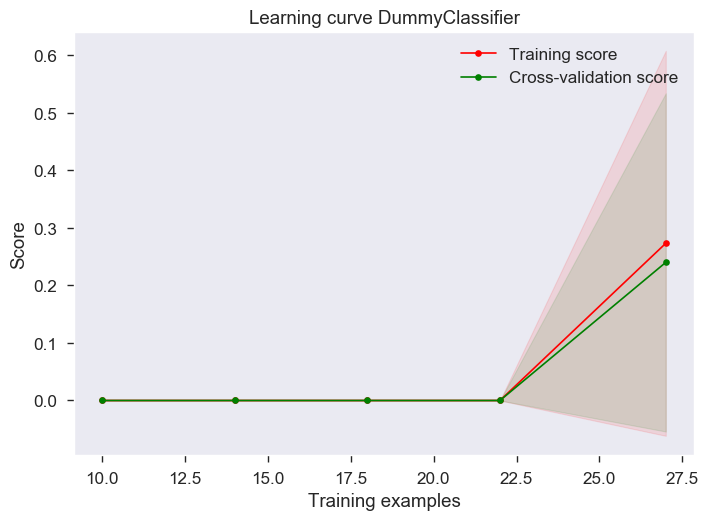

Cross Validated Training score: 0.24 (+/- 0.29)
Now at model: LogisticRegression


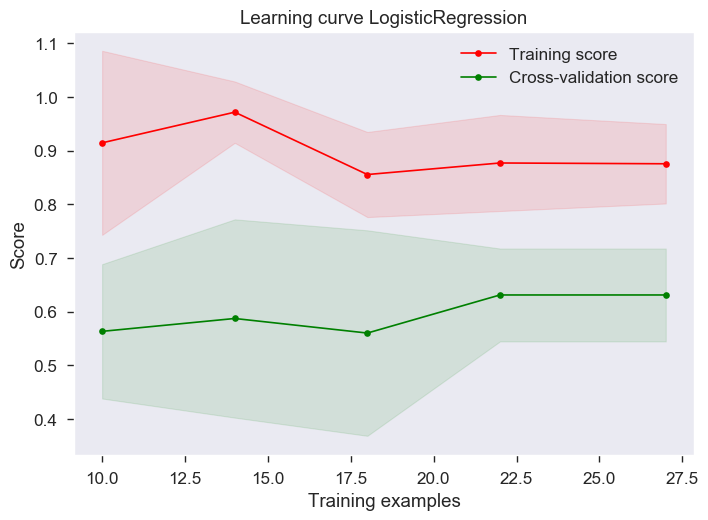

Cross Validated Training score: 0.63 (+/- 0.09)
Now at model: SGDClassifier


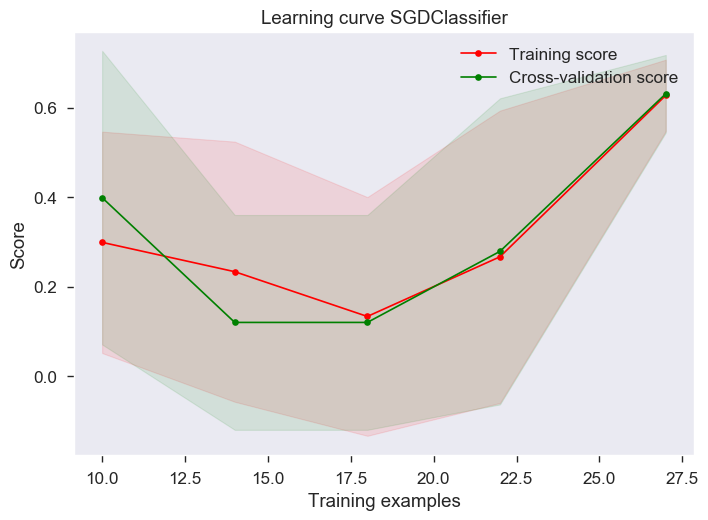

Cross Validated Training score: 0.42 (+/- 0.35)
Now at model: LogisticRegressionCV


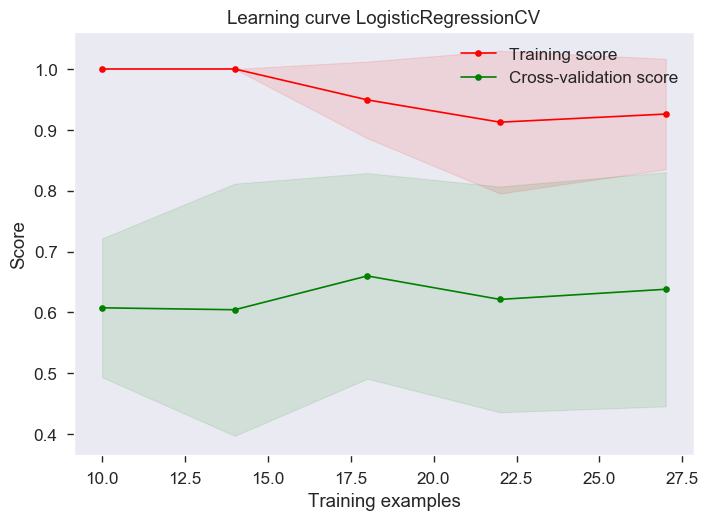

Cross Validated Training score: 0.64 (+/- 0.19)
Now at model: RandomForestClassifier


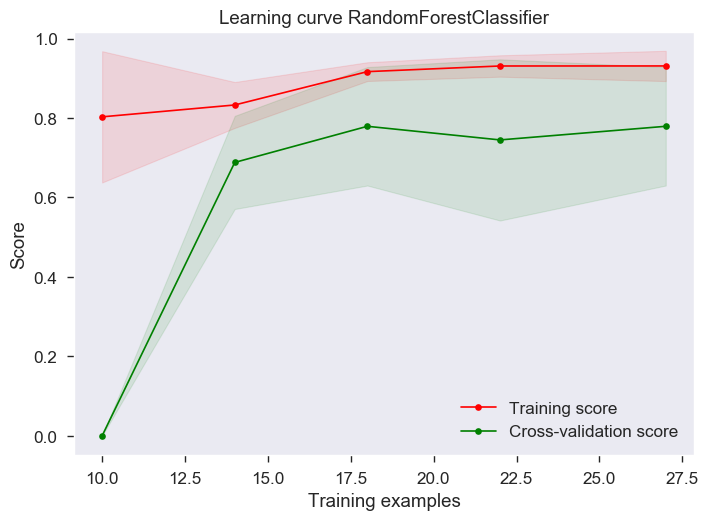

Cross Validated Training score: 0.75 (+/- 0.11)
Now at model: ExtraTreesClassifier


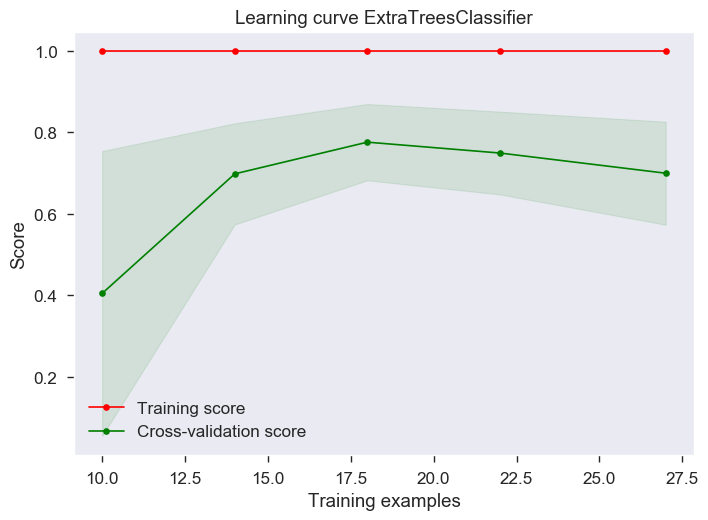

Cross Validated Training score: 0.78 (+/- 0.09)
Now at model: GradientBoostingClassifier


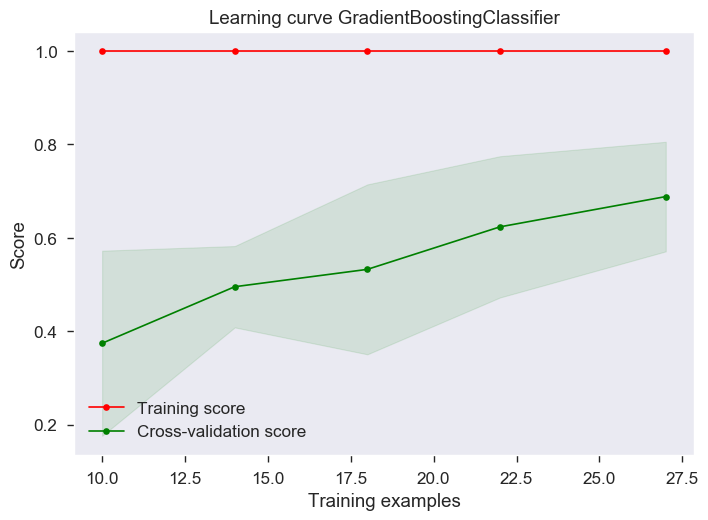

Cross Validated Training score: 0.55 (+/- 0.30)
Now at model: BaggingClassifier


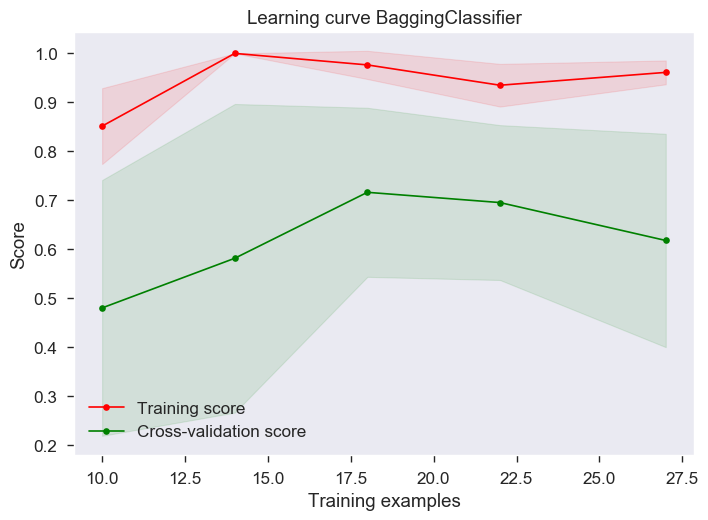

Cross Validated Training score: 0.82 (+/- 0.15)
Now at model: AdaBoostClassifier


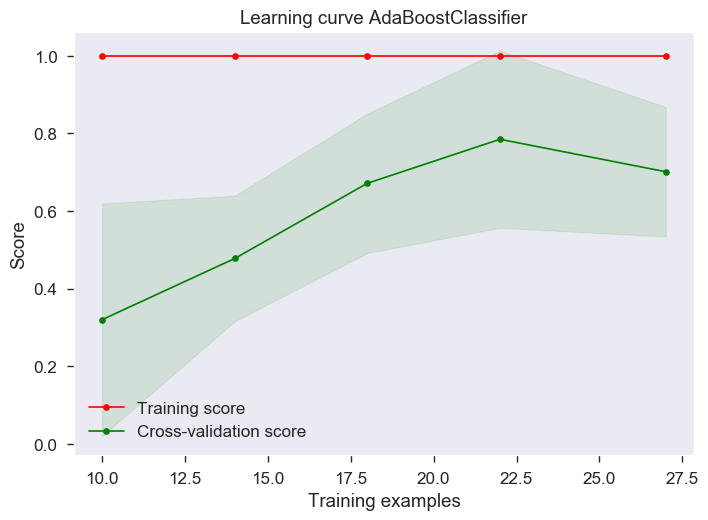

Cross Validated Training score: 0.70 (+/- 0.17)
Now at model: XGBClassifier


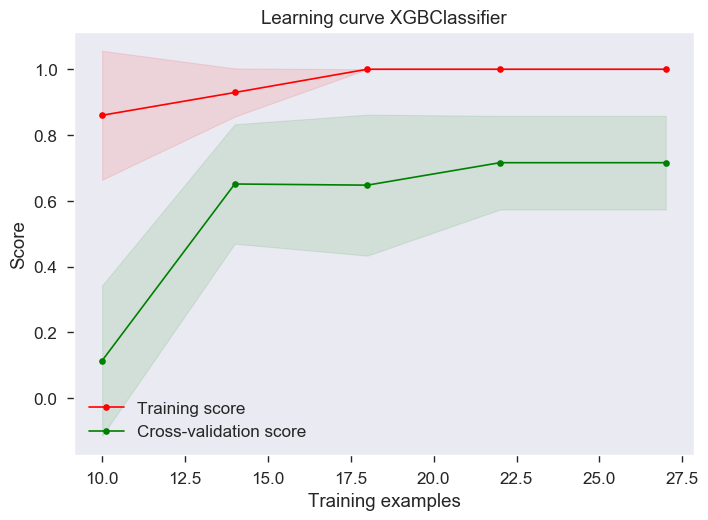

Cross Validated Training score: 0.78 (+/- 0.09)
Now at model: XGBRFClassifier


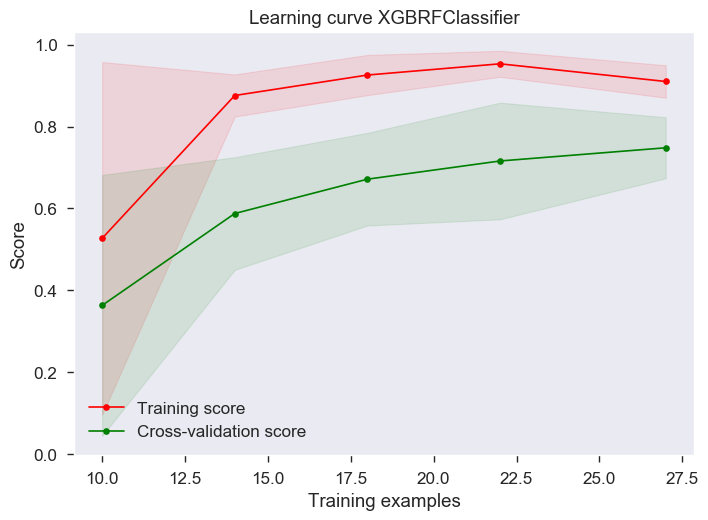

Cross Validated Training score: 0.75 (+/- 0.07)
Now at model: MLPClassifier


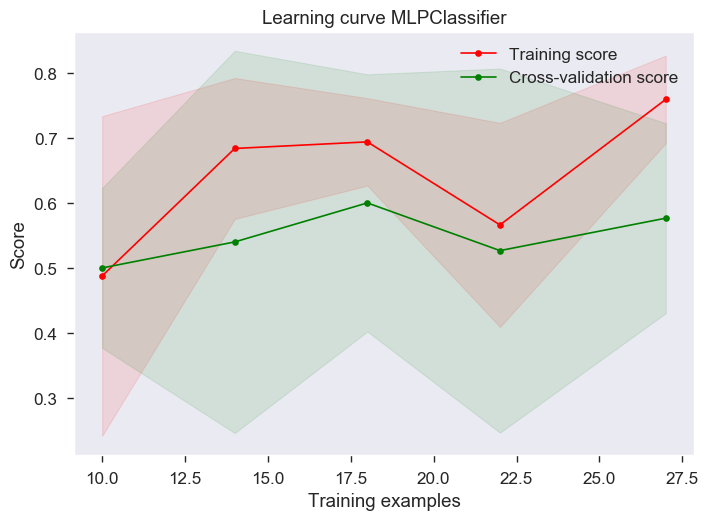

Cross Validated Training score: 0.69 (+/- 0.11)
Now at model: LinearSVC


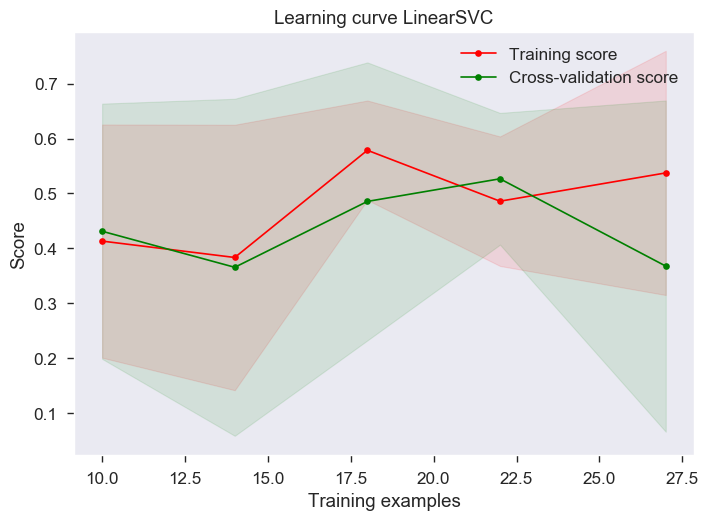

Cross Validated Training score: 0.49 (+/- 0.25)
Now at model: NuSVC


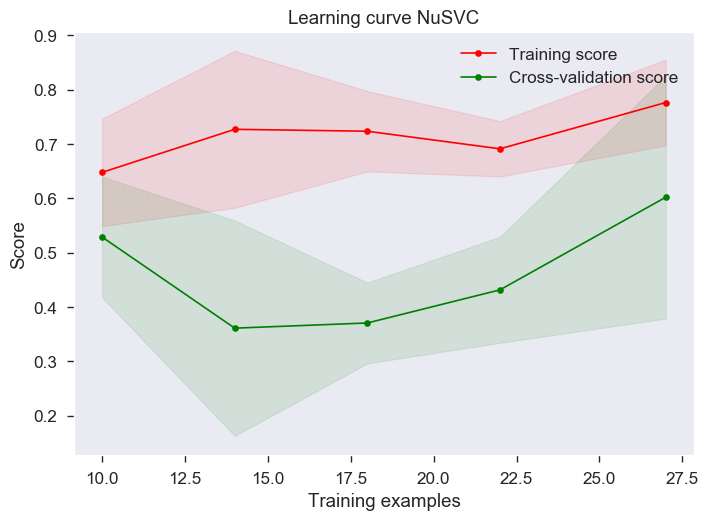

Cross Validated Training score: 0.57 (+/- 0.22)
Now at model: SVC


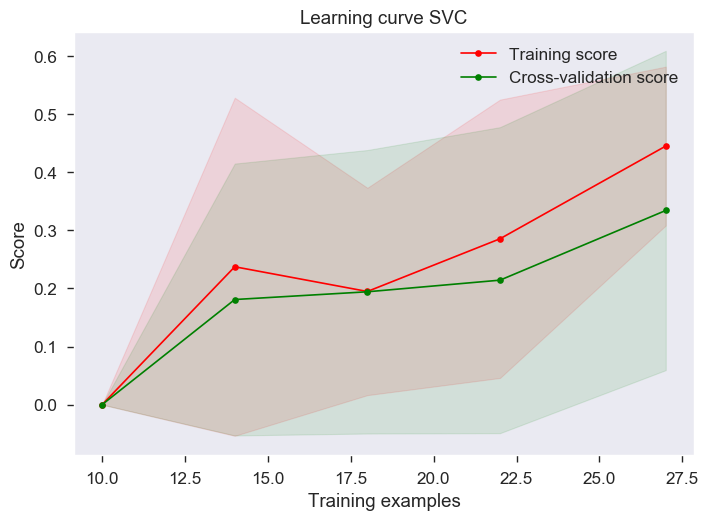

Cross Validated Training score: 0.33 (+/- 0.27)
Now at model: GaussianNB


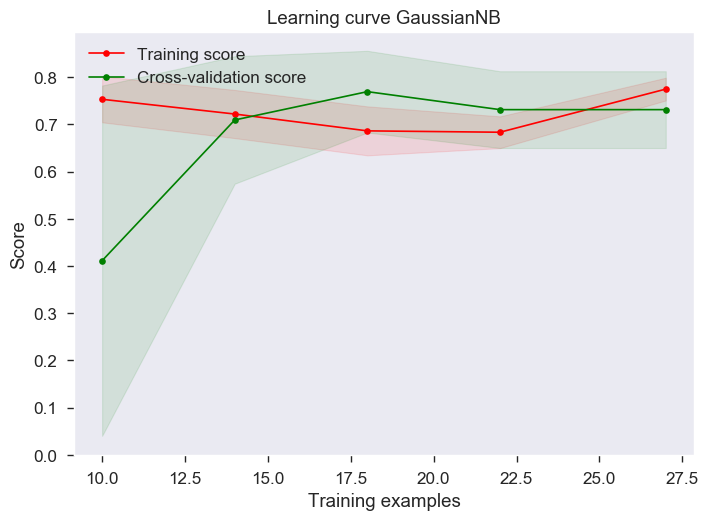

Cross Validated Training score: 0.73 (+/- 0.08)
Now at model: DecisionTreeClassifier


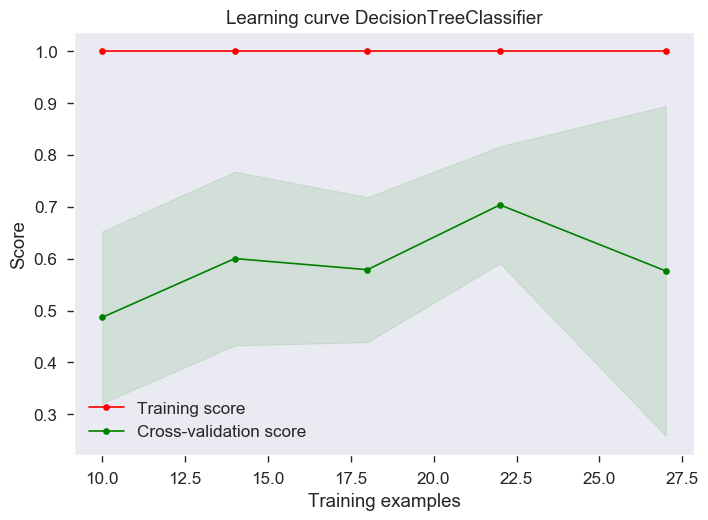

Cross Validated Training score: 0.60 (+/- 0.35)
Now at model: QuadraticDiscriminantAnalysis


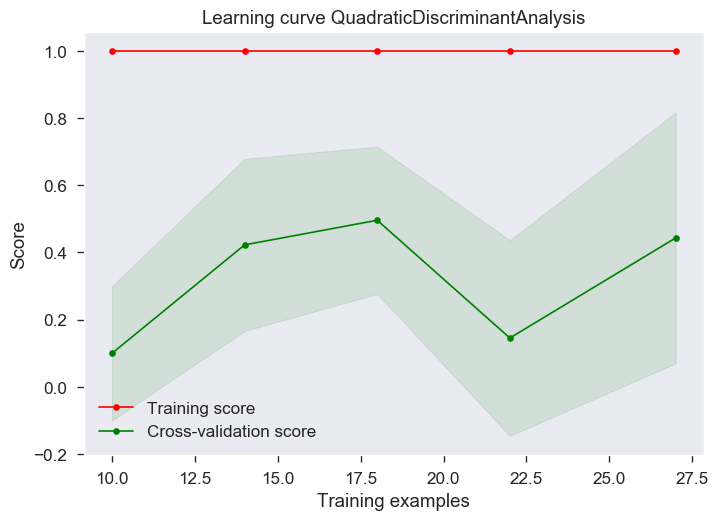

Cross Validated Training score: 0.44 (+/- 0.37)
Now at model: KNeighborsClassifier


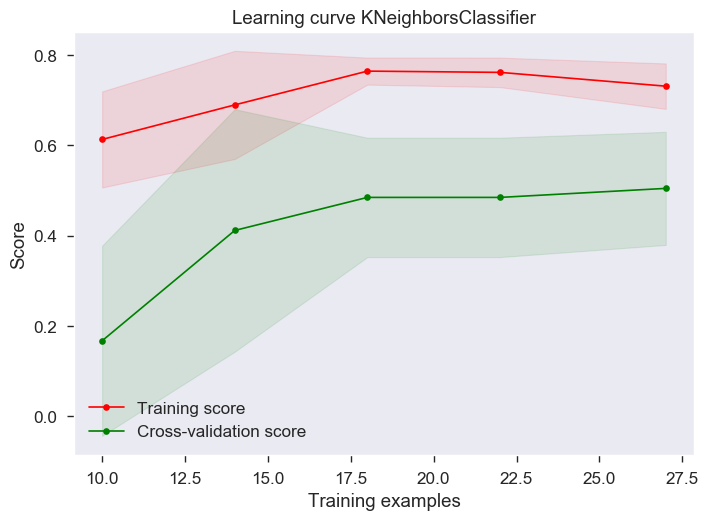

Cross Validated Training score: 0.54 (+/- 0.18)
Now at model: GaussianProcessClassifier


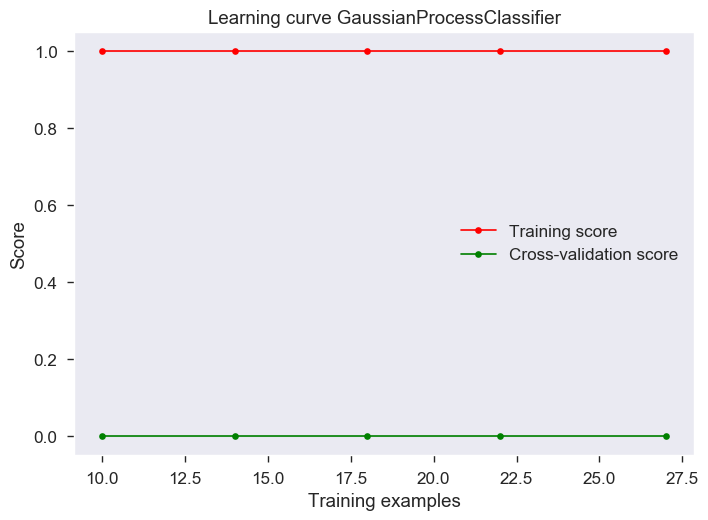

Cross Validated Training score: 0.00 (+/- 0.00)


In [39]:
from sklearn.metrics import accuracy_score, log_loss
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC, NuSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn import metrics
from sklearn.dummy import DummyClassifier
from sklearn import linear_model
from sklearn.linear_model import LogisticRegressionCV
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier, XGBRFClassifier
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression



classifiers = [
    DummyClassifier(strategy='most_frequent'), 
    LogisticRegression(),
    linear_model.SGDClassifier(),
    LogisticRegressionCV(),
    RandomForestClassifier(min_samples_leaf=3), 
    ExtraTreesClassifier(),
    GradientBoostingClassifier(),
    BaggingClassifier(),
    AdaBoostClassifier(),
    XGBClassifier(),
    XGBRFClassifier(), 
    MLPClassifier(max_iter=1000), 
    LinearSVC(), 
    NuSVC(),
    SVC(),
    GaussianNB(),
    DecisionTreeClassifier(), 
    QuadraticDiscriminantAnalysis(),
    KNeighborsClassifier(n_neighbors=3),
    GaussianProcessClassifier(),
]

names = [
    'DC', 
    'LR',
    'SGD',
    'LRCV',
    'RF', 
    'ET',
    'GB',
    'BAG',
    'ADA',
    'XGB',
    'XGBRFC', 
    'MLP', 
    'LSVC', 
    'NuSVC',
    'SVC',
    'GNB',
    'DT', 
    'QDA',
    'KNN',
    'GPC',
]

results = []

for classifier in classifiers:
    nameModel=type(classifier).__name__

    print("Now at model: "+nameModel)

    #Create pipe
    pipe = Pipeline(steps=[('classifier', classifier)])
    #Train model
    pipe.fit(X_train, y_train);
    
    
    #Plot learning curve of training data
    plot_learning_curve(classifier, "Learning curve "+nameModel, X_train, y_train, cv=cv, scoring=SCORING, train_sizes=np.linspace(.4, 1.0, 5)) 
    plt.show()
    
    #Get General Scores
    scores = cross_val_score(pipe, X_train, y_train, cv=cv, scoring=SCORING)
    results.append(scores.mean())
    
    print("Cross Validated Training score: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std()))
    #print("Test score: %.3f" % pipe.score(X_test, y_test))




In [40]:
baseScores = ScoreDataFrame(names,results)
compareModels = pd.concat([baseScores], axis=1)
compareModels



,Model,Score
0,DC,0.2400
1,LR,0.6310
2,SGD,0.4242
3,LRCV,0.6381
4,RF,0.7505
5,ET,0.7759
6,GB,0.5548
7,BAG,0.8167
8,ADA,0.7011
9,XGB,0.7759


## Second Run: Impact of Transforming Features

**Transform data** into more normal forms with log transform or log1p: https://www.anatomisebiostats.com/uploads/2/5/4/6/25467082/biostatistician_orig.png

skewness may violate model assumptions (e.g. logistic regression) or may impair the interpretation of feature importance.

1. Identify the features which are targets for log trans
2. Transform
3. Visually inspect on improvement
4. Rerun models
5. Could run some wilkonson cox tests to see whether the skewness improved, no?
<br><br>
1. Let's see which features are most skewed  
Slightly skewed --> sqrt:
gameTime
thinkTimeMoveSD
thinkTimeMoveMin
thinkTimeMoveMax
moveTimeMoveMax
  
Heavily skewed right tail-->  natural logtransform:
totalTimeMoveAvg
totalTimeMoveSD
totalTimeMoveMin
thinkTimeMoveAvg
moveTimeMoveAvg
moveTimeMoveSD
erroneousMovesPercentage
rankErrorPercentage
suitErrorPercentage

Heavily skewed left tail --> reflect then natural log transform. HOW DO I DO THIS
succesfulMovesPercentage
'accuracyMax'


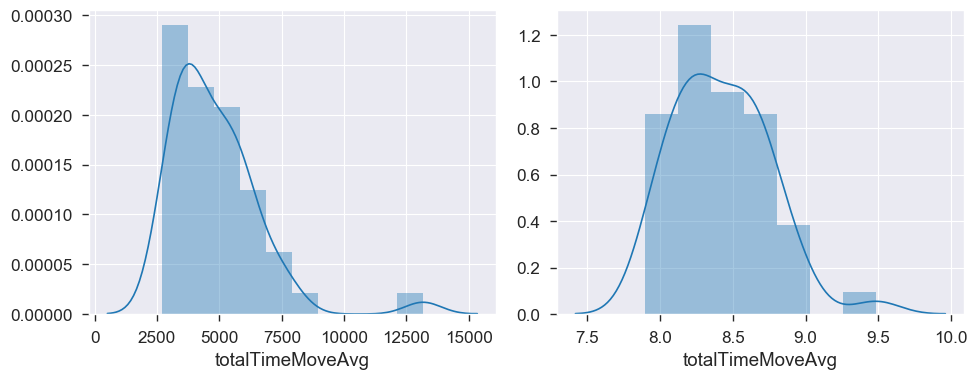

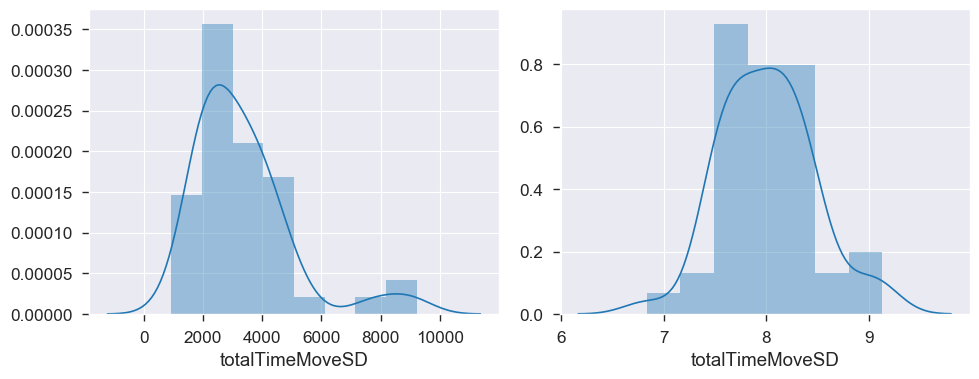

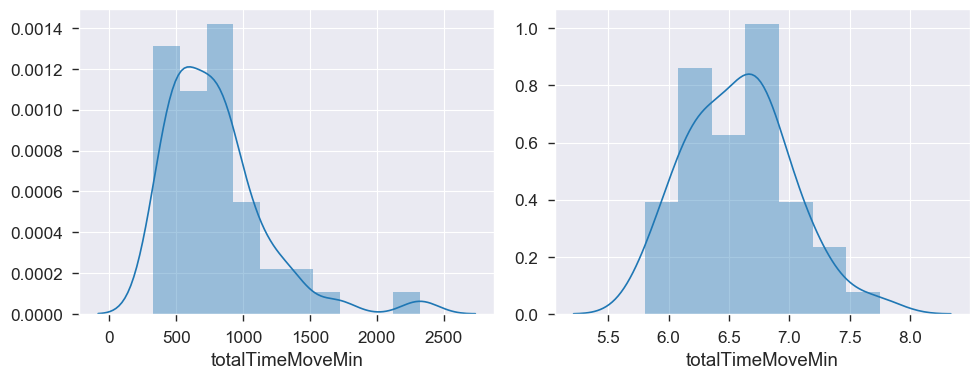

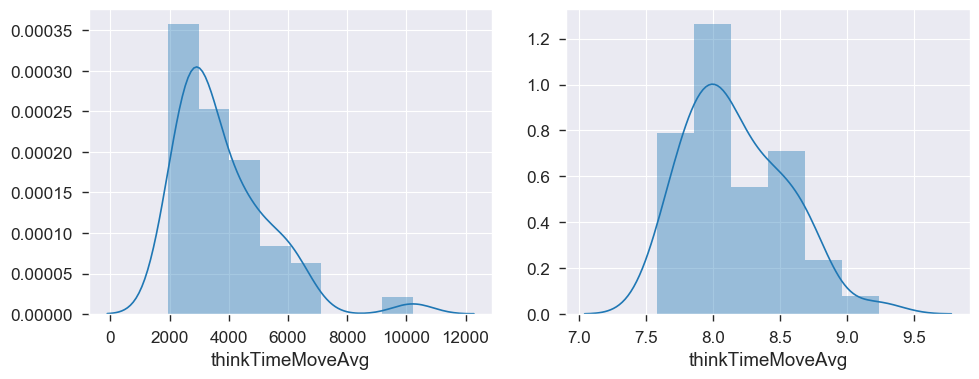

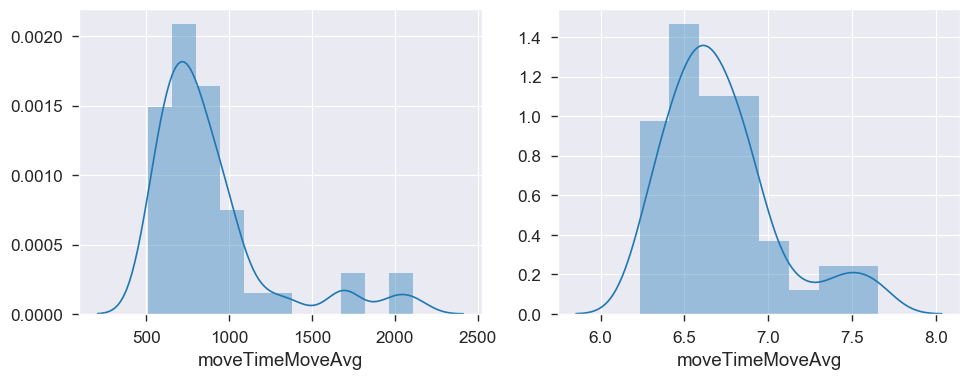

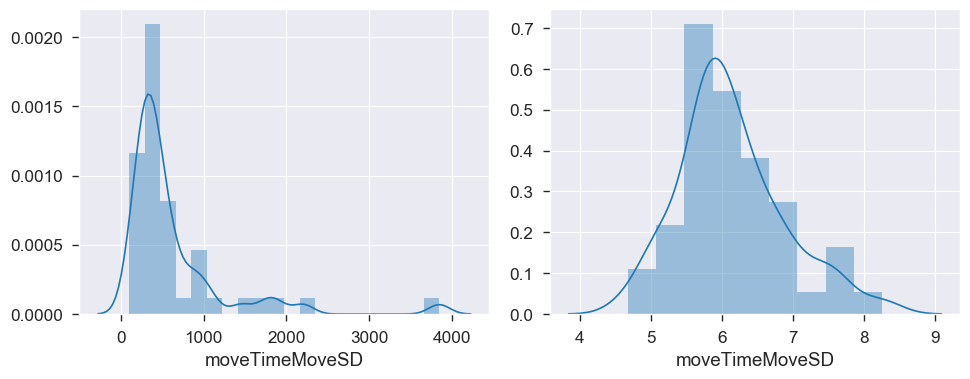

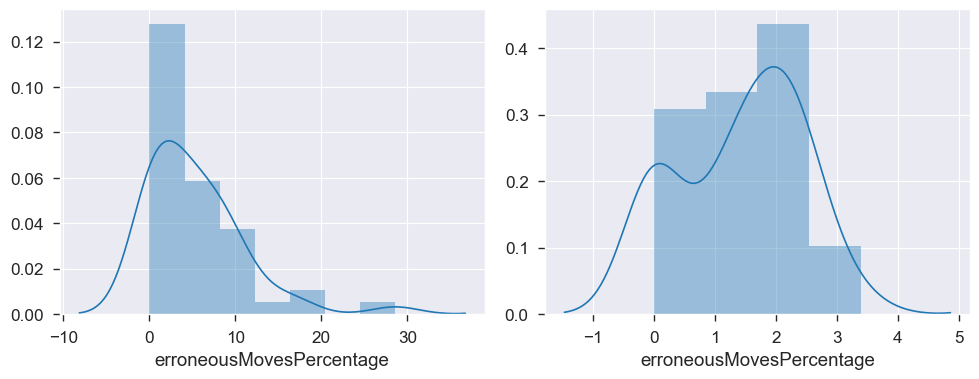

In [41]:
targets = [
'totalTimeMoveAvg',
'totalTimeMoveSD',
'totalTimeMoveMin',
'thinkTimeMoveAvg',
'moveTimeMoveAvg',
'moveTimeMoveSD',
'erroneousMovesPercentage',
]

for target in targets:
    fig, (ax1,ax2) = plt.subplots(1,2, figsize=(10,4))  # 1 row, 2 columns
    sns.distplot(data[target], ax=ax1);
    natlog = np.log1p(data[target])
    sns.distplot(natlog, ax=ax2)
    plt.tight_layout()


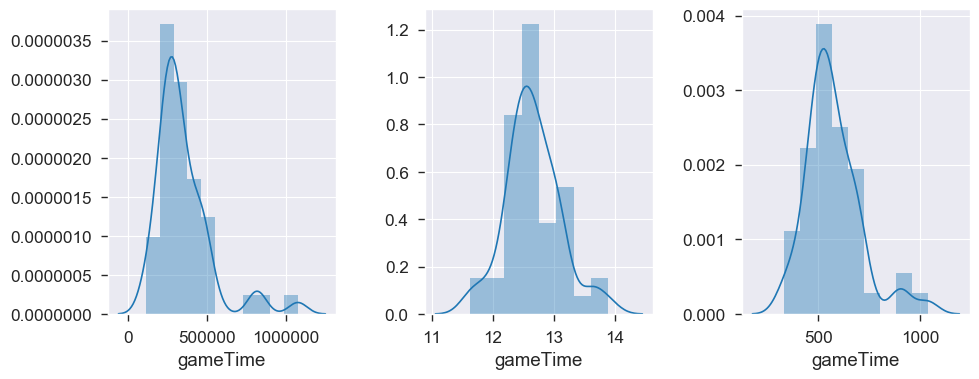

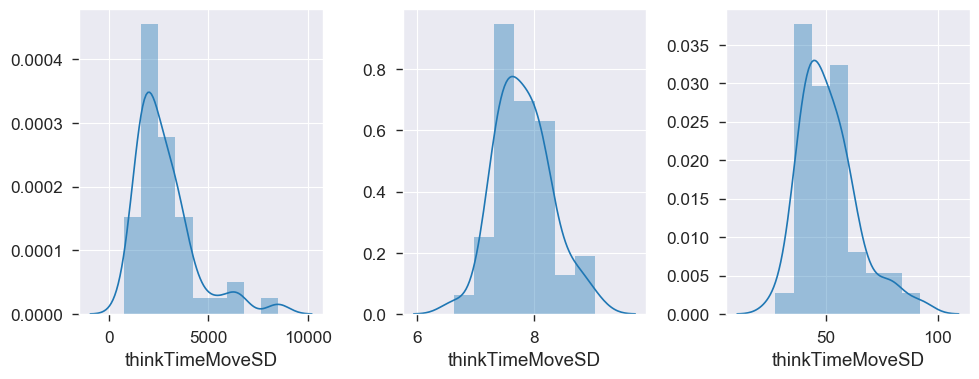

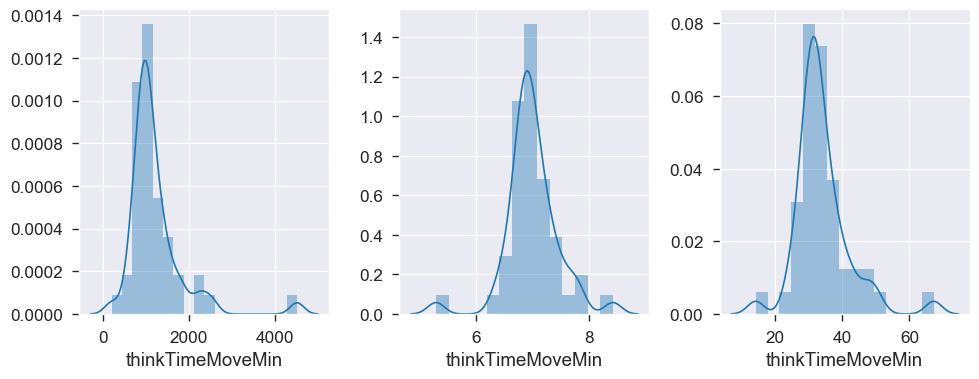

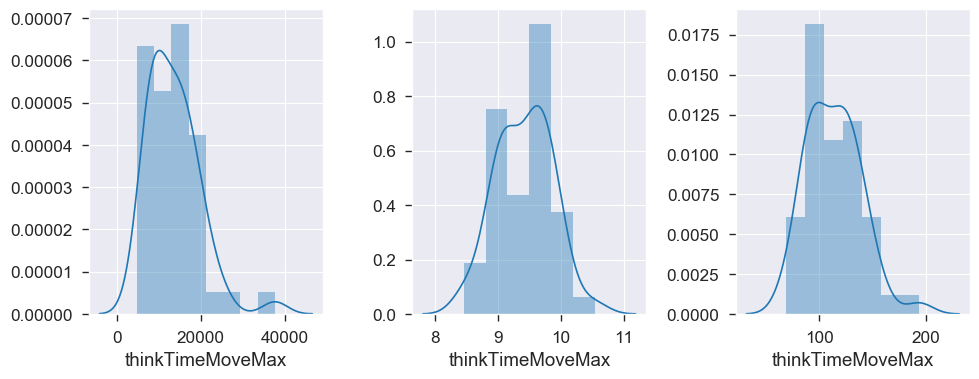

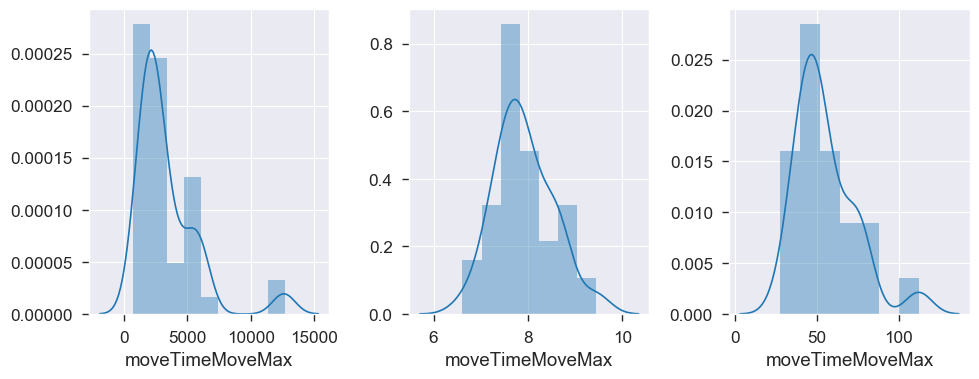

In [42]:
targets = [
'gameTime',
'thinkTimeMoveSD',
'thinkTimeMoveMin',
'thinkTimeMoveMax',
'moveTimeMoveMax',
]

for target in targets:
    fig, (ax1,ax2,ax3) = plt.subplots(1,3, figsize=(10,4))  # 1 row, 2 columns
    sns.distplot(data[target], ax=ax1);
    natlog = np.log1p(data[target])
    sns.distplot(natlog, ax=ax2)
    sqrt = np.sqrt(data[target])
    sns.distplot(sqrt, ax=ax3)
    plt.tight_layout()

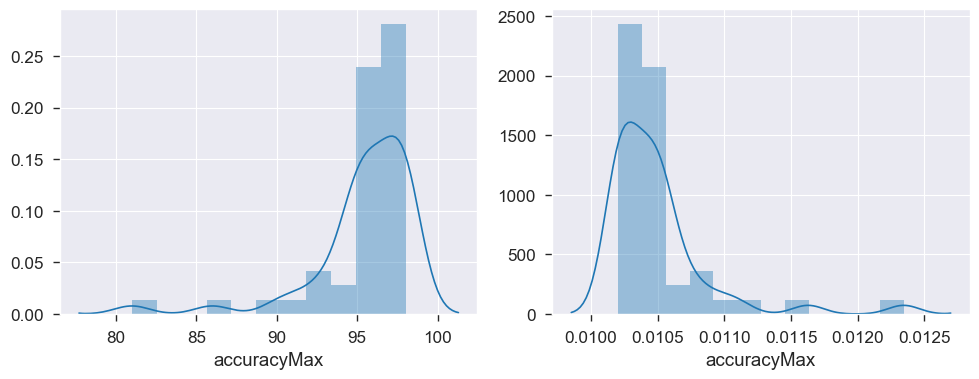

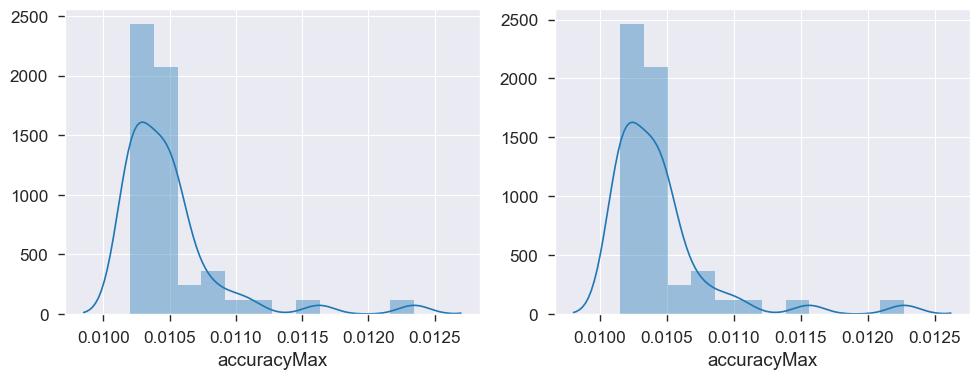

In [43]:
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(10,4))  # 1 row, 2 columns
sns.distplot(data.accuracyMax, ax=ax1);
sns.distplot(1/data.accuracyMax, ax=ax2)
plt.tight_layout()



fig, (ax1,ax2) = plt.subplots(1,2, figsize=(10,4))  # 1 row, 2 columns
test=(1/data.accuracyMax)
sns.distplot(test, ax=ax1);
natlog = np.log1p(test)
sns.distplot(natlog, ax=ax2)
plt.tight_layout()

Now at model: DummyClassifier


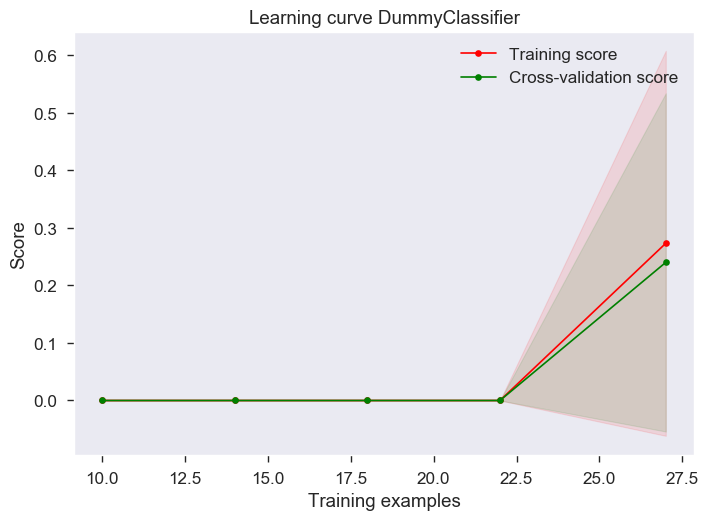

Cross Validated Training score: 0.24 (+/- 0.29)
Now at model: LogisticRegression


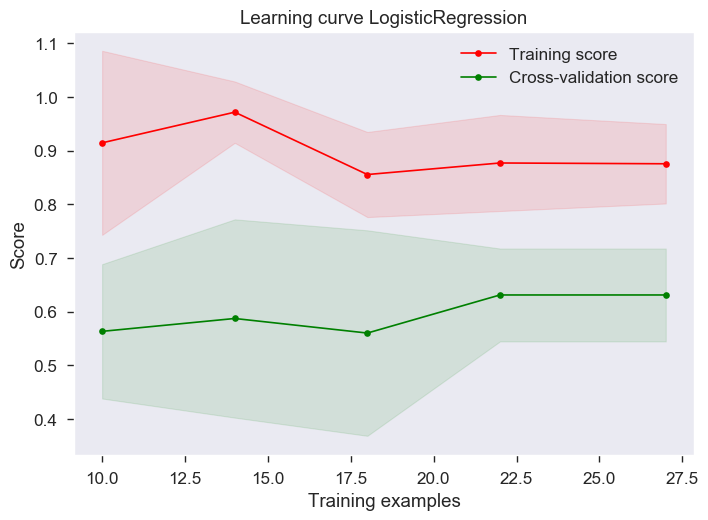

Cross Validated Training score: 0.61 (+/- 0.19)
Now at model: SGDClassifier


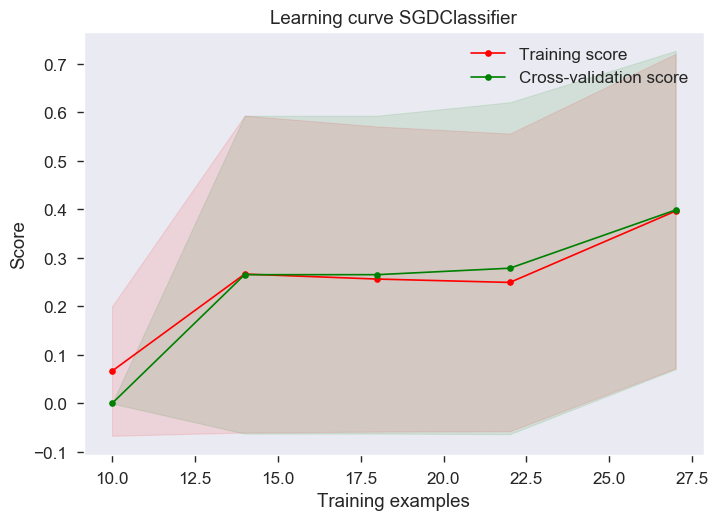

Cross Validated Training score: 0.54 (+/- 0.28)
Now at model: LogisticRegressionCV


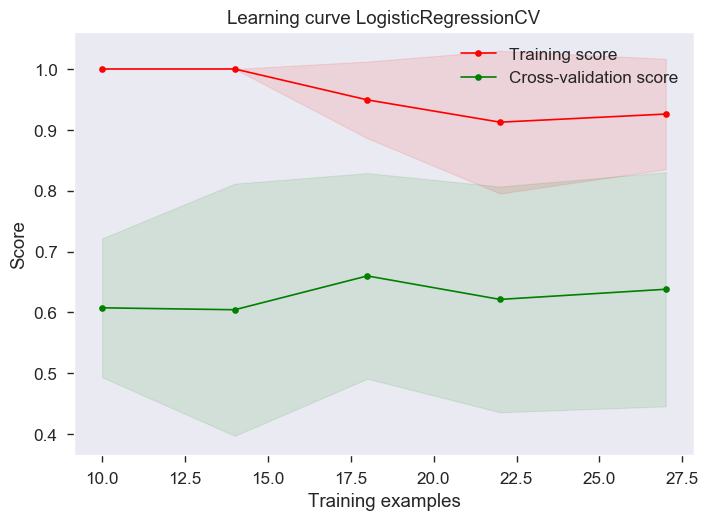

Cross Validated Training score: 0.66 (+/- 0.11)
Now at model: RandomForestClassifier


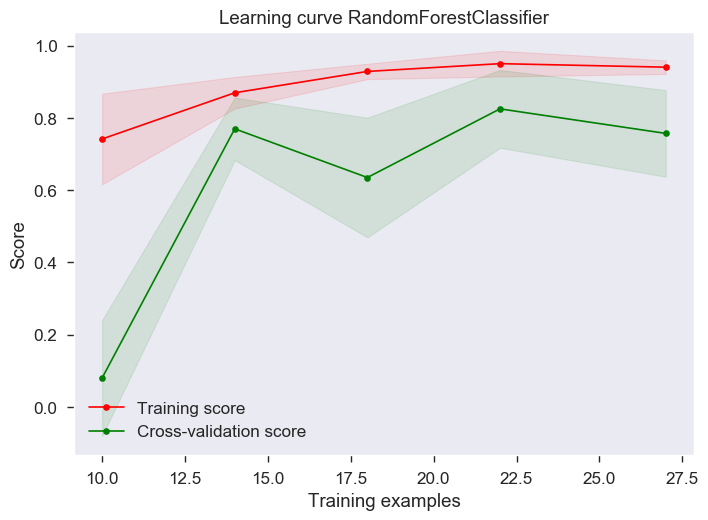

Cross Validated Training score: 0.71 (+/- 0.12)
Now at model: ExtraTreesClassifier


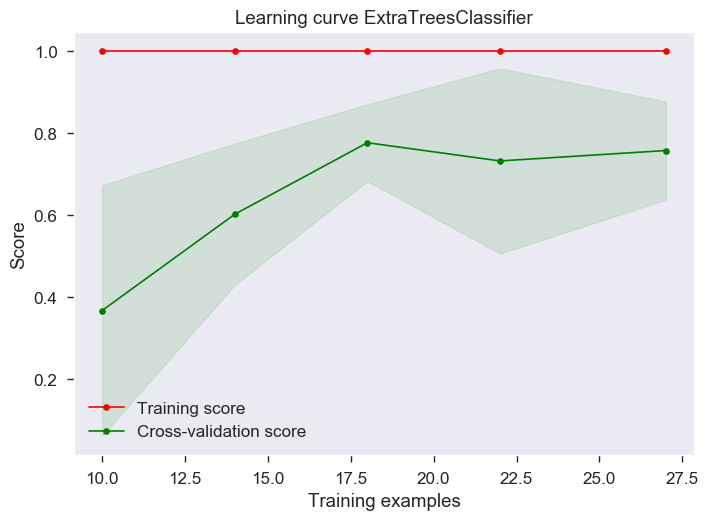

Cross Validated Training score: 0.67 (+/- 0.09)
Now at model: GradientBoostingClassifier


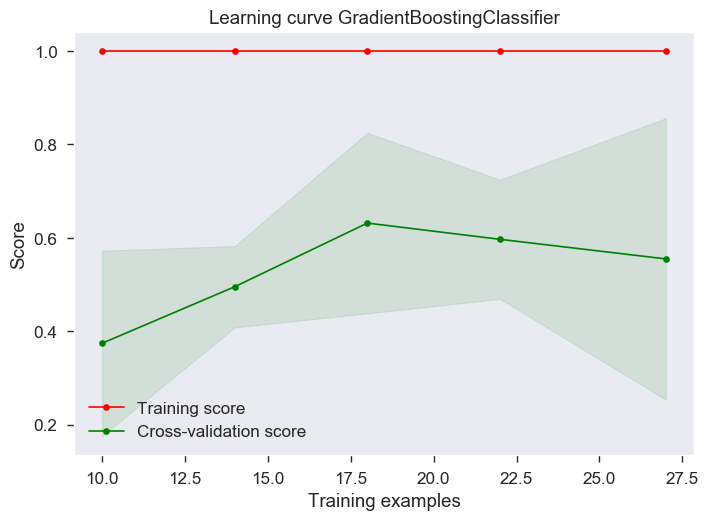

Cross Validated Training score: 0.60 (+/- 0.17)
Now at model: BaggingClassifier


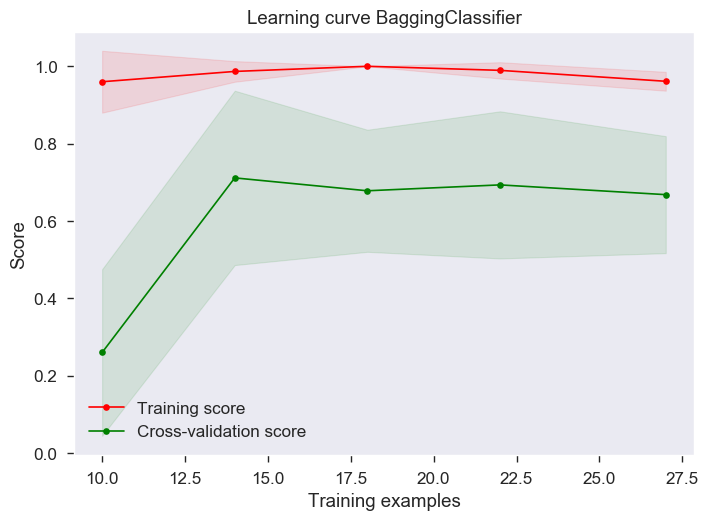

Cross Validated Training score: 0.64 (+/- 0.16)
Now at model: AdaBoostClassifier


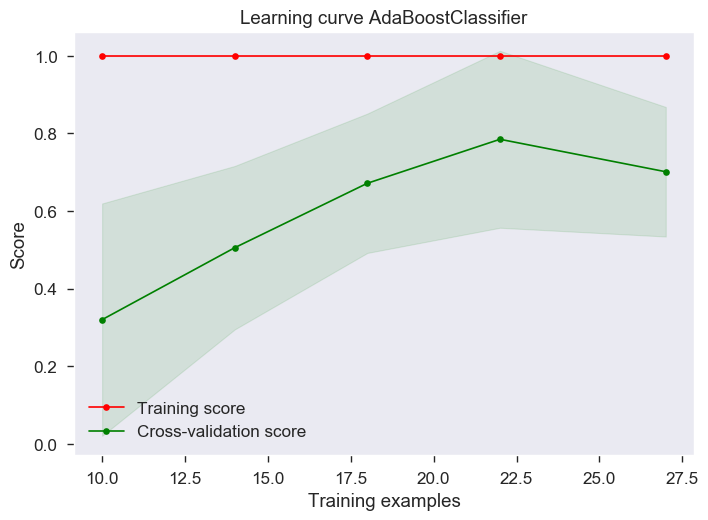

Cross Validated Training score: 0.69 (+/- 0.13)
Now at model: XGBClassifier


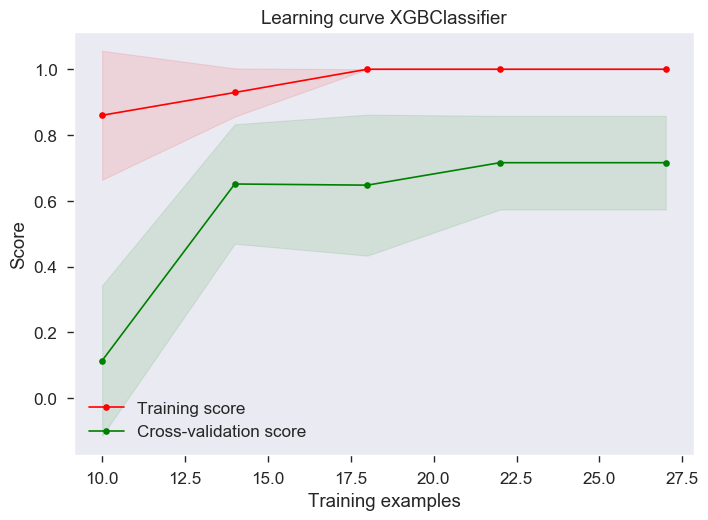

Cross Validated Training score: 0.66 (+/- 0.19)
Now at model: XGBRFClassifier


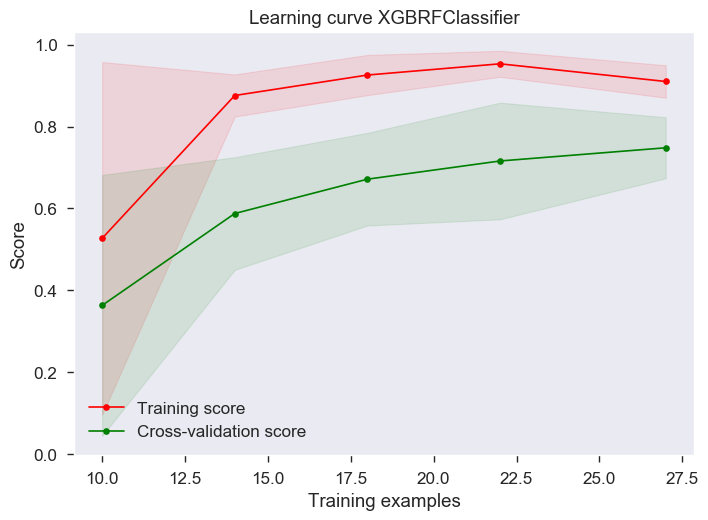

Cross Validated Training score: 0.67 (+/- 0.09)
Now at model: MLPClassifier


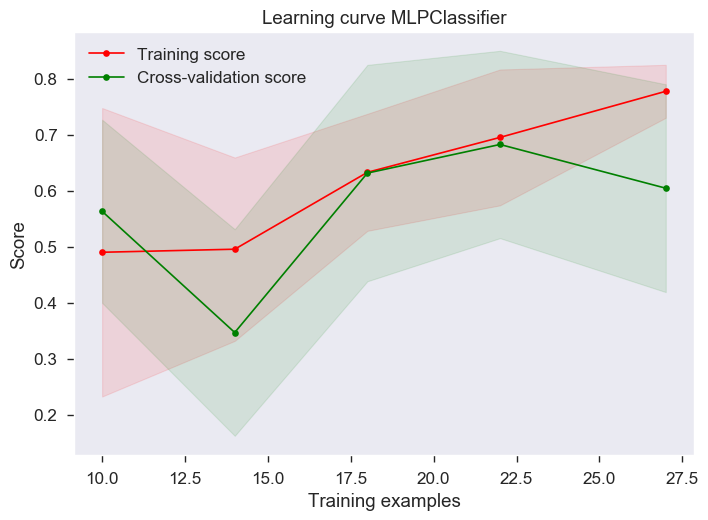

Cross Validated Training score: 0.61 (+/- 0.35)
Now at model: LinearSVC


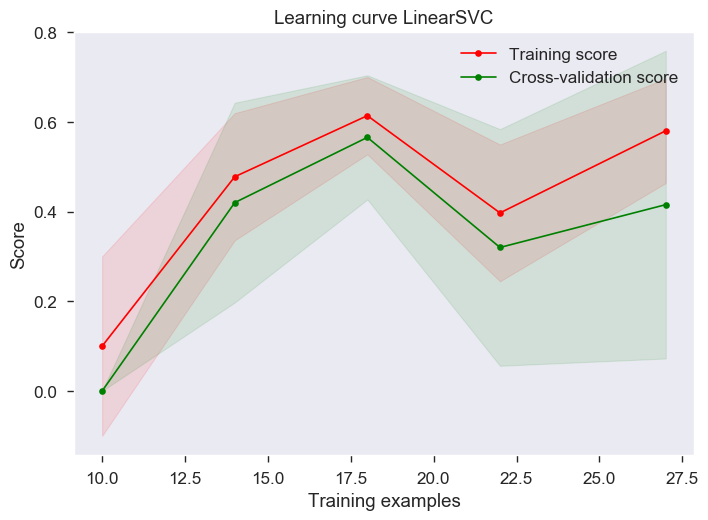

Cross Validated Training score: 0.60 (+/- 0.13)
Now at model: NuSVC


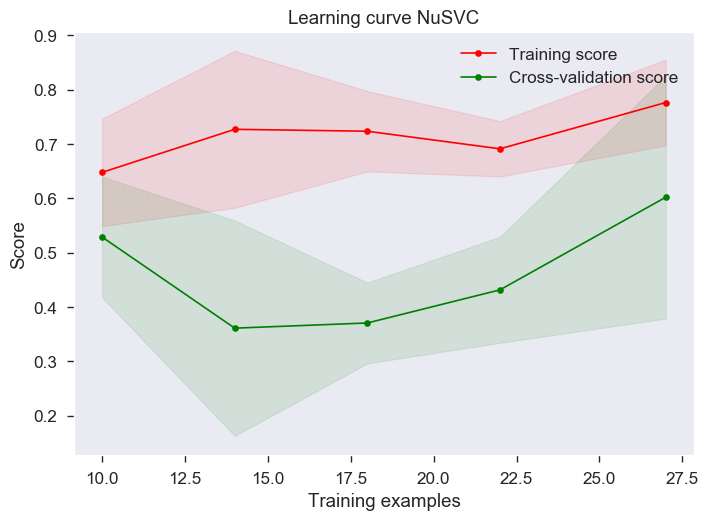

Cross Validated Training score: 0.68 (+/- 0.10)
Now at model: SVC


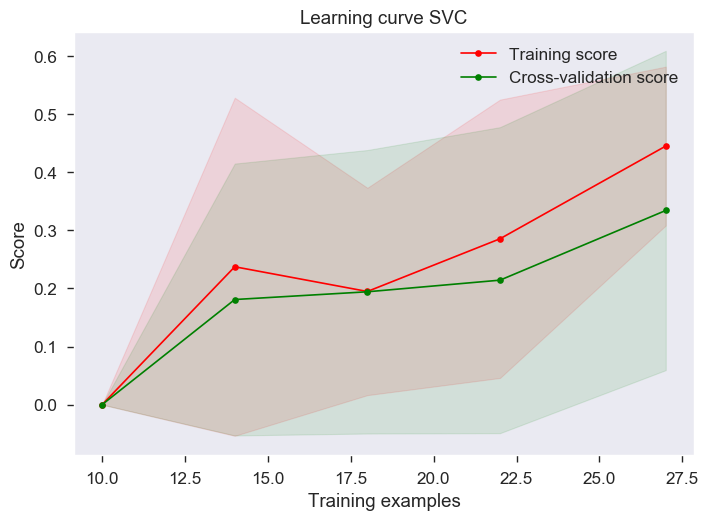

Cross Validated Training score: 0.34 (+/- 0.28)
Now at model: GaussianNB


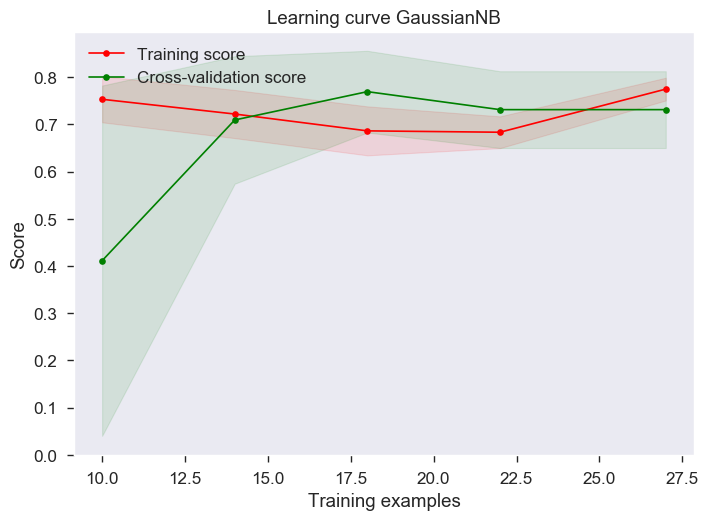

Cross Validated Training score: 0.75 (+/- 0.07)
Now at model: DecisionTreeClassifier


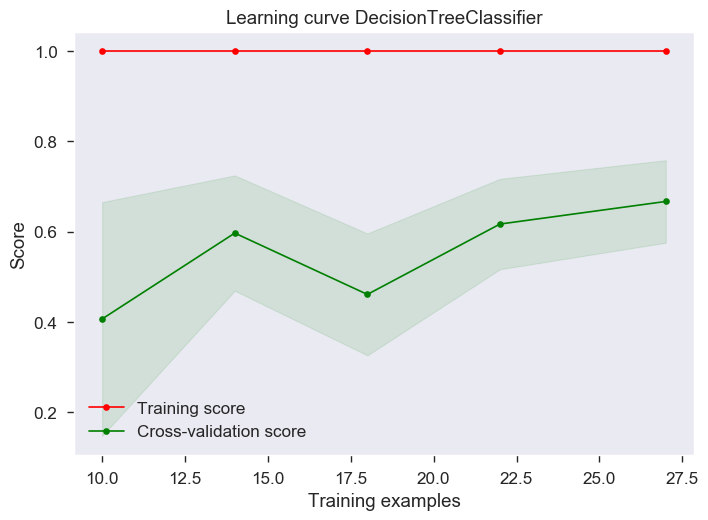

Cross Validated Training score: 0.63 (+/- 0.19)
Now at model: QuadraticDiscriminantAnalysis


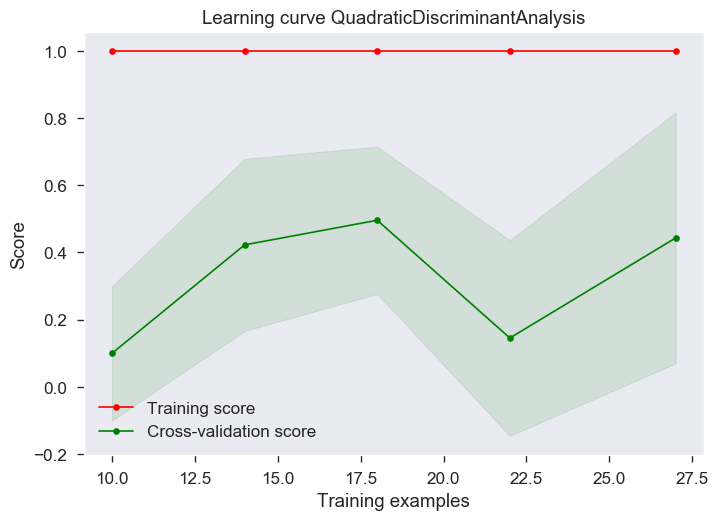

Cross Validated Training score: 0.43 (+/- 0.35)
Now at model: KNeighborsClassifier


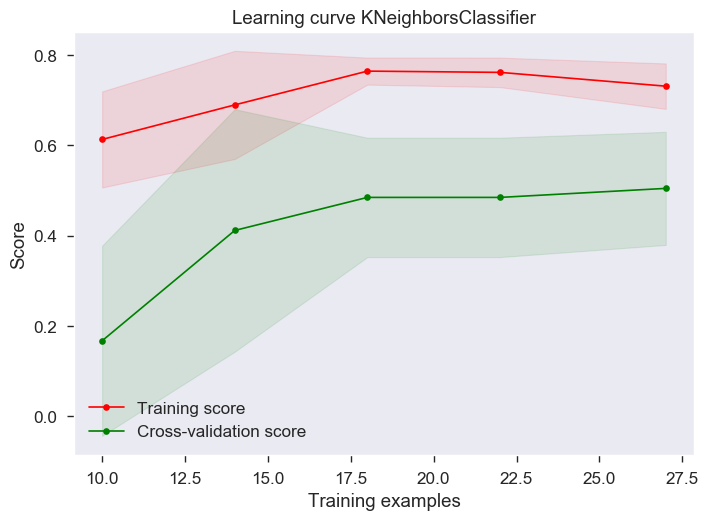

Cross Validated Training score: 0.40 (+/- 0.09)
Now at model: GaussianProcessClassifier


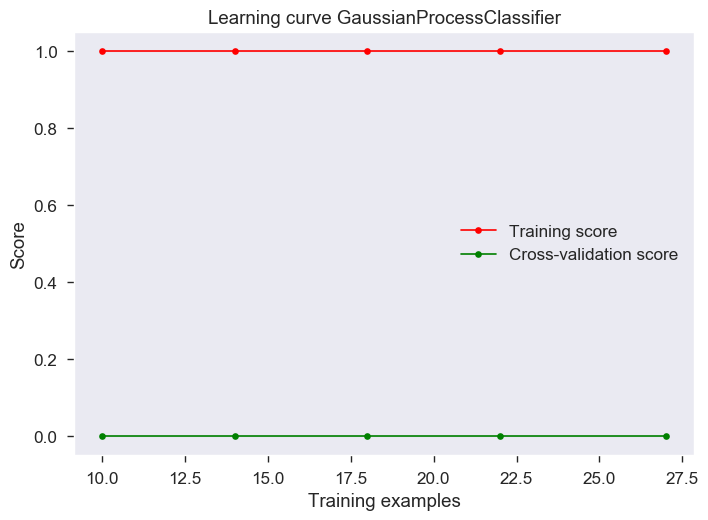

Cross Validated Training score: 0.31 (+/- 0.28)


In [44]:
from sklearn.preprocessing import FunctionTransformer

logtargets = [
'totalTimeMoveAvg',
'totalTimeMoveSD',
'totalTimeMoveMin',
'thinkTimeMoveAvg',
'moveTimeMoveAvg',
'moveTimeMoveSD',
'erroneousMovesPercentage',
'rankErrorPercentage',
'suitErrorPercentage'

]
sqrttargets= [
'gameTime',
'thinkTimeMoveSD',
'thinkTimeMoveMin',
'thinkTimeMoveMax',
'moveTimeMoveMax'     
]


log_transformer = FunctionTransformer(np.log1p, validate=True)
sqrt_transformer = FunctionTransformer(np.sqrt, validate=True)

transformer = ColumnTransformer(
    transformers=[
        ('log', log_transformer, logtargets),
        ('sqrt', sqrt_transformer, sqrttargets)])

results = []

for classifier in classifiers:
    nameModel=type(classifier).__name__

    print("Now at model: "+nameModel)

    #Create pipe
    pipe = Pipeline(steps=[
        ('transformer', transformer),
        ('classifier', classifier)])
    #Train model
    pipe.fit(X_train, y_train);
    
    
    #Plot learning curve of training data
    plot_learning_curve(classifier, "Learning curve "+nameModel, X_train, y_train, cv=cv, scoring=SCORING, train_sizes=np.linspace(.4, 1.0, 5)) 
    plt.show()
    
    
    #Get General Scores
    scores = cross_val_score(pipe, X_train, y_train, cv=cv, scoring=SCORING)
    results.append(scores.mean())
    
    print("Cross Validated Training score: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std()))
    #print("Test score: %.3f" % pipe.score(X_test, y_test))

In [45]:
transformedScores = ScoreDataFrame(('trans'+s  for s in names),results)
compareModels = pd.concat([baseScores,transformedScores], axis=1)
compareModels

,Model,Score,Model,Score
0,DC,0.2400,transDC,0.2400
1,LR,0.6310,transLR,0.6111
2,SGD,0.4242,transSGD,0.5442
3,LRCV,0.6381,transLRCV,0.6576
4,RF,0.7505,transRF,0.7148
5,ET,0.7759,transET,0.6719
6,GB,0.5548,transGB,0.6033
7,BAG,0.8167,transBAG,0.6433
8,ADA,0.7011,transADA,0.6944
9,XGB,0.7759,transXGB,0.6625


## Third Run: Impact of Scaling Features

**Scale your variables**. First going to go with MinMaxScaler, preserves shape of original distribution. However, we could use a robustScaler to reduce effect of outliers. I do not want to through away the data because they are not outliers, however, reducing their impact couldn't be that bad. !!! Scale using training data and use that scaler on test data, else info goes leaking into your test data. Standardizen is perhaps better as it has less problems with outliers. https://towardsdatascience.com/scale-standardize-or-normalize-with-scikit-learn-6ccc7d176a02 .  We do have to split the set into a train/test set beforehand! Parametric methods usually require a minimum of symmetric and unimodal distribution of data, which is not always given in real data. 

### Without transforming features

Now at model: DummyClassifier


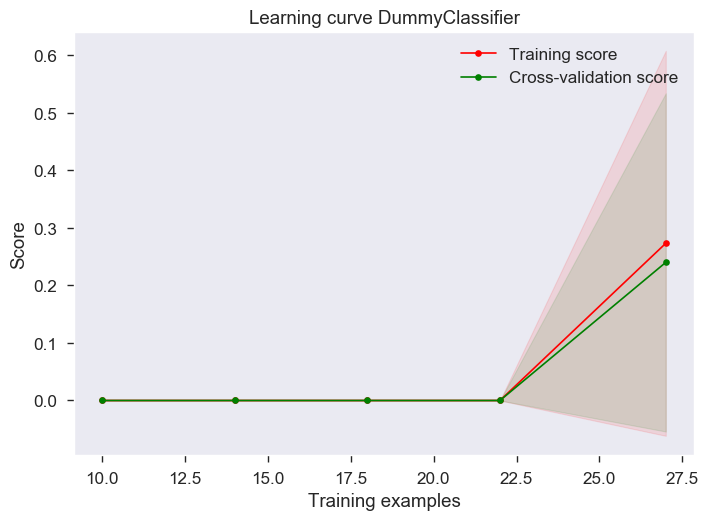

Cross Validated Training score: 0.24 (+/- 0.29)
Now at model: LogisticRegression


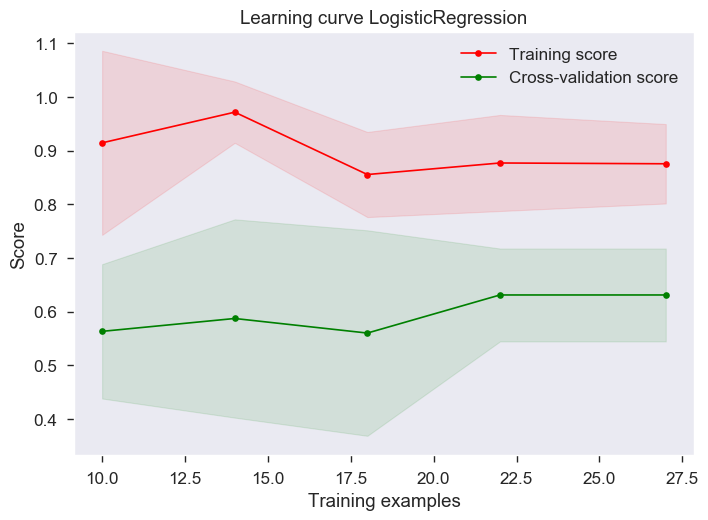

Cross Validated Training score: 0.78 (+/- 0.06)
Now at model: SGDClassifier


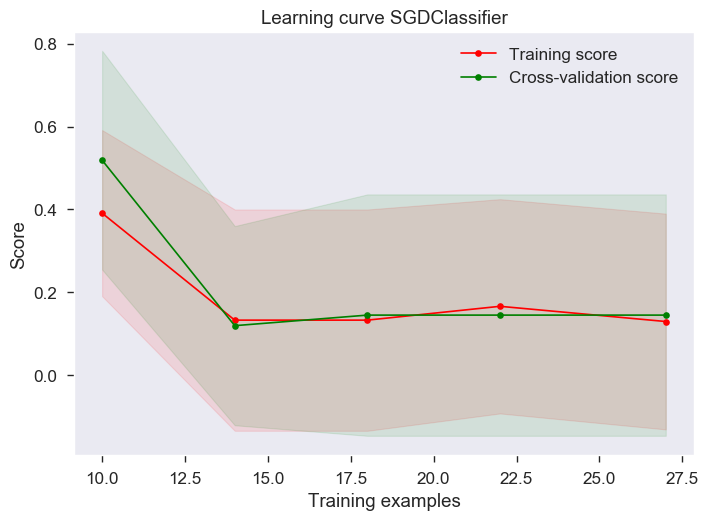

Cross Validated Training score: 0.64 (+/- 0.17)
Now at model: LogisticRegressionCV


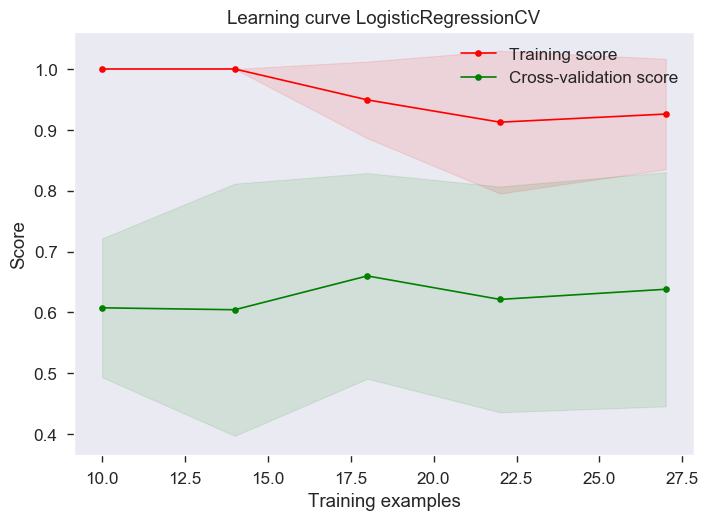

Cross Validated Training score: 0.77 (+/- 0.09)
Now at model: RandomForestClassifier


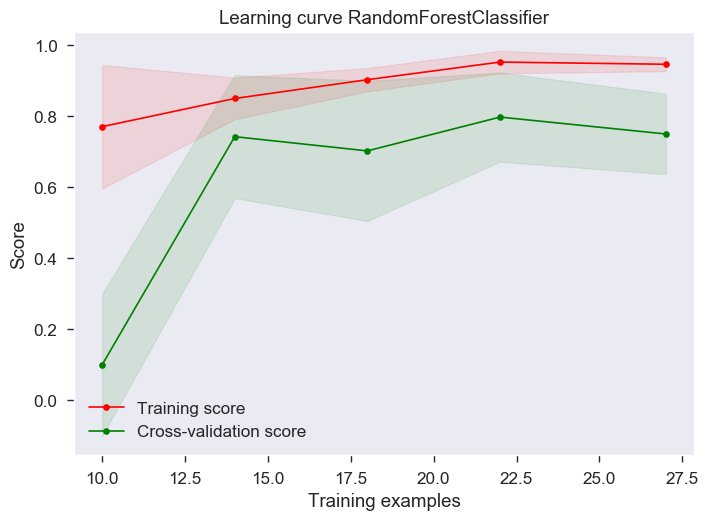

Cross Validated Training score: 0.78 (+/- 0.15)
Now at model: ExtraTreesClassifier


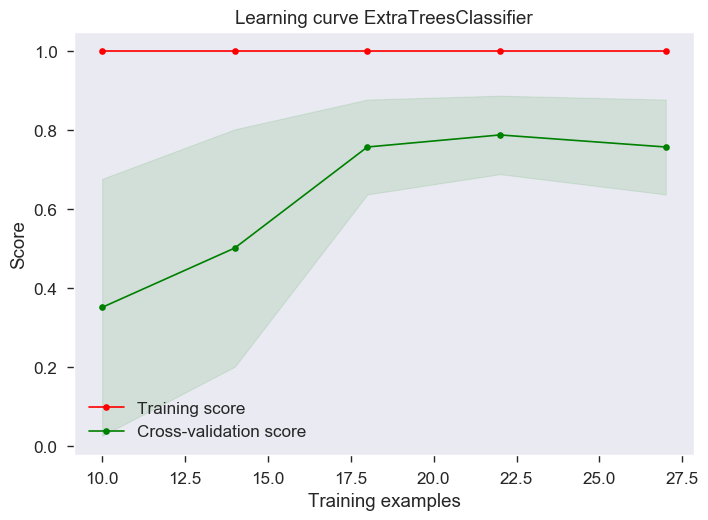

Cross Validated Training score: 0.76 (+/- 0.12)
Now at model: GradientBoostingClassifier


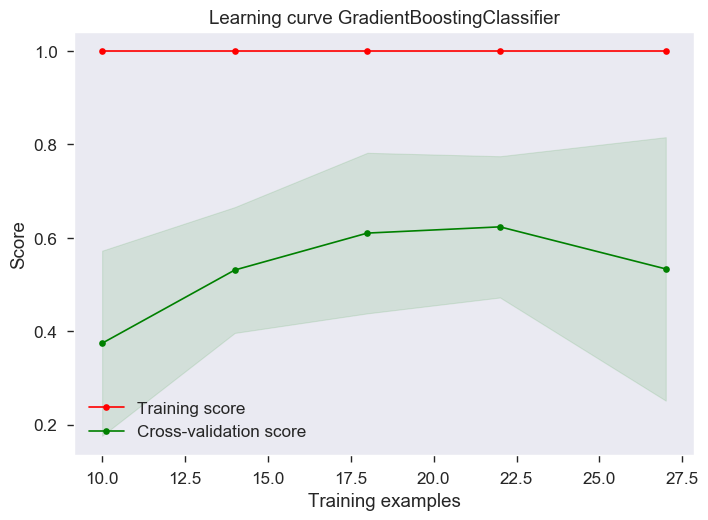

Cross Validated Training score: 0.69 (+/- 0.12)
Now at model: BaggingClassifier


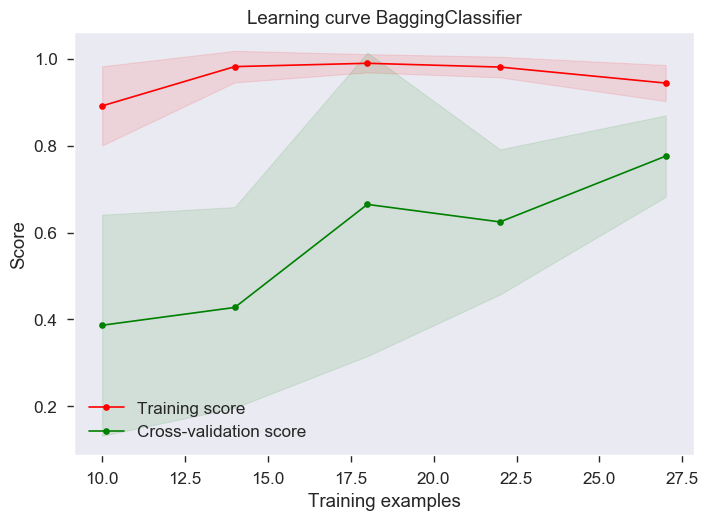

Cross Validated Training score: 0.67 (+/- 0.37)
Now at model: AdaBoostClassifier


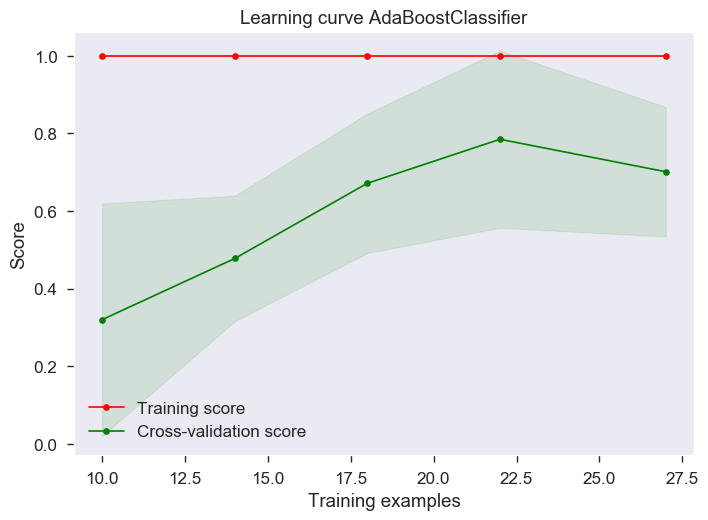

Cross Validated Training score: 0.70 (+/- 0.17)
Now at model: XGBClassifier


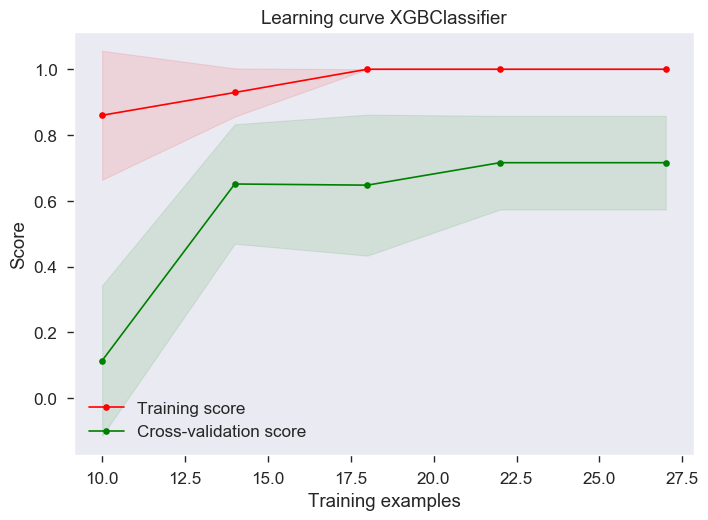

Cross Validated Training score: 0.78 (+/- 0.09)
Now at model: XGBRFClassifier


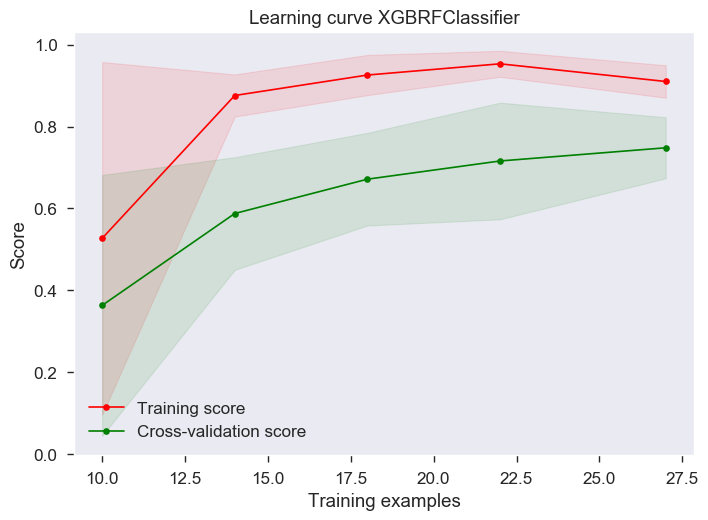

Cross Validated Training score: 0.75 (+/- 0.07)
Now at model: MLPClassifier


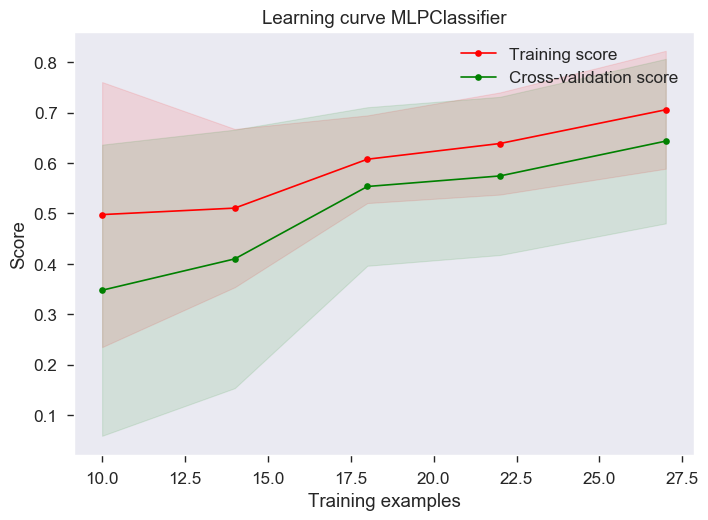

Cross Validated Training score: 0.73 (+/- 0.17)
Now at model: LinearSVC


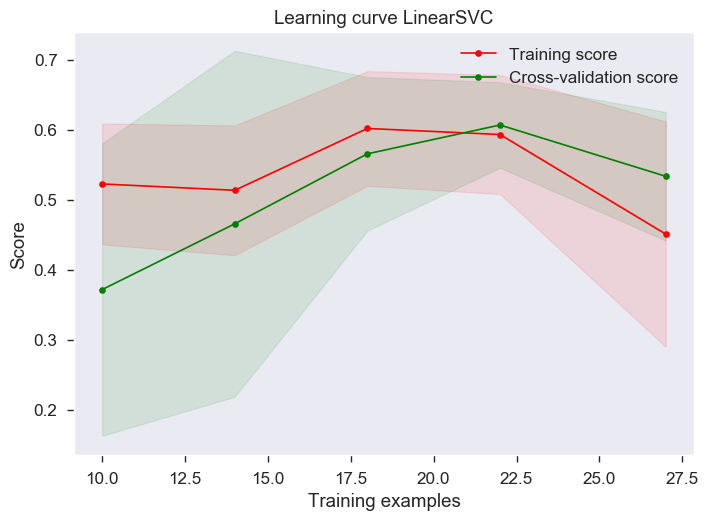

Cross Validated Training score: 0.72 (+/- 0.13)
Now at model: NuSVC


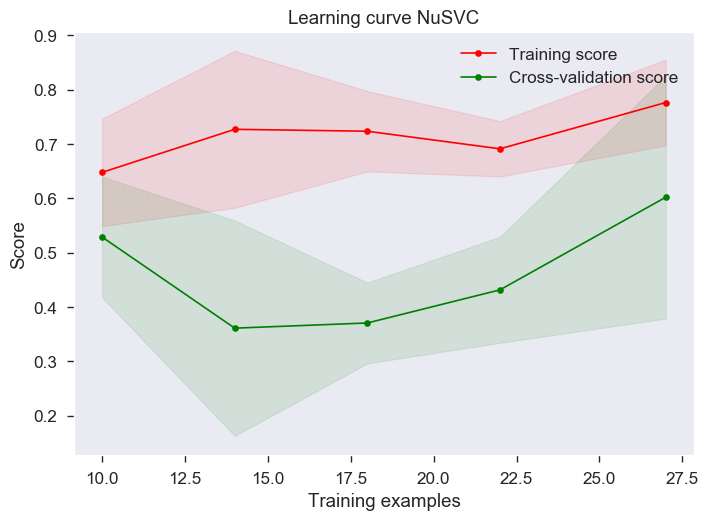

Cross Validated Training score: 0.77 (+/- 0.14)
Now at model: SVC


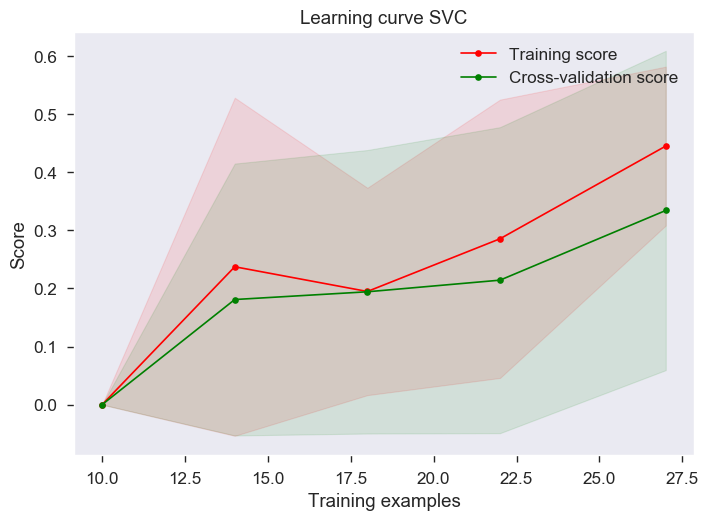

Cross Validated Training score: 0.79 (+/- 0.15)
Now at model: GaussianNB


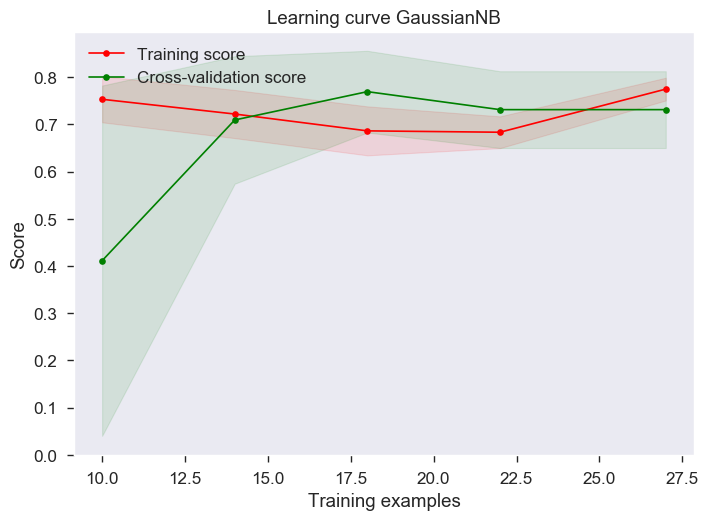

Cross Validated Training score: 0.73 (+/- 0.08)
Now at model: DecisionTreeClassifier


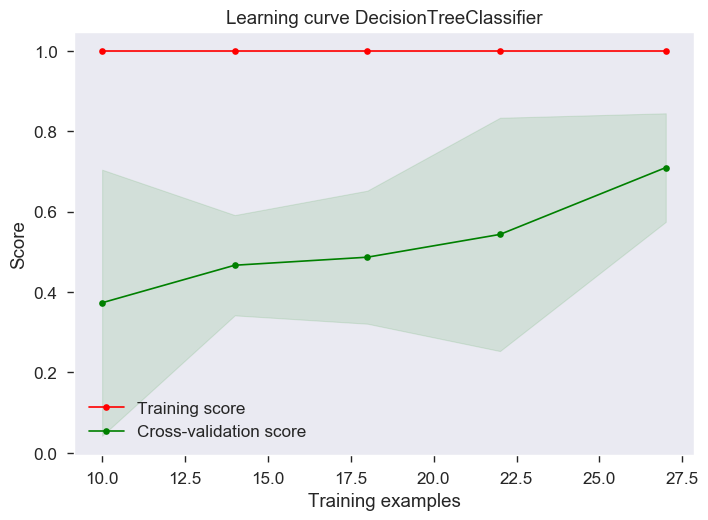

Cross Validated Training score: 0.58 (+/- 0.33)
Now at model: QuadraticDiscriminantAnalysis


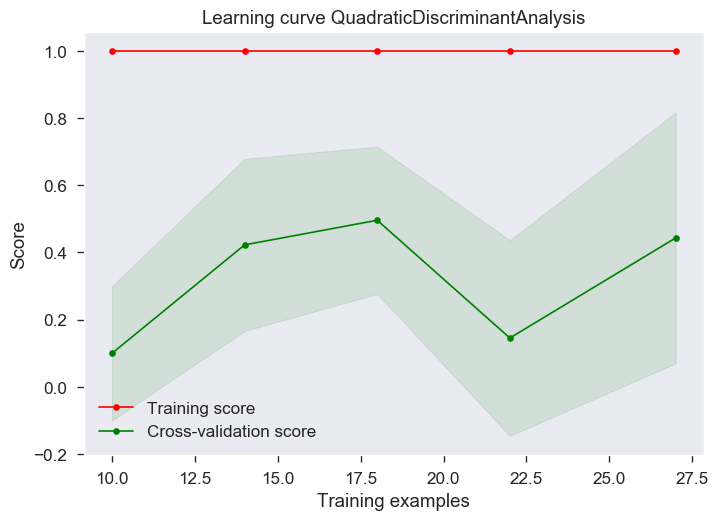

Cross Validated Training score: 0.42 (+/- 0.11)
Now at model: KNeighborsClassifier


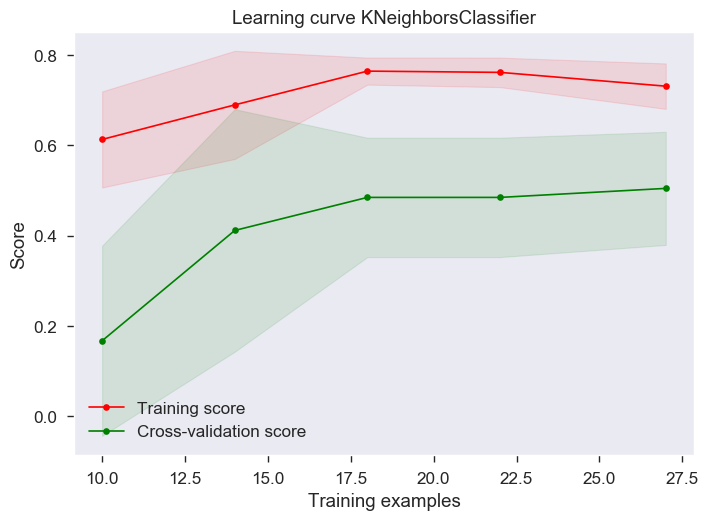

Cross Validated Training score: 0.69 (+/- 0.16)
Now at model: GaussianProcessClassifier


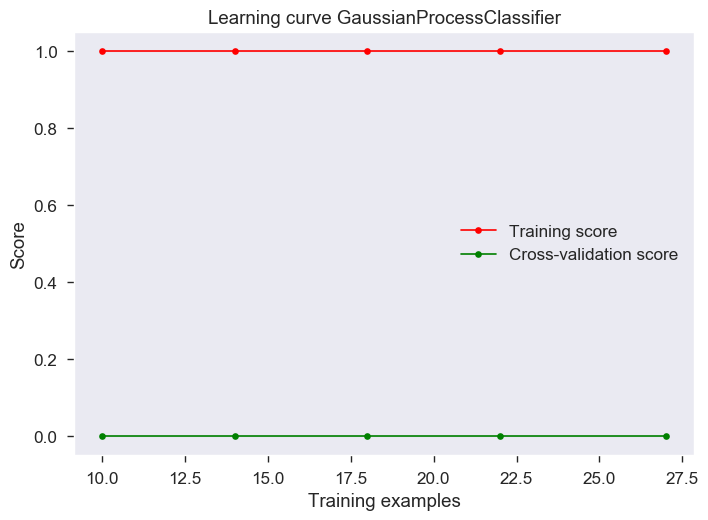

Cross Validated Training score: 0.51 (+/- 0.20)


In [46]:
numeric_scaler = Pipeline(steps=[('scaler', StandardScaler())]) #Tested: minmax+robust was  worse    

numeric_features = X_train.columns.drop(['isSolved','finalBetaError'])
categorical_features = ['isSolved','finalBetaError']

prescaling = ColumnTransformer(
    transformers=[
        ('num', numeric_scaler, numeric_features)])


results = []

for classifier in classifiers:
    nameModel=type(classifier).__name__

    print("Now at model: "+nameModel)

    #Create pipe
    pipe = Pipeline(steps=[
    ('prescaling', prescaling),
    ('classifier', classifier)])
    #Train model
    pipe.fit(X_train, y_train);
    
    
    #Plot learning curve of training data
    plot_learning_curve(classifier, "Learning curve "+nameModel, X_train, y_train, cv=cv, scoring=SCORING, train_sizes=np.linspace(.4, 1.0, 5)) 
    plt.show()
    
    #Get General Scores
    scores = cross_val_score(pipe, X_train, y_train, cv=cv, scoring=SCORING)
    results.append(scores.mean())
    
    print("Cross Validated Training score: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std()))
    #print("Test score: %.3f" % pipe.score(X_test, y_test))

In [47]:
scaledScores = ScoreDataFrame(('scaled'+s  for s in names),results)
compareModels = pd.concat([baseScores,transformedScores, scaledScores], axis=1)
compareModels

,Model,Score,Model,Score,Model,Score
0,DC,0.2400,transDC,0.2400,scaledDC,0.2400
1,LR,0.6310,transLR,0.6111,scaledLR,0.7848
2,SGD,0.4242,transSGD,0.5442,scaledSGD,0.6381
3,LRCV,0.6381,transLRCV,0.6576,scaledLRCV,0.7695
4,RF,0.7505,transRF,0.7148,scaledRF,0.7790
5,ET,0.7759,transET,0.6719,scaledET,0.7568
6,GB,0.5548,transGB,0.6033,scaledGB,0.6881
7,BAG,0.8167,transBAG,0.6433,scaledBAG,0.6667
8,ADA,0.7011,transADA,0.6944,scaledADA,0.7011
9,XGB,0.7759,transXGB,0.6625,scaledXGB,0.7759


### With transforming features

Now at model: DummyClassifier


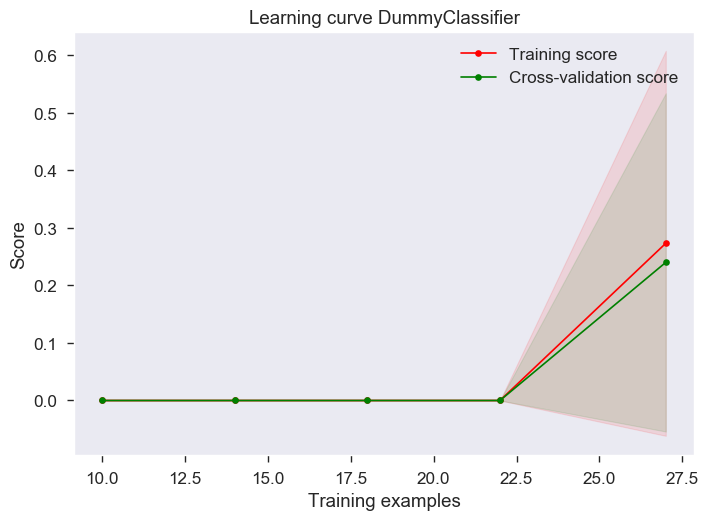

Cross Validated Training score: 0.24 (+/- 0.29)
Now at model: LogisticRegression


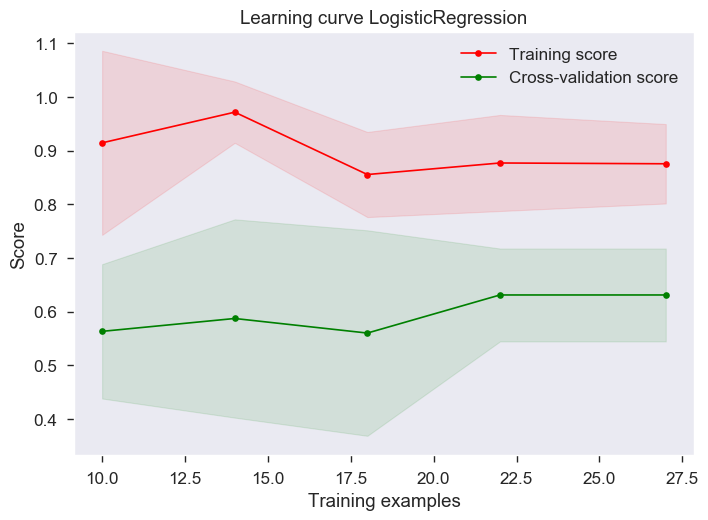

Cross Validated Training score: 0.73 (+/- 0.08)
Now at model: SGDClassifier


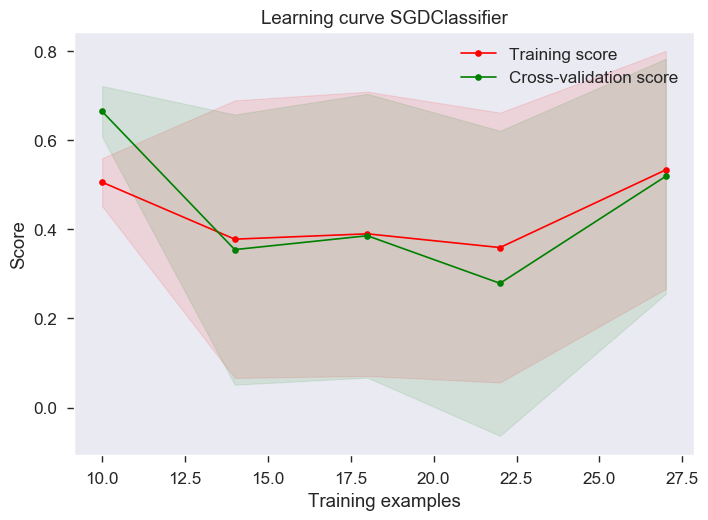

Cross Validated Training score: 0.48 (+/- 0.26)
Now at model: LogisticRegressionCV


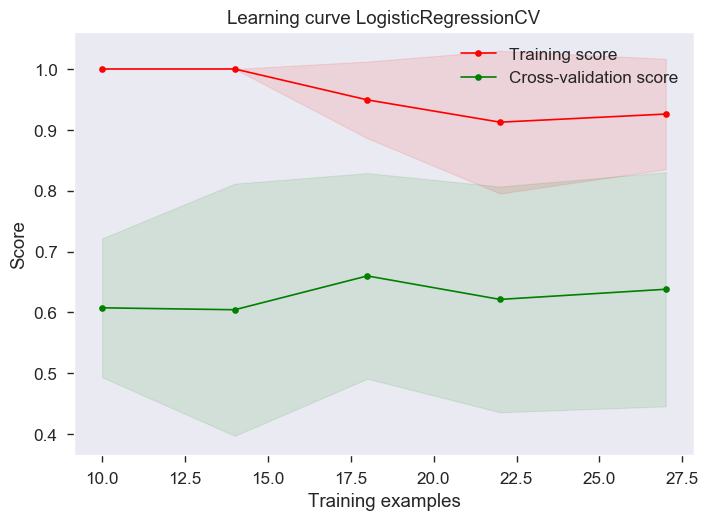

Cross Validated Training score: 0.69 (+/- 0.18)
Now at model: RandomForestClassifier


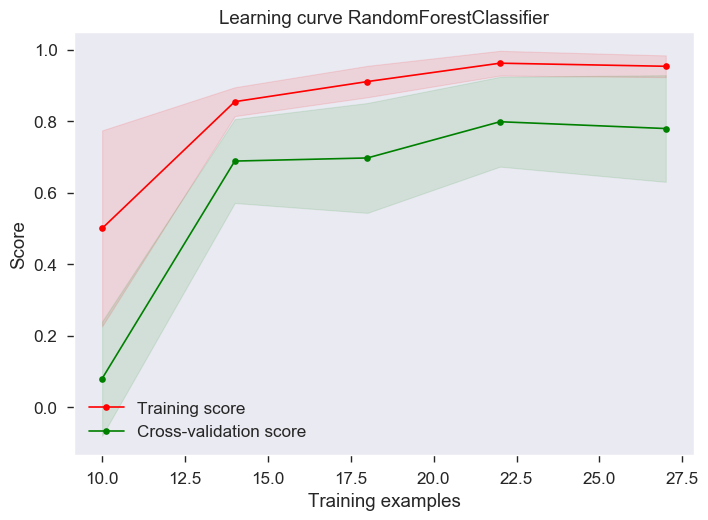

Cross Validated Training score: 0.73 (+/- 0.10)
Now at model: ExtraTreesClassifier


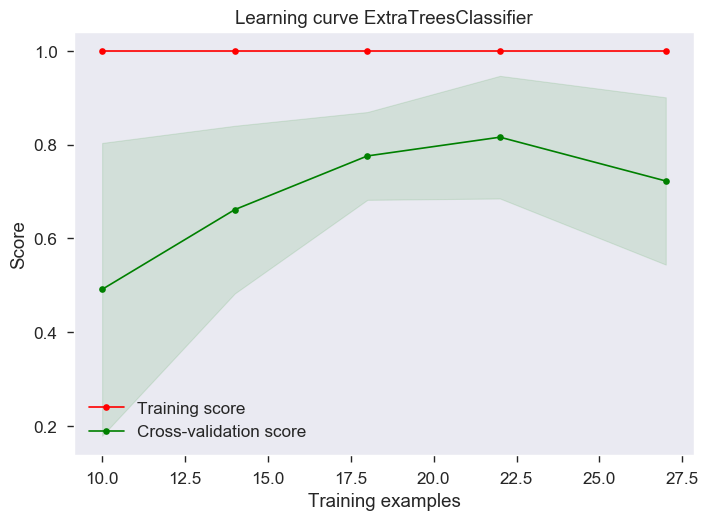

Cross Validated Training score: 0.75 (+/- 0.11)
Now at model: GradientBoostingClassifier


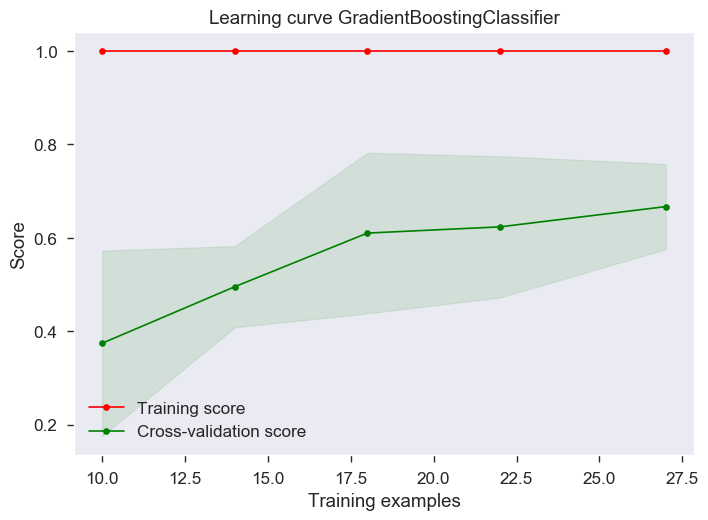

Cross Validated Training score: 0.61 (+/- 0.14)
Now at model: BaggingClassifier


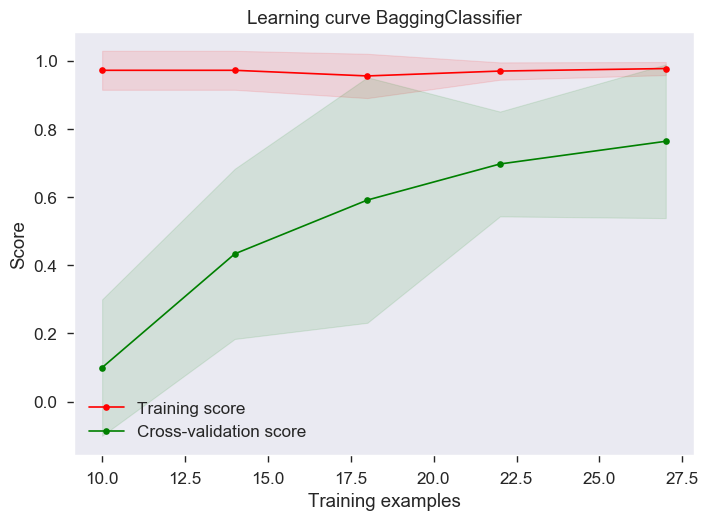

Cross Validated Training score: 0.70 (+/- 0.17)
Now at model: AdaBoostClassifier


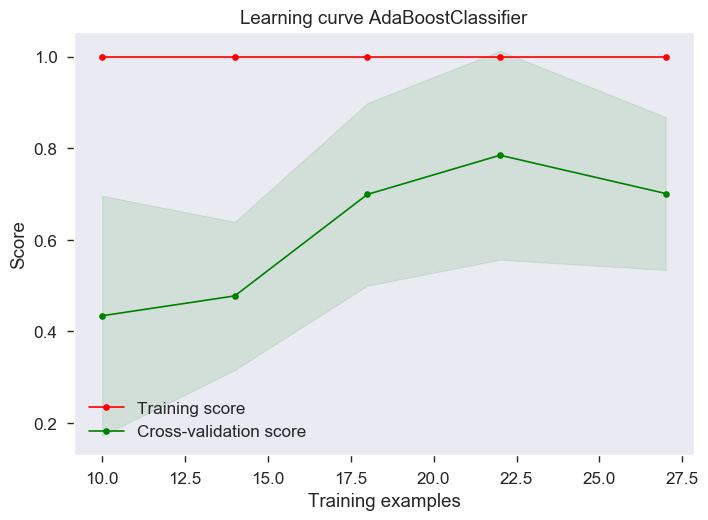

Cross Validated Training score: 0.70 (+/- 0.17)
Now at model: XGBClassifier


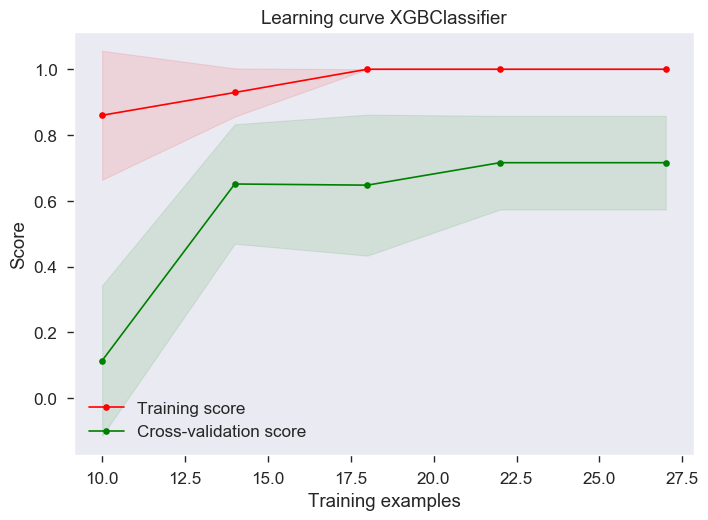

Cross Validated Training score: 0.78 (+/- 0.09)
Now at model: XGBRFClassifier


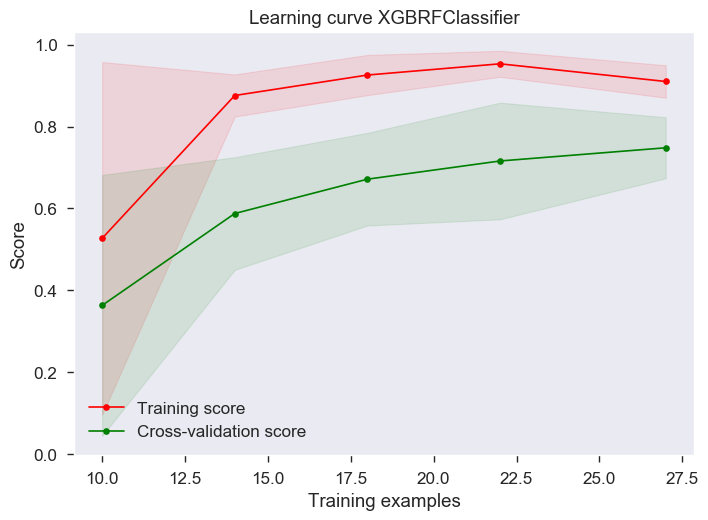

Cross Validated Training score: 0.73 (+/- 0.05)
Now at model: MLPClassifier


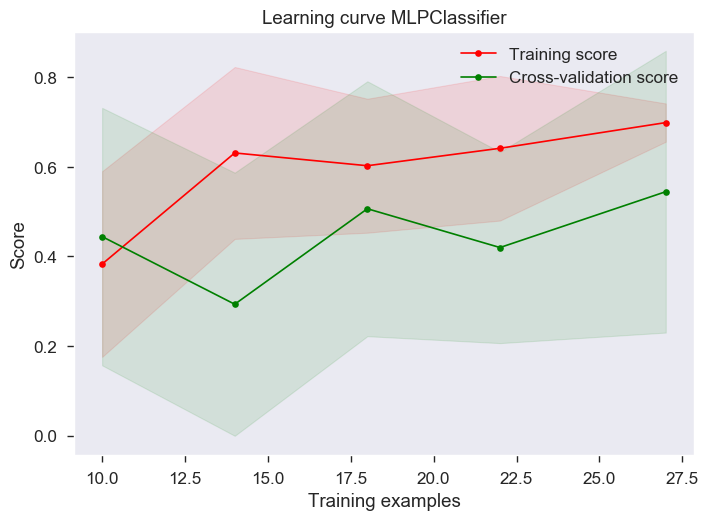

Cross Validated Training score: 0.65 (+/- 0.12)
Now at model: LinearSVC


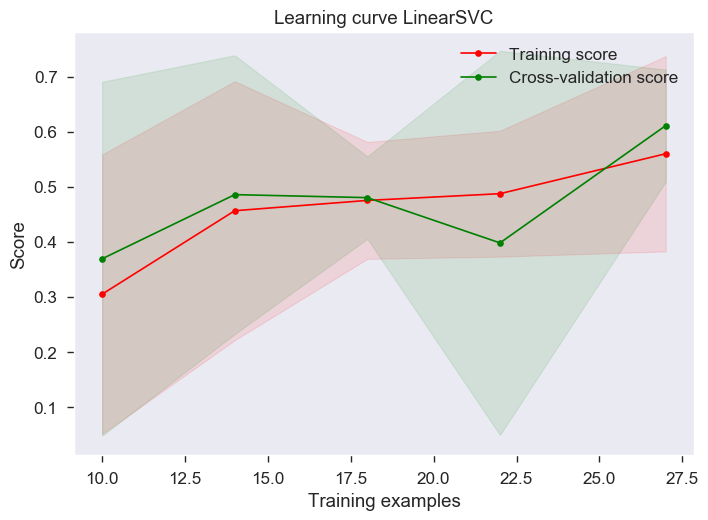

Cross Validated Training score: 0.33 (+/- 0.28)
Now at model: NuSVC


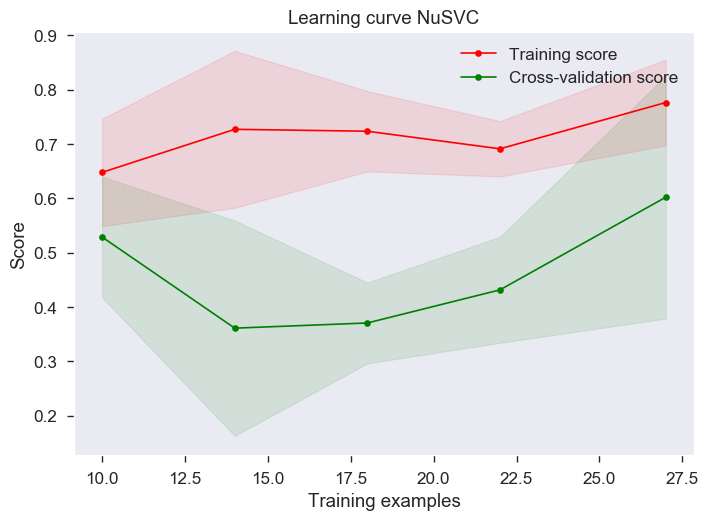

Cross Validated Training score: 0.66 (+/- 0.18)
Now at model: SVC


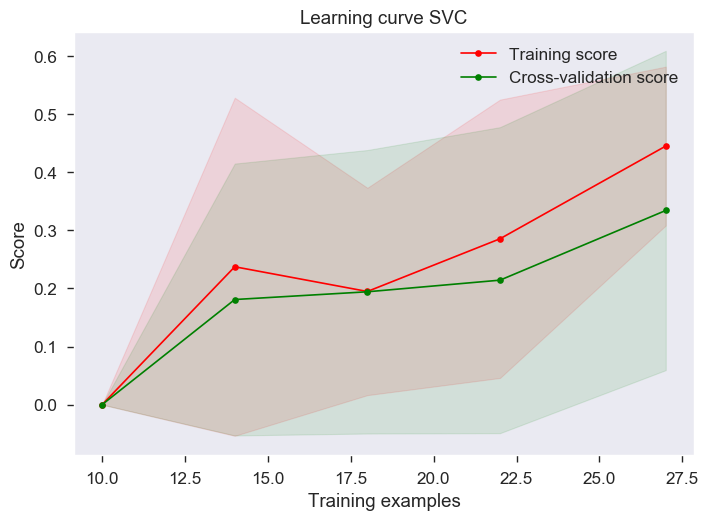

Cross Validated Training score: 0.34 (+/- 0.28)
Now at model: GaussianNB


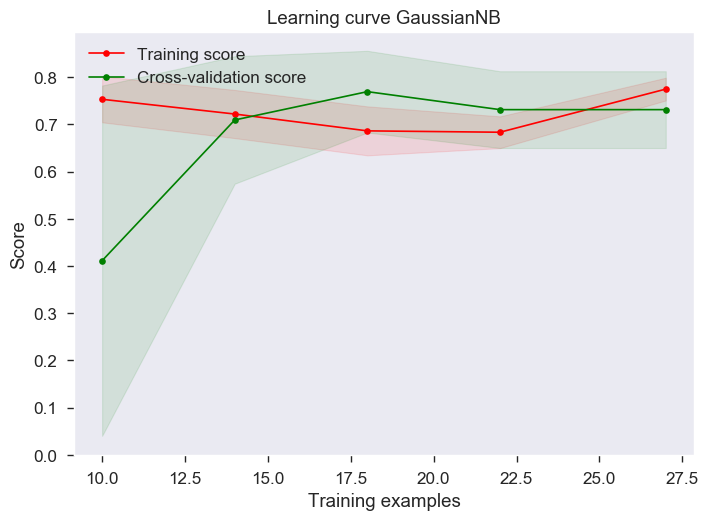

Cross Validated Training score: 0.71 (+/- 0.10)
Now at model: DecisionTreeClassifier


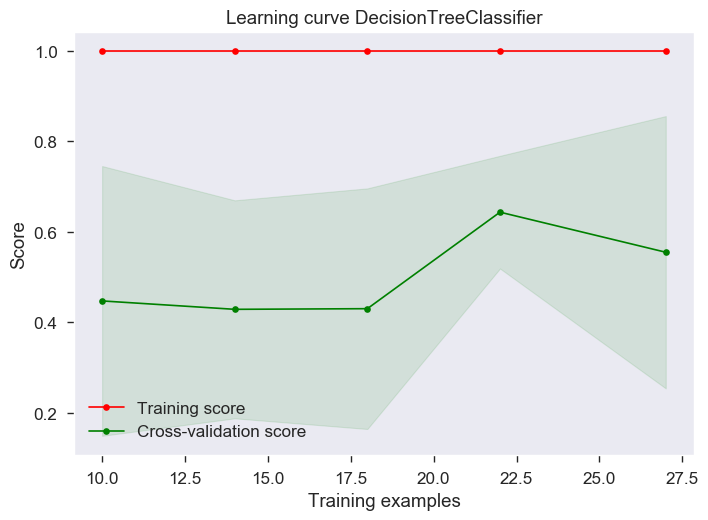

Cross Validated Training score: 0.58 (+/- 0.32)
Now at model: QuadraticDiscriminantAnalysis


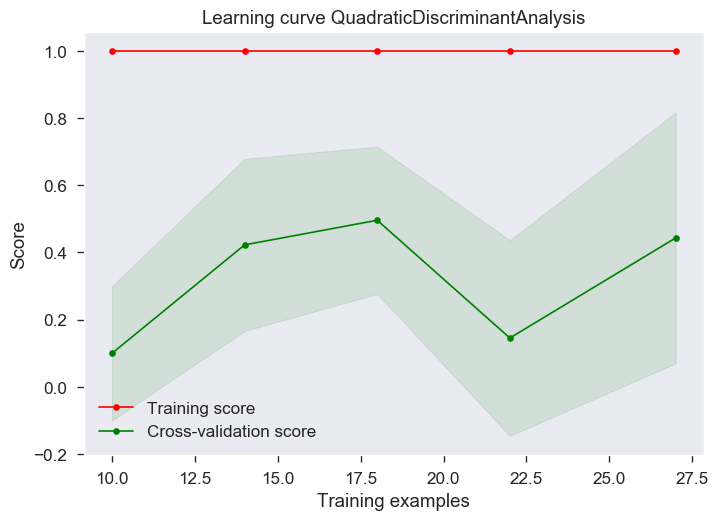

Cross Validated Training score: 0.62 (+/- 0.20)
Now at model: KNeighborsClassifier


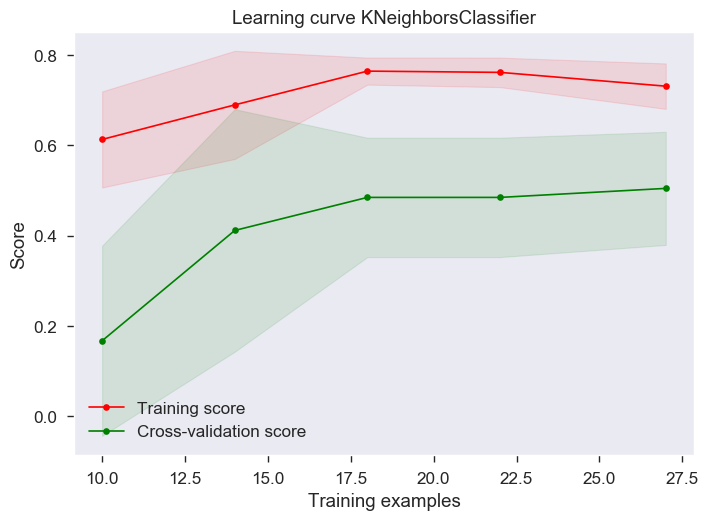

Cross Validated Training score: 0.40 (+/- 0.09)
Now at model: GaussianProcessClassifier


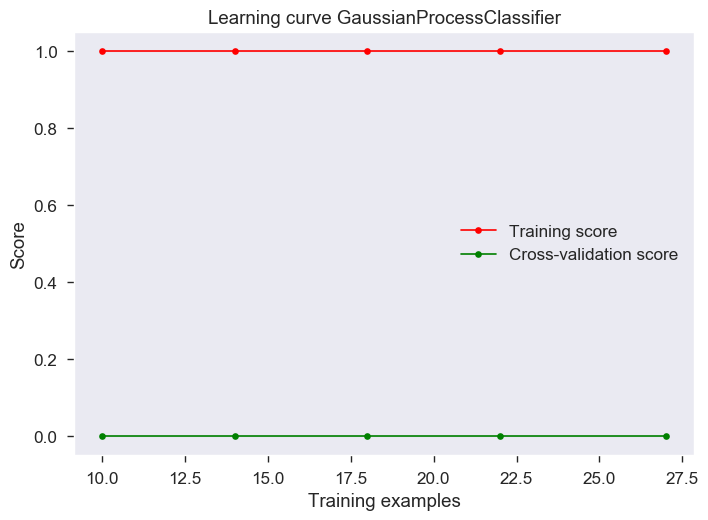

Cross Validated Training score: 0.31 (+/- 0.28)


In [48]:
numeric_scaler = Pipeline(steps=[('scaler', StandardScaler())]) #Tested: minmax+robust was  worse    

numeric_features = X_train.columns.drop(['isSolved','finalBetaError'])
categorical_features = ['isSolved','finalBetaError']

prescaling = ColumnTransformer(
    transformers=[
        ('log', log_transformer, logtargets),
        ('sqrt', sqrt_transformer, sqrttargets),
        ('num', numeric_scaler, numeric_features)])


results = []

for classifier in classifiers:
    nameModel=type(classifier).__name__

    print("Now at model: "+nameModel)

    #Create pipe
    pipe = Pipeline(steps=[
    ('prescaling', prescaling),
    ('classifier', classifier)])
    #Train model
    pipe.fit(X_train, y_train);
    
    
    #Plot learning curve of training data
    plot_learning_curve(classifier, "Learning curve "+nameModel, X_train, y_train, cv=cv, scoring=SCORING, train_sizes=np.linspace(.4, 1.0, 5)) 
    plt.show()
    
    #Get General Scores
    scores = cross_val_score(pipe, X_train, y_train, cv=cv, scoring=SCORING)
    results.append(scores.mean())
    
    print("Cross Validated Training score: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std()))

In [49]:
scaledAndTransScores = ScoreDataFrame(('scaledAndTrans'+s  for s in names),results)
compareModels = pd.concat([baseScores,transformedScores, scaledScores, scaledAndTransScores], axis=1)
compareModels

,Model,Score,Model,Score,Model,Score,Model,Score
0,DC,0.2400,transDC,0.2400,scaledDC,0.2400,scaledAndTransDC,0.2400
1,LR,0.6310,transLR,0.6111,scaledLR,0.7848,scaledAndTransLR,0.7343
2,SGD,0.4242,transSGD,0.5442,scaledSGD,0.6381,scaledAndTransSGD,0.4788
3,LRCV,0.6381,transLRCV,0.6576,scaledLRCV,0.7695,scaledAndTransLRCV,0.6867
4,RF,0.7505,transRF,0.7148,scaledRF,0.7790,scaledAndTransRF,0.7290
5,ET,0.7759,transET,0.6719,scaledET,0.7568,scaledAndTransET,0.7505
6,GB,0.5548,transGB,0.6033,scaledGB,0.6881,scaledAndTransGB,0.6133
7,BAG,0.8167,transBAG,0.6433,scaledBAG,0.6667,scaledAndTransBAG,0.6959
8,ADA,0.7011,transADA,0.6944,scaledADA,0.7011,scaledAndTransADA,0.7011
9,XGB,0.7759,transXGB,0.6625,scaledXGB,0.7759,scaledAndTransXGB,0.7759


In [50]:
from datetime import date

#compareModels.to_csv(r'C:/Users/karst/Dropbox/Impulsfonds_Karsten/0_ProjectFiles/2_PresentationsAndPapers/0_FirstMCIStudy/Results/MLResults/Game'+seed+'modelPerformances'+date.today().strftime("%d%m%Y")+'.csv', index = False)
compareModels.to_csv(r'C:/Users/karst/Dropbox/Impulsfonds_Karsten/0_ProjectFiles/2_PresentationsAndPapers/0_FirstMCIStudy/Results/MLResults/Game'+str(seed)+'/modelPerformancesScalingTransform.csv', index = False)


## Finetuning Best Models

Now it's time to tune the hyperparameters of the best performing models using a random gridsearch.
  
Random Search would be advised to use over Grid Search when the searching space is high meaning that there are more than 3 dimensions as Random Search is able to explore a wider hyperparameter space. When there are many parameters, Random Search could be preferred as too many parameters will increase time complexity for Grid Search. However, though Grid Search can be very computationally expensive, as an exhaustive search, it’s useful for looking through all the combinations of specified hyperparameters.   

When deciding on which distributions to use: Use the scipy.stats module, which contains many useful distributions for sampling parameters, such as expon, gamma, uniform or randint.
  
Let's choose the 8 best models for this game:
8 Best models:
LR
RF
ET
BAG
ADA
XGBRFV
GNB
DT

Wildcard: SVC  
  
Notes:
* Use pipeline.get_params().keys() to get the right parameter names, they differ from the ones used by the classifier.

General articles:
* https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74
*  https://medium.com/@cjl2fv/an-intro-to-hyper-parameter-optimization-using-grid-search-and-random-search-d73b9834ca0a
* https://medium.com/swlh/randomized-or-grid-search-with-pipeline-cheatsheet-719c72eda68

  
SkLearn Documentation:
* https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.RandomizedSearchCV.html#sklearn.model_selection.RandomizedSearchCV
* https://scikit-learn.org/stable/tutorial/statistical_inference/putting_together.html
* https://scikit-learn.org/stable/modules/grid_search.html
  
Model Specific Articles:
* https://blog.cambridgespark.com/hyperparameter-tuning-in-xgboost-4ff9100a3b2f
  
Kaggle notebooks:
* https://www.kaggle.com/willkoehrsen/intro-to-model-tuning-grid-and-random-search

In [51]:
import csv
#Start csv file
fields=['Model','Cross Validated F1 Training Score', 'Cross Validated F1 Training Score SD', 'AUC Test', 'F1 Score Test']
# name of csv file 
filename = 'C:/Users/karst/Dropbox/Impulsfonds_Karsten/0_ProjectFiles/2_PresentationsAndPapers/0_FirstMCIStudy/Results/MLResults/Game'+str(seed)+'/FinetuningGame'+str(seed)+'.csv'

with open(filename, 'w', newline='') as csvfile: 
    # creating a csv dict writer object 
    writer = csv.DictWriter(csvfile, fieldnames = fields) 
      
    # writing headers (field names) 
    writer.writeheader() 

In [52]:
#Plot ConfusionMatrix

def plot_conf_matrix(y_test, y_pred, name):
    conf = confusion_matrix(y_test, y_pred)
    df_cm = pd.DataFrame(conf, index=["Healthy", "MCI"], columns=["Healthy", "MCI"])
    fig = plt.figure(figsize=(10,7))
    
    c_procent = np.divide(conf, float(len(y_pred)))
    annot_arr = [["%d (%4.2f%%)" % (conf[i][j], c_procent[i][j]*100) for j in range(2)] for i in range(2)]
    
    heatmap = sns.heatmap(df_cm, annot=np.asarray(annot_arr), fmt="s", cmap="Blues")
    heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)
    heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=45, ha='right', fontsize=14)
    plt.title('Confusion Matrix {0} (total = {1}) \nF1 = {2:.3f} %' .format(name, len(y_pred), f1_score(y_test, y_pred)))
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    return fig

In [53]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import f1_score

def evaluate(pipe, X_test, y_test, name):
    y_pred = pipe.predict(X_test)
    #plot confusion matrix of test data
    fig = plot_conf_matrix(y_test, y_pred, name+type(pipe['classifier']).__name__)
    fig.savefig('C:/Users/karst/Dropbox/Impulsfonds_Karsten/0_ProjectFiles/2_PresentationsAndPapers/0_FirstMCIStudy/Results/MLResults/Game'+str(seed)+'/'
                +type(pipe['classifier']).__name__+name+'_confMatrix'+'.png')
    
    
    plt.show()
    #Plot roc curve of test data
    roccurve=metrics.plot_roc_curve(pipe, X_test, y_test)
    roccurve.figure_.savefig('C:/Users/karst/Dropbox/Impulsfonds_Karsten/0_ProjectFiles/2_PresentationsAndPapers/0_FirstMCIStudy/Results/MLResults/Game'+str(seed)+'/'
            +type(pipe['classifier']).__name__+name+'_rocPlot'+'.png')
    plt.show()  
    f1Test = f1_score(y_test, y_pred)
    print(f1Test)
    print('Model Performance '+name+' model')
    print('F1 = {:0.2f}%.'.format(f1Test))
    return f1Test, roccurve.roc_auc

def finetune(base_model, random_grid,X_train, y_train, X_test, y_test):
    basePipeline = Pipeline(steps=[
    ('prescaling', prescaling),
    ('classifier', base_model)])
    baseTrainScores = cross_val_score(basePipeline, X_train, y_train, cv=cv, scoring=SCORING); 
    fig = plot_learning_curve(basePipeline, "Learning curve base "+type(basePipeline['classifier']).__name__, X_train, y_train, cv=cv, scoring=SCORING, train_sizes=np.linspace(.4, 1.0, 5)) 
    fig.savefig('C:/Users/karst/Dropbox/Impulsfonds_Karsten/0_ProjectFiles/2_PresentationsAndPapers/0_FirstMCIStudy/Results/MLResults/Game'+str(seed)+'/'
        +type(base_model).__name__+'base'+'_learnCurve'+'.png')
    print("Cross Validated Training score base model: %0.4f (+/- %0.4f)" % (baseTrainScores.mean(), baseTrainScores.std()))
    base_f1,base_auc = evaluate(basePipeline, X_test, y_test, 'base')
    
    # Random search of parameters
    # search across 100 different combinations, and use all available cores
    randomCV = RandomizedSearchCV(basePipeline, param_distributions = random_grid, n_iter = 100, cv = cv, scoring=SCORING, verbose=2, random_state=7, n_jobs = -1);
    randomCV.fit(X_train,y_train); 
    randomCV.best_params_
    randomCV.refit
    fig=plot_learning_curve(randomCV.best_estimator_, "Learning curve finetuned "+type(basePipeline['classifier']).__name__, X_train, y_train, cv=cv, scoring=SCORING, train_sizes=np.linspace(.4, 1.0, 5)) 
    fig.savefig('C:/Users/karst/Dropbox/Impulsfonds_Karsten/0_ProjectFiles/2_PresentationsAndPapers/0_FirstMCIStudy/Results/MLResults/Game'+str(seed)+'/'
        +type(base_model).__name__+'finetuned'+'_learnCurve'+'.png')
    print("Cross Validated Training score finetuned model: %0.4f (+/- %0.4f)" % (randomCV.best_score_, randomCV.cv_results_['std_test_score'][randomCV.best_index_]))
    random_f1, random_auc = evaluate(randomCV.best_estimator_, X_test, y_test, 'finetuned')


    #Evaluate Base and finetuned model, get ROC/confusion matrix
    print('Improvement of {:0.4f}%.'.format( 100 * (random_f1 - base_f1) / base_f1))
    
    
    #Write to CSV
    with open(filename, 'a') as csvfile:         
    # writing data rows
        writer = csv.DictWriter(csvfile, fieldnames = fields) 
        writer.writerow({'Model':type(basePipeline['classifier']).__name__+'_Base', 
                         'Cross Validated F1 Training Score':baseTrainScores.mean(),
                         'Cross Validated F1 Training Score SD':baseTrainScores.std(),
                         'AUC Test':base_auc,
                         'F1 Score Test':base_f1})
        writer.writerow({'Model':type(basePipeline['classifier']).__name__+'_Finetuned',
                         'Cross Validated F1 Training Score':randomCV.best_score_,
                         'Cross Validated F1 Training Score SD':randomCV.cv_results_['std_test_score'][randomCV.best_index_],
                         'AUC Test':random_auc,
                         'F1 Score Test':random_f1})

    return randomCV

### LR

In [ ]:
###Parameters to finetune###
C=np.logspace(-10,10,7)
penalty=["l1","l2","elasticnet","none"]
solver=["liblinear","lbfgs"]

random_grid = {'classifier__C': C,
               'classifier__penalty':penalty, 
               'classifier__solver': solver,
               }

###Training and comparing###
# Use the random grid to search for best hyperparameters
# First create the base model to tune and check its performance
base_model = classifiers[names.index('LR')]


randomCVLR=finetune(base_model, random_grid, X_train, y_train, X_test, y_test)


In [ ]:
randomCVLR.best_params_

### RF

Cross Validated Training score base model: 0.7568 (+/- 0.1199)


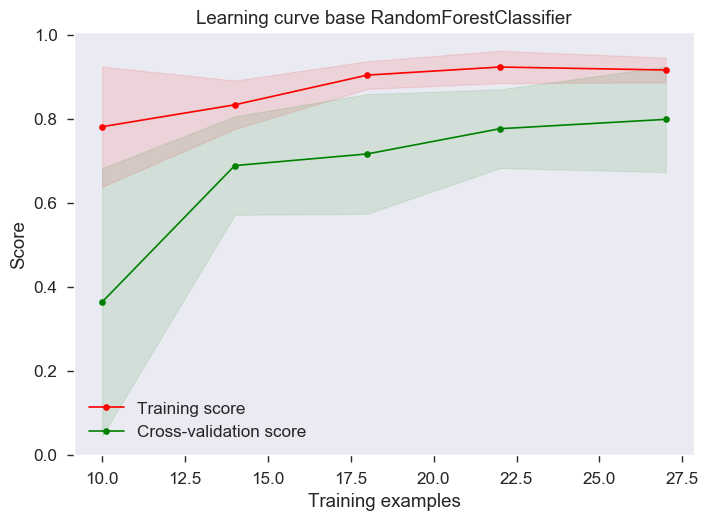

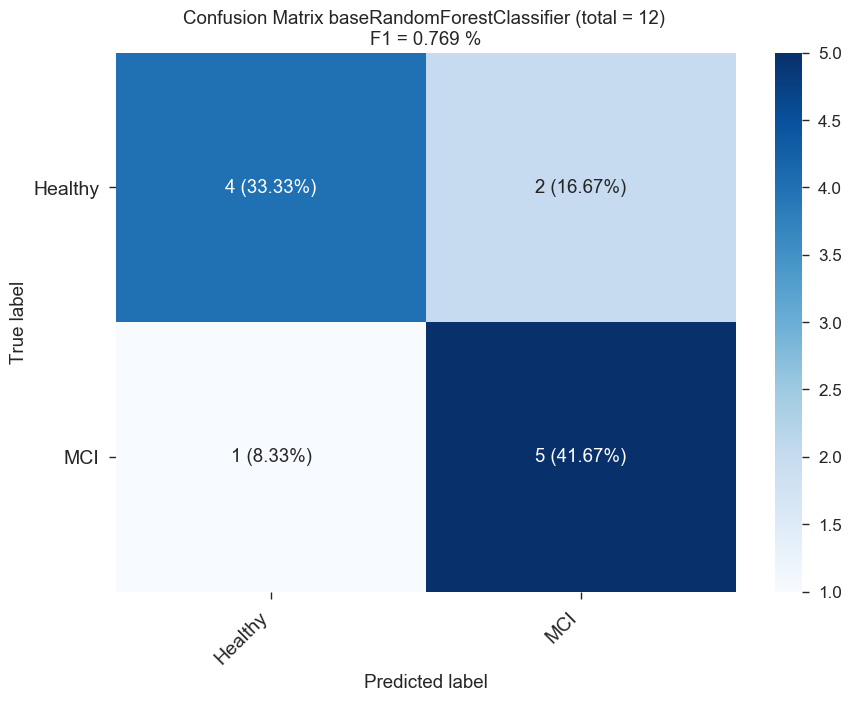

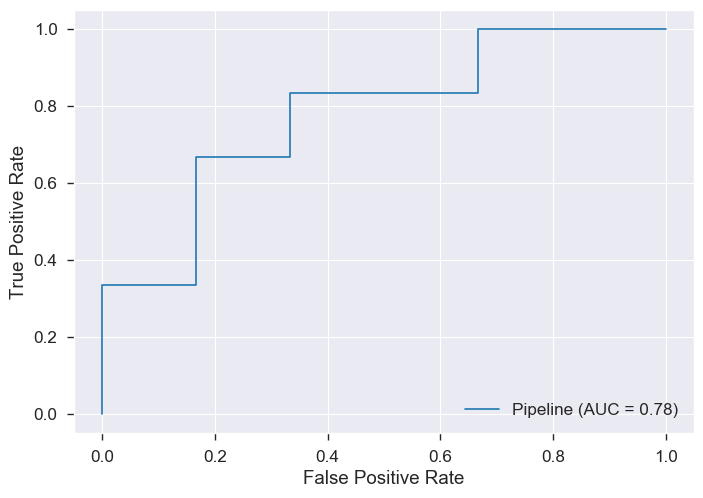

0.7692307692307692
Model Performance base model
F1 = 0.77%.
Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:    9.8s
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:   18.9s
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:   24.7s finished


Cross Validated Training score finetuned model: 0.7981 (+/- 0.1255)


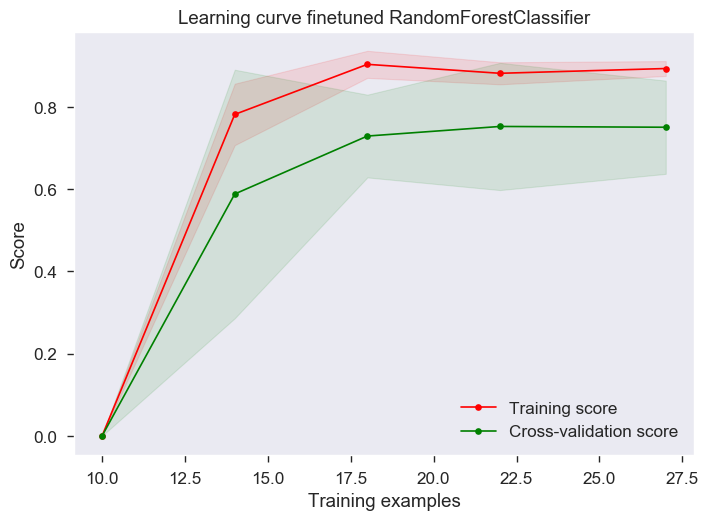

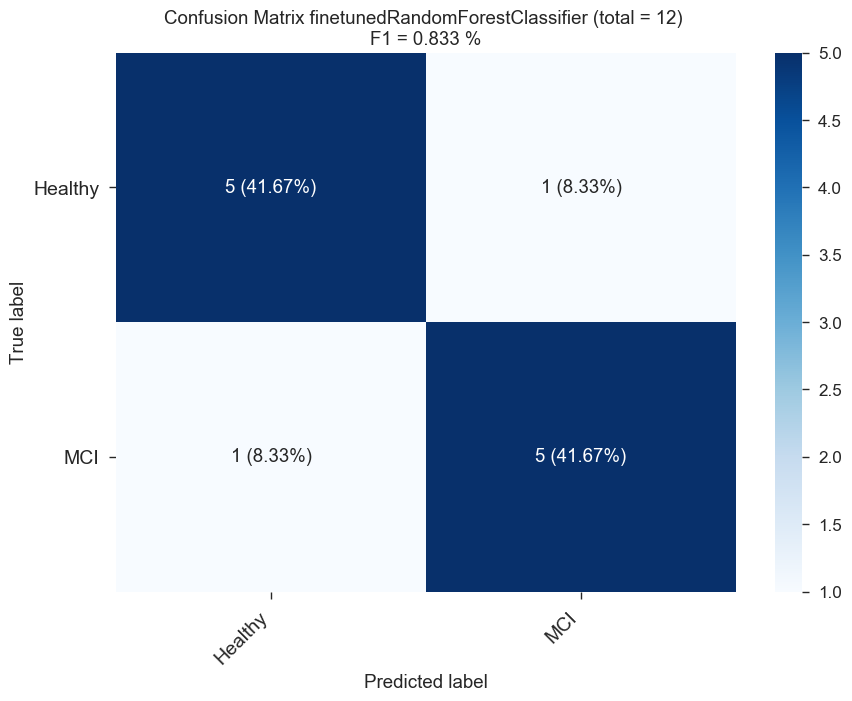

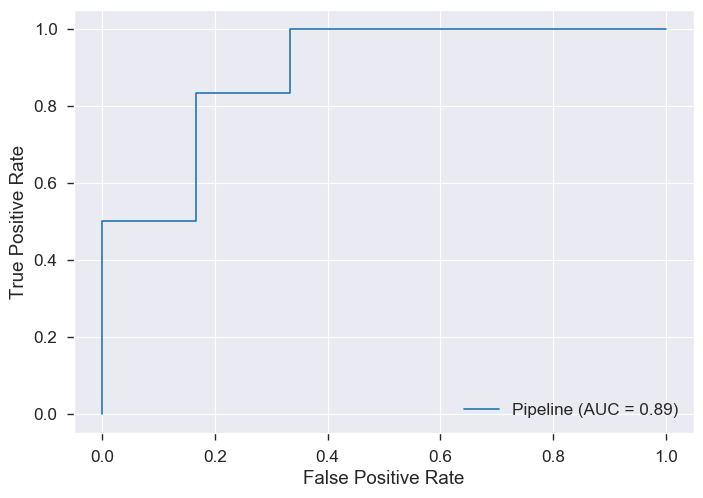

0.8333333333333334
Model Performance finetuned model
F1 = 0.83%.
Improvement of 8.3333%.


In [54]:
###Parameters to finetune###
n_estimators = [int(x) for x in np.linspace(start = 10, stop = 200, num = 20)] # Number of trees in random forest
max_features = ['auto', 'sqrt','log2','none']# Number of features to consider at every split
max_depth = [int(x) for x in np.linspace(4, 110, num = 20)] # Maximum number of levels in tree
max_depth.append(None)
min_samples_split = [2,3, 4, 5] # Minimum number of samples required to split a node
min_samples_leaf = [1, 2, 4] # Minimum number of samples required at each leaf node
bootstrap = [True, False]# Create the random grid # Method of selecting samples for training each tree
criterion = ['mse','gini','entropy']

base_model = classifiers[names.index('RF')]

                                                  


random_grid = {'classifier__n_estimators': n_estimators,
               'classifier__max_features': max_features,
               'classifier__max_depth': max_depth,
               'classifier__min_samples_split': min_samples_split,
               'classifier__min_samples_leaf': min_samples_leaf,
               'classifier__bootstrap': bootstrap,
              'classifier__criterion':criterion
              }

###Training and comparing###
# Use the random grid to search for best hyperparameters
# First create the base model to tune and check its performance



randomCVRF = finetune(base_model, random_grid, X_train, y_train, X_test, y_test)




In [ ]:
randomCVRF.best_params_

### ET

Cross Validated Training score base model: 0.7390 (+/- 0.1046)


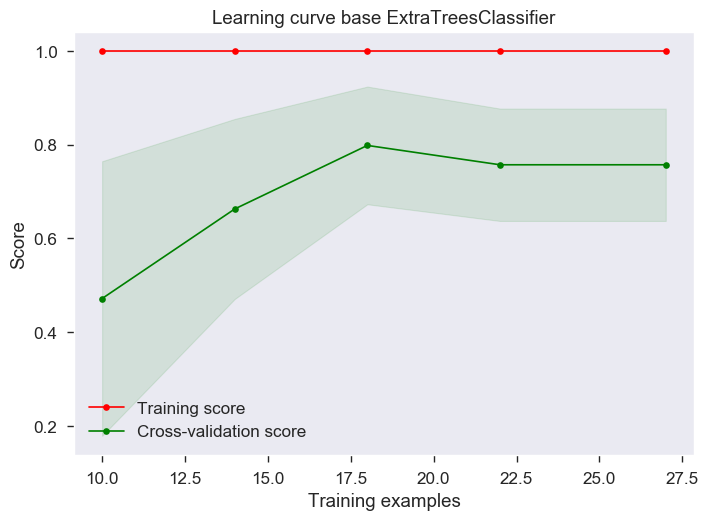

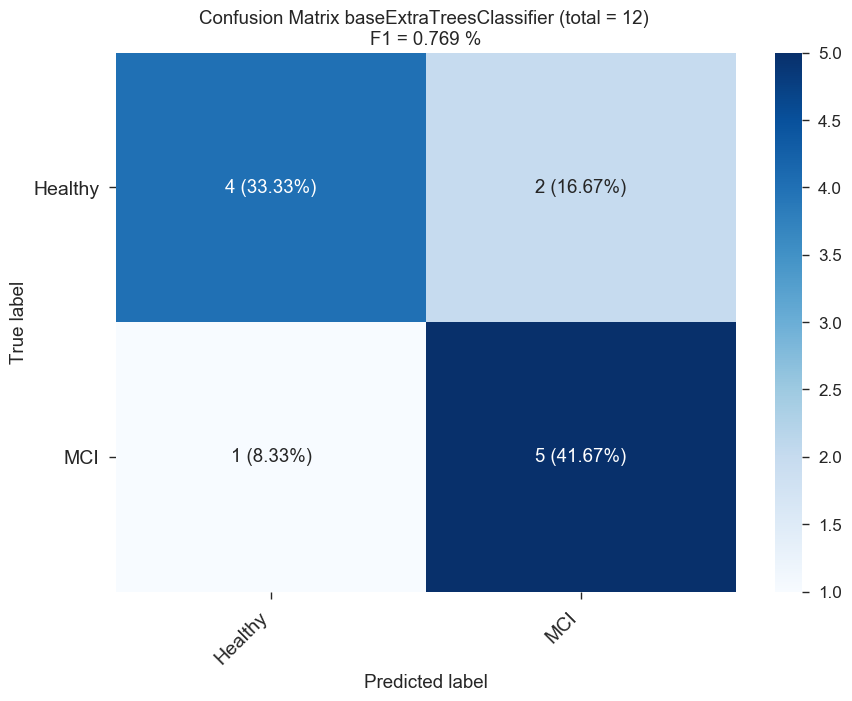

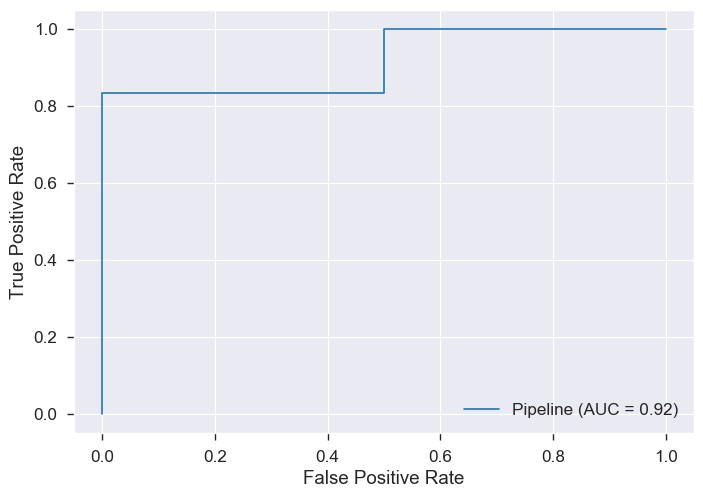

0.7692307692307692
Model Performance base model
F1 = 0.77%.
Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:    8.5s
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:   18.3s
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:   23.5s finished


Cross Validated Training score finetuned model: 0.8190 (+/- 0.1741)


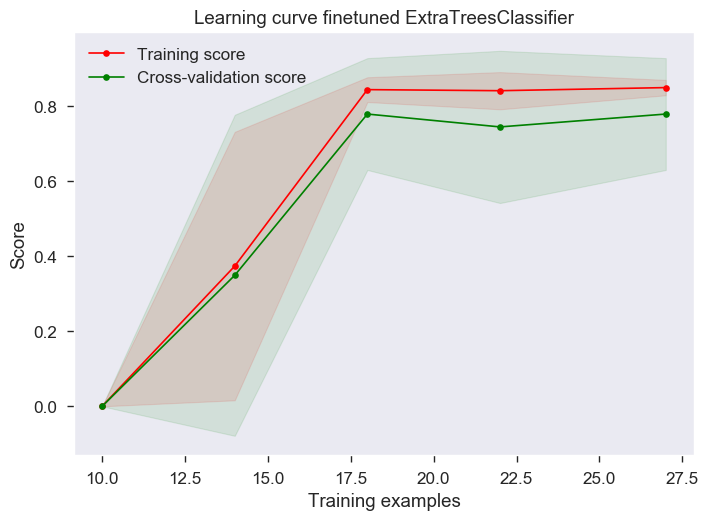

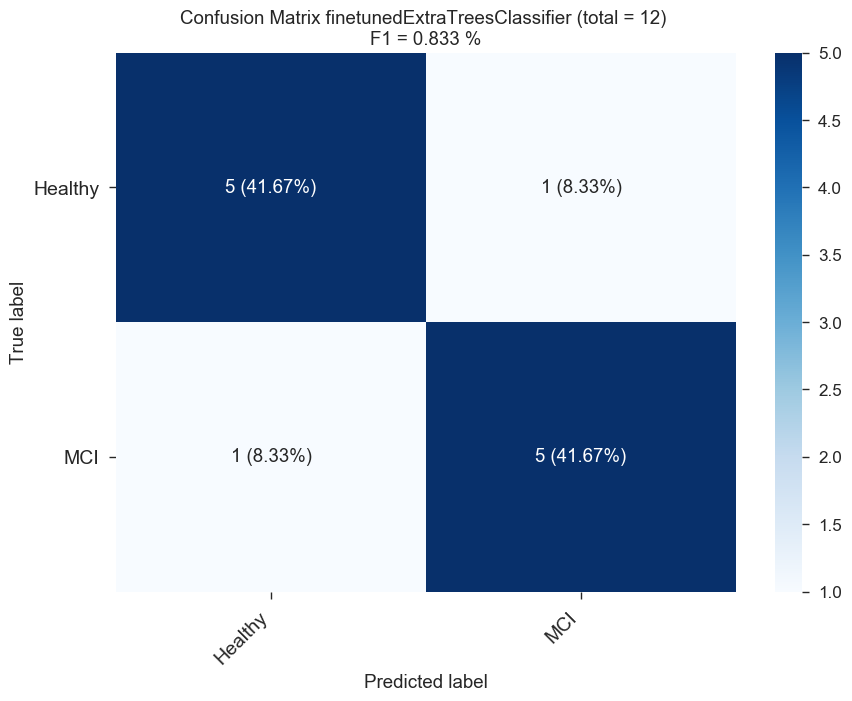

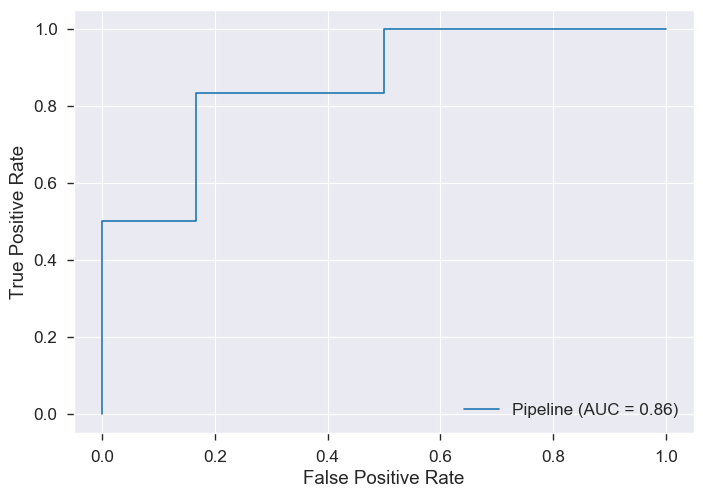

0.8333333333333334
Model Performance finetuned model
F1 = 0.83%.
Improvement of 8.3333%.


In [55]:
###Parameters to finetune###
n_estimators = [int(x) for x in np.linspace(start = 10, stop = 200, num = 10)] # Number of trees in random forest
max_features = ['auto', 'sqrt']# Number of features to consider at every split
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)] # Maximum number of levels in tree
max_depth.append(None)
min_samples_split = [2,3, 5, 10] # Minimum number of samples required to split a node
min_samples_leaf = [1, 2, 4] # Minimum number of samples required at each leaf node
bootstrap = [True, False]# Create the random grid # Method of selecting samples for training each tree
criterion = ['mse','gini', 'entropy']
                                                       


random_grid = {'classifier__n_estimators': n_estimators,
               'classifier__max_features': max_features,
               'classifier__max_depth': max_depth,
               'classifier__min_samples_split': min_samples_split,
               'classifier__min_samples_leaf': min_samples_leaf,
               'classifier__bootstrap': bootstrap,
              'classifier__criterion':criterion}

###Training and comparing###
# Use the random grid to search for best hyperparameters
# First create the base model to tune and check its performance
base_model = classifiers[names.index('ET')]


randomCVET=finetune(base_model, random_grid, X_train, y_train, X_test, y_test)

In [56]:
randomCVET.best_params_

{'classifier__n_estimators': 136,
 'classifier__min_samples_split': 10,
 'classifier__min_samples_leaf': 1,
 'classifier__max_features': 'sqrt',
 'classifier__max_depth': 30,
 'classifier__criterion': 'gini',
 'classifier__bootstrap': True}

### BAG

Cross Validated Training score base model: 0.7167 (+/- 0.1633)


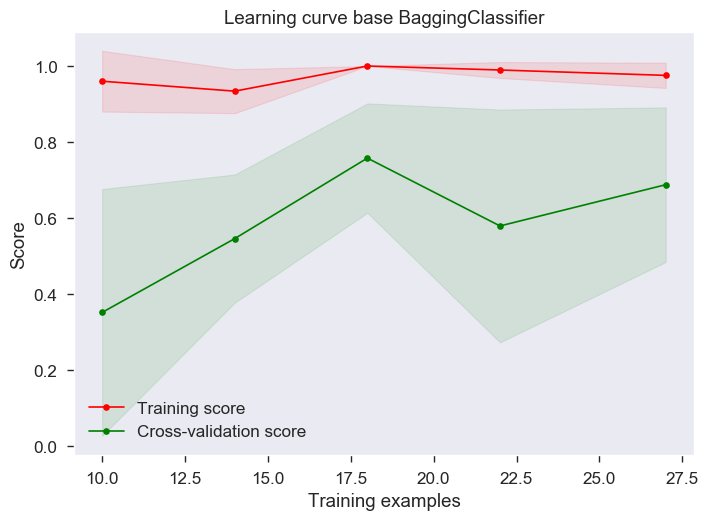

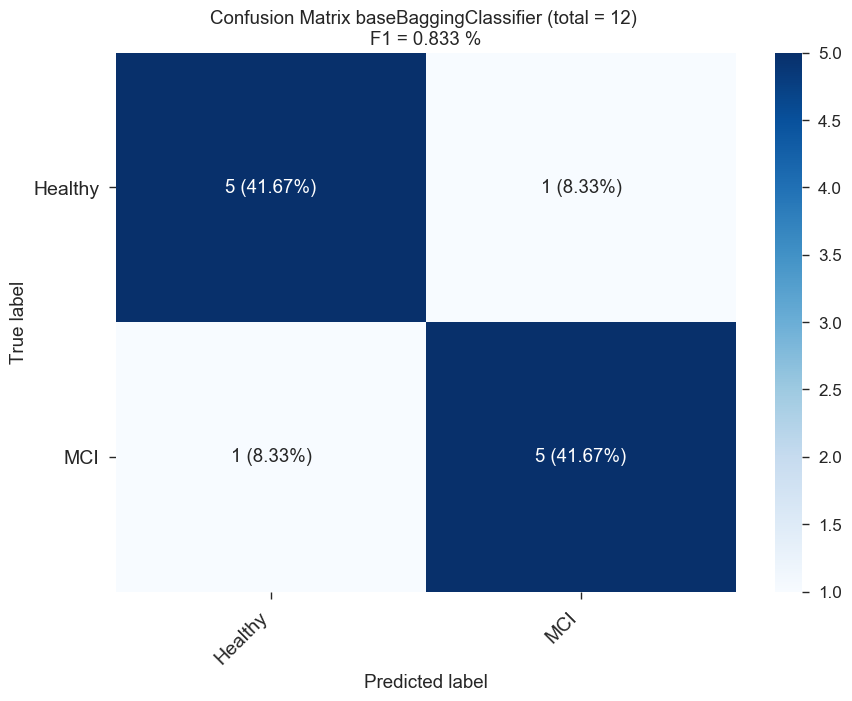

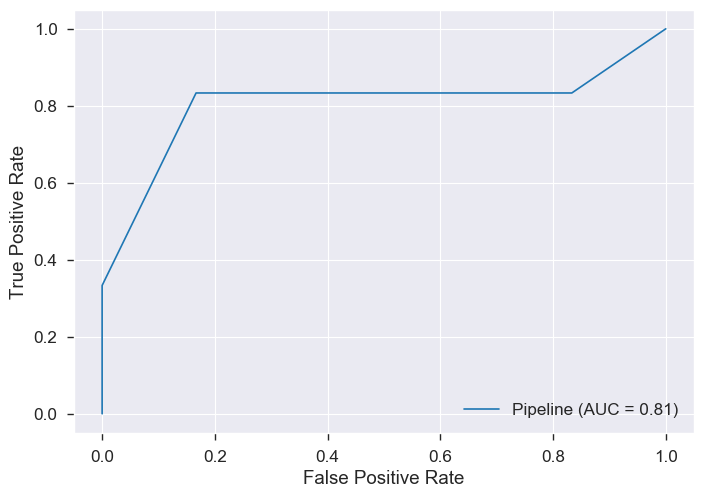

0.8333333333333334
Model Performance base model
F1 = 0.83%.
Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:   13.9s
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:   30.0s
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:   40.4s finished


Cross Validated Training score finetuned model: 0.8095 (+/- 0.1278)


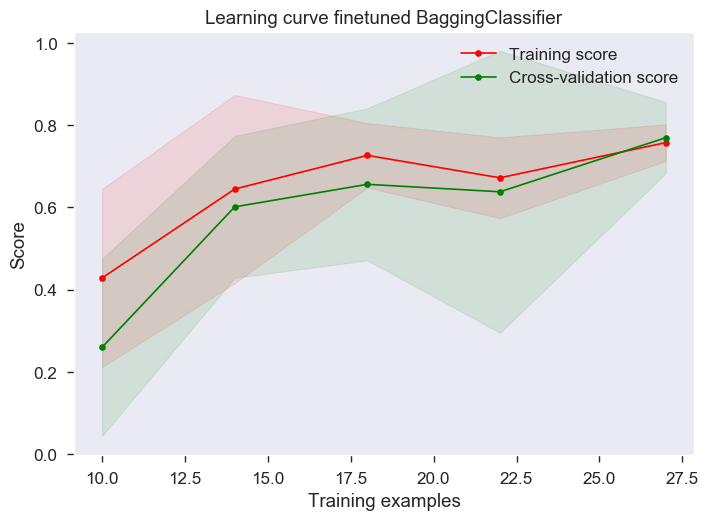

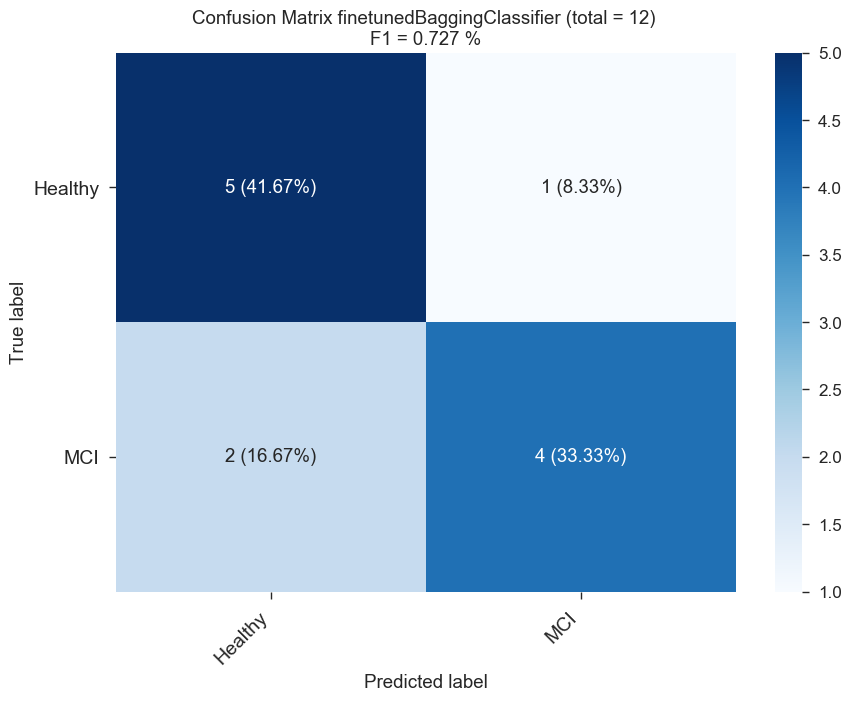

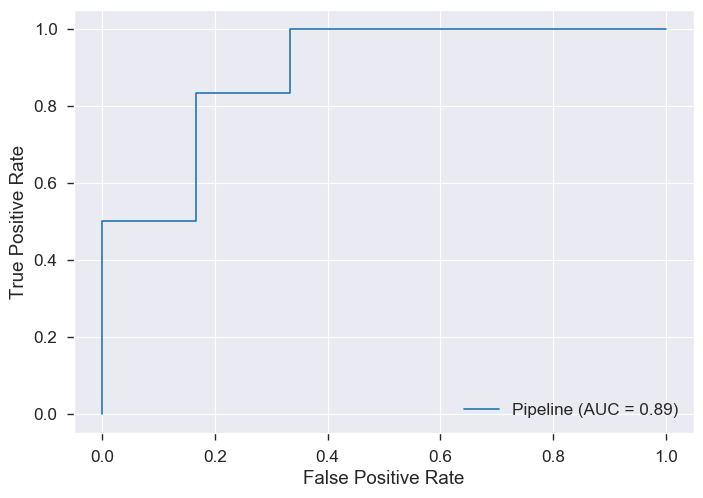

0.7272727272727272
Model Performance finetuned model
F1 = 0.73%.
Improvement of -12.7273%.


In [59]:
base_estimator = [classifiers[names.index('LR')],classifiers[names.index('SVC')],classifiers[names.index('DT')]]
n_estimators = [int(x) for x in np.linspace(start = 10, stop = 200, num = 200)]
max_features=[1,2,3]

random_grid = {'classifier__base_estimator': base_estimator,
               'classifier__n_estimators': n_estimators,
               'classifier__max_features': max_features}





###Training and comparing###
# Use the random grid to search for best hyperparameters
# First create the base model to tune and check its performance
base_model = classifiers[names.index('BAG')]


RandomCVBAG=finetune(base_model, random_grid, X_train, y_train, X_test, y_test)


In [60]:
RandomCVBAG.best_params_

{'classifier__n_estimators': 197,
 'classifier__max_features': 2,
 'classifier__base_estimator': LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                    intercept_scaling=1, l1_ratio=None, max_iter=100,
                    multi_class='auto', n_jobs=None, penalty='l2',
                    random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                    warm_start=False)}

### ADA

In [ ]:
base_estimator = [classifiers[names.index('LR')],classifiers[names.index('SVC')],classifiers[names.index('DT')]]
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
learning_rate=[float(x) for x in np.linspace(start = 0.001, stop = 1.0, num = 10)]

random_grid = {'classifier__base_estimator': base_estimator,
               'classifier__n_estimators': n_estimators,
               'classifier__learning_rate': learning_rate}

###Training and comparing###
# Use the random grid to search for best hyperparameters
# First create the base model to tune and check its performance
base_model = classifiers[names.index('ADA')]


RandomCVADA=finetune(base_model, random_grid, X_train, y_train, X_test, y_test)

In [ ]:
RandomCVADA.best_params_

### XGBRFC

Cross Validated Training score base model: 0.7267 (+/- 0.0523)


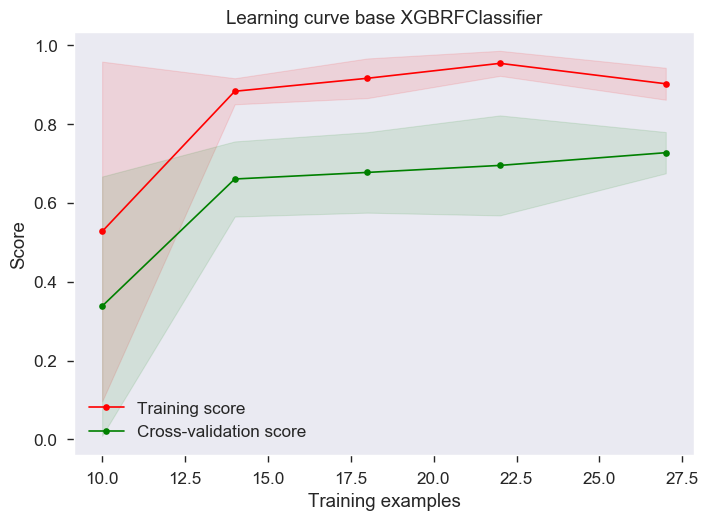

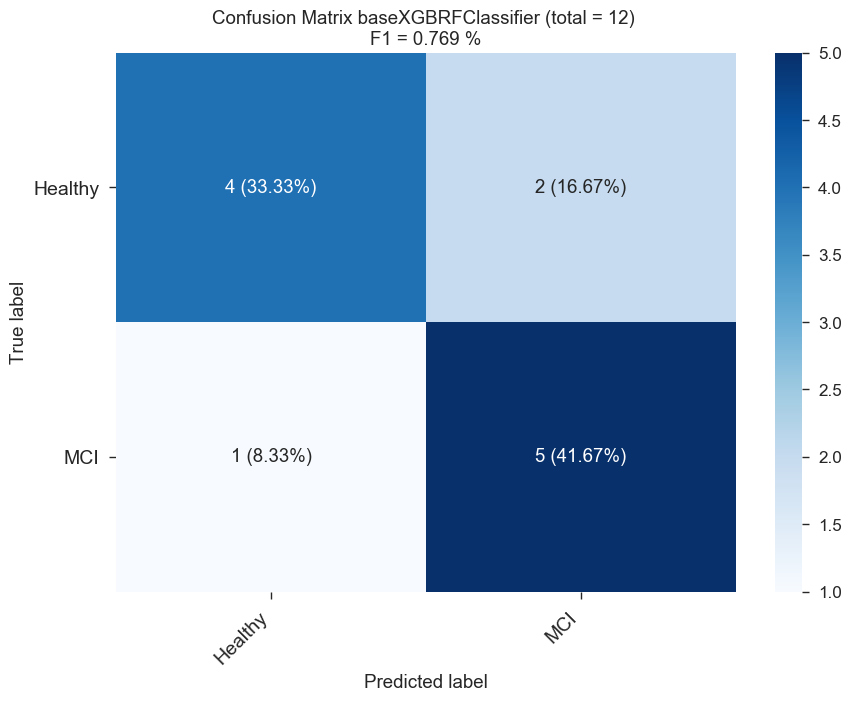

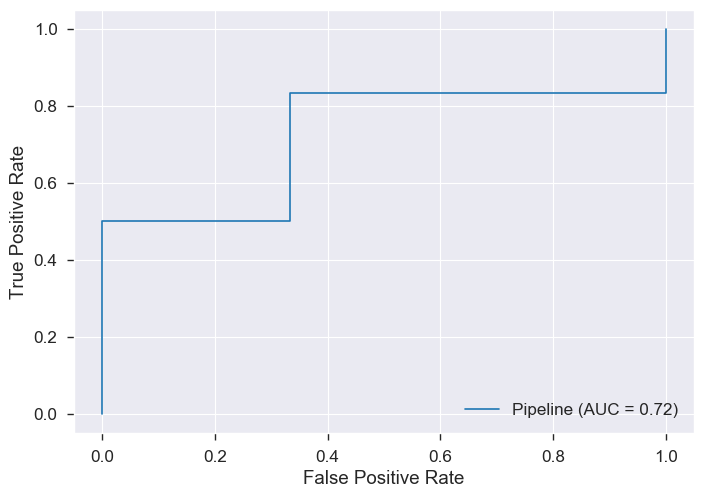

0.7692307692307692
Model Performance base model
F1 = 0.77%.
Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:   11.6s
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:   15.2s finished


Cross Validated Training score finetuned model: 0.7925 (+/- 0.0790)


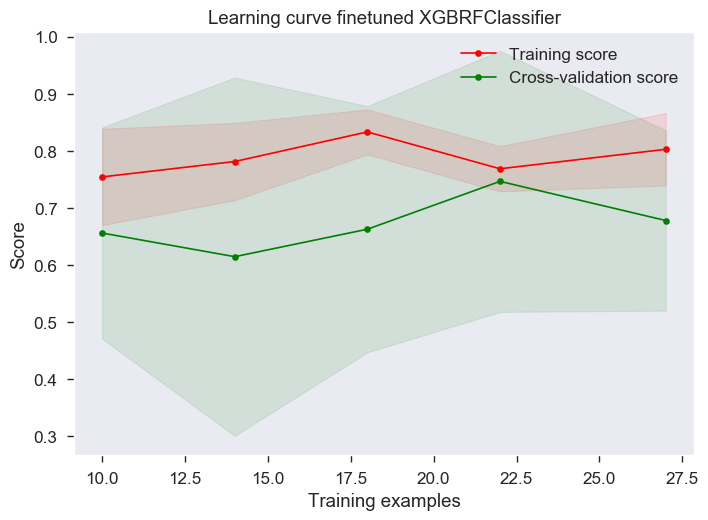

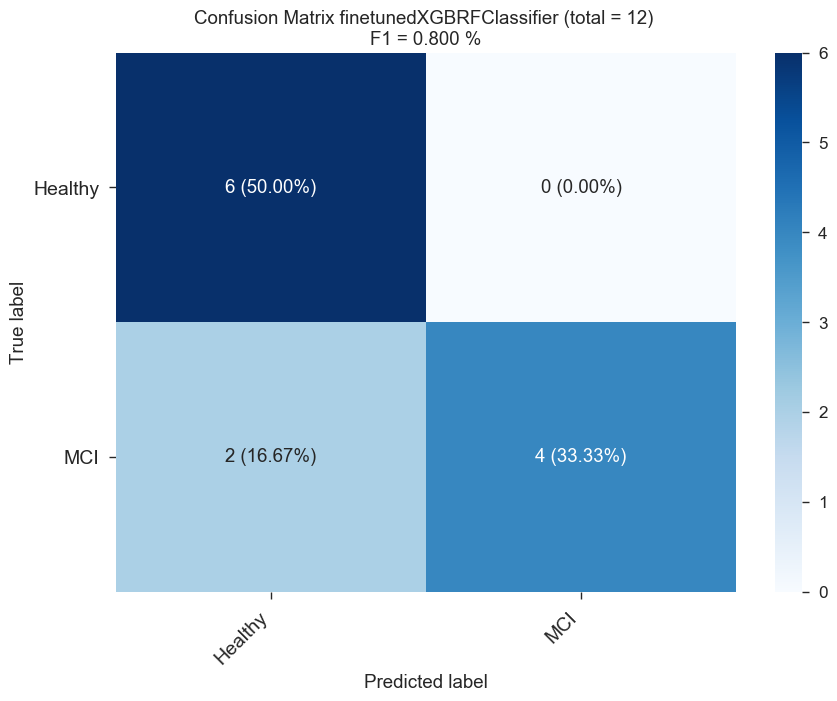

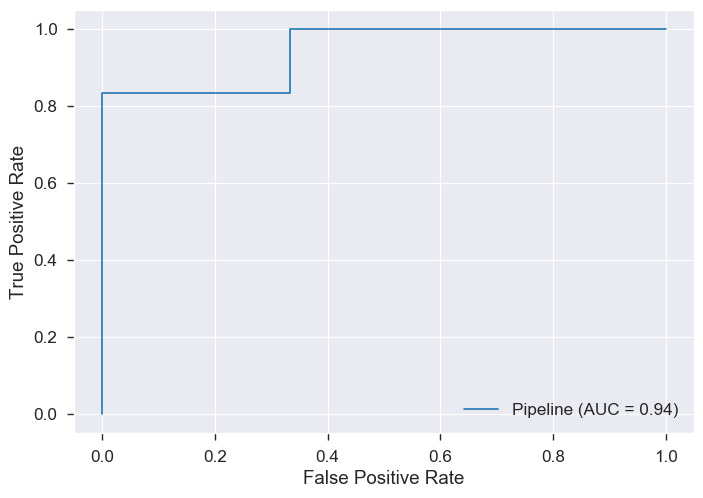

0.8
Model Performance finetuned model
F1 = 0.80%.
Improvement of 4.0000%.


In [61]:
n_estimators=[int(x) for x in np.linspace(start = 10, stop = 200, num = 10)]
max_depth = [int(x) for x in np.linspace(2, 15, num = 11)] # Maximum number of levels in tree
max_depth.append(None)
learning_rate=[float(x) for x in np.linspace(start = 0.001, stop = 1.0, num = 10)]
reg_alpha= [float(x) for x in np.linspace(start = 0.001, stop = 1.0, num = 10)]
reg_lambda=[float(x) for x in np.linspace(start = 0.001, stop = 1.0, num = 10)]
booster=['gbtree','gblinear','dart']


random_grid = {'classifier__max_depth': max_depth,
               'classifier__n_estimators': n_estimators,
               'classifier__learning_rate': learning_rate,
               'classifier__booster': booster,
               'classifier__reg_alpha': reg_alpha,
               'classifier__reg_lambda': reg_lambda
               
               
}



###Training and comparing###
# Use the random grid to search for best hyperparameters
# First create the base model to tune and check its performance
base_model = classifiers[names.index('XGBRFC')]


randomCVXGBRFC=finetune(base_model, random_grid, X_train, y_train, X_test, y_test)

In [ ]:
randomCVXGBRFC.best_params_

### GNB

Cross Validated Training score base model: 0.7124 (+/- 0.1026)


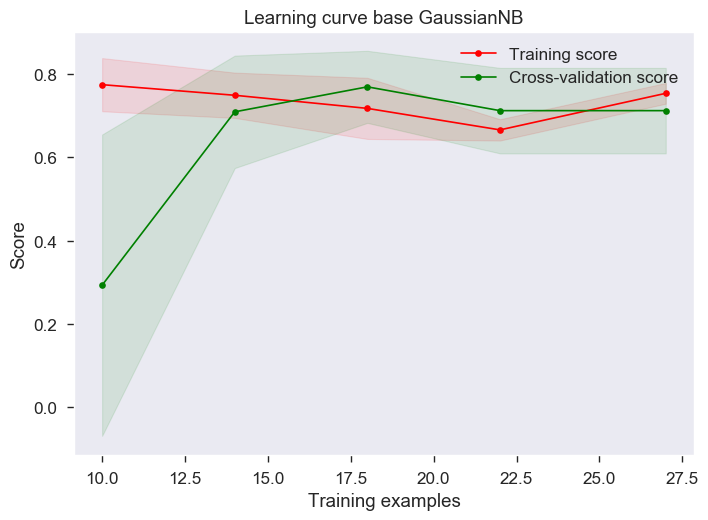

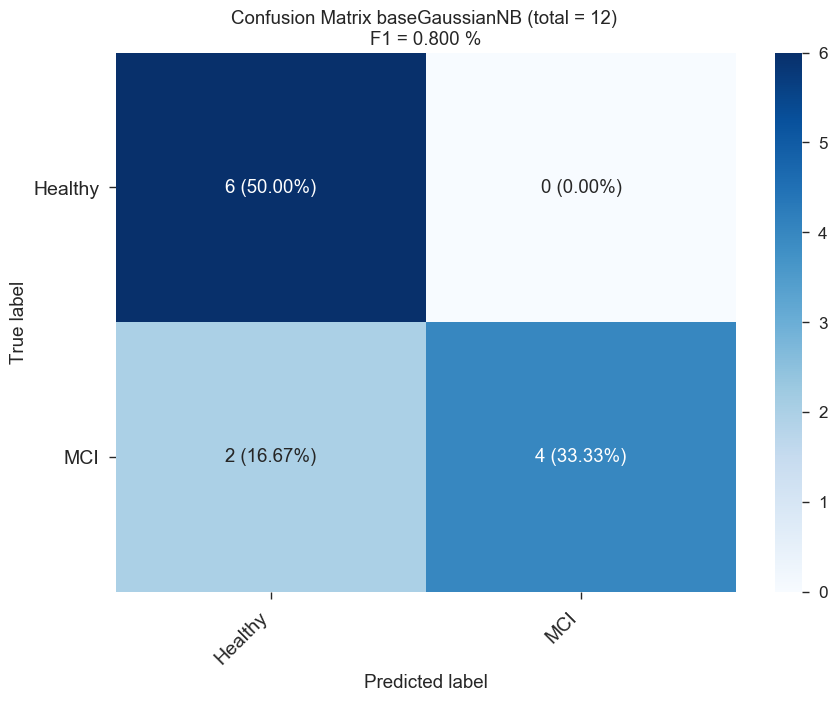

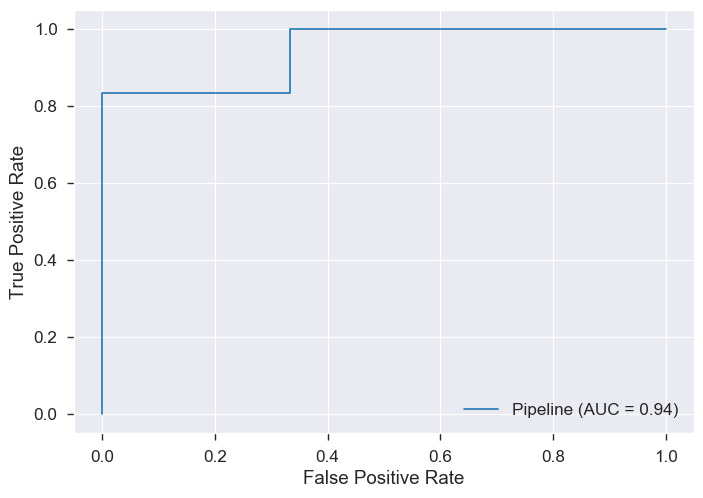

0.8
Model Performance base model
F1 = 0.80%.
Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 276 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:    9.9s finished


Cross Validated Training score finetuned model: 0.7581 (+/- 0.0775)


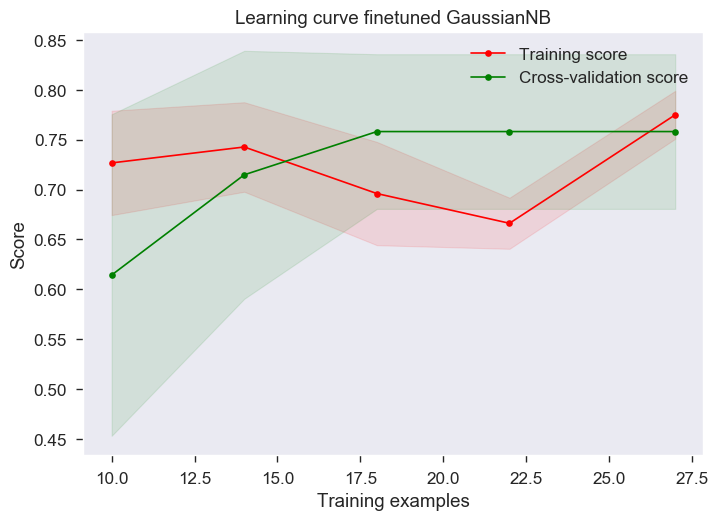

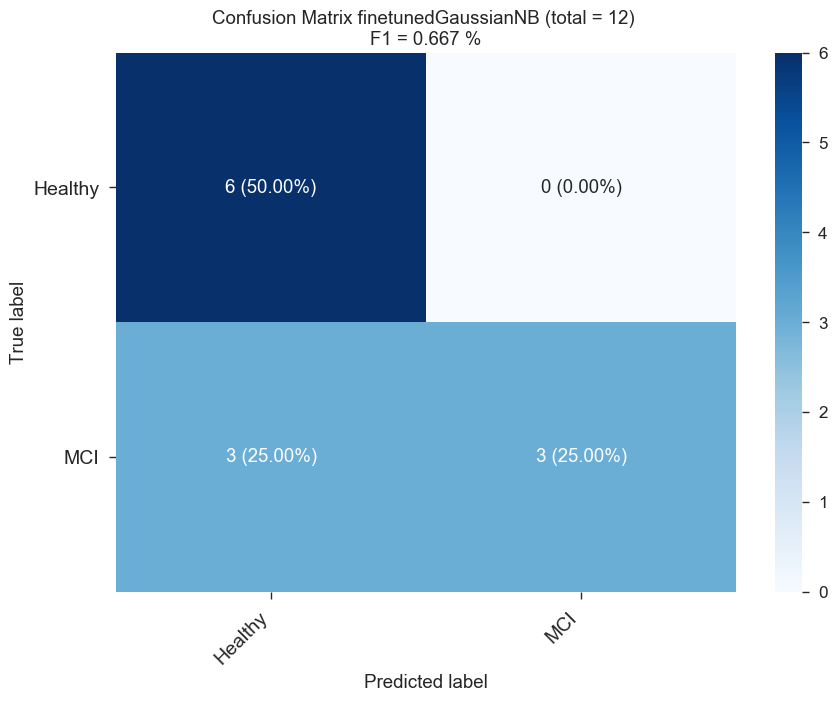

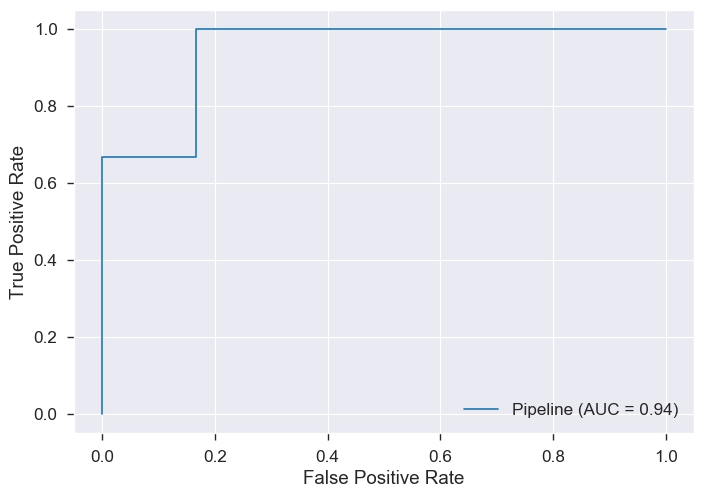

0.6666666666666666
Model Performance finetuned model
F1 = 0.67%.
Improvement of -16.6667%.


In [62]:
###Parameters to finetune###
var_smoothing= np.logspace(0,-12, num=100)                                                     
var_smoothing=np.append(var_smoothing,1e-09)

random_grid = {'classifier__var_smoothing': var_smoothing}

###Training and comparing###
# Use the random grid to search for best hyperparameters
# First create the base model to tune and check its performance
base_model = classifiers[names.index('GNB')]


RandomCVGNB=finetune(base_model, random_grid, X_train, y_train, X_test, y_test)

In [67]:
basePipelineGNB.get_params()

{'memory': None,
 'steps': [('prescaling',
   ColumnTransformer(n_jobs=None, remainder='drop', sparse_threshold=0.3,
                     transformer_weights=None,
                     transformers=[('log',
                                    FunctionTransformer(accept_sparse=False,
                                                        check_inverse=True,
                                                        func=<ufunc 'log1p'>,
                                                        inv_kw_args=None,
                                                        inverse_func=None,
                                                        kw_args=None,
                                                        validate=True),
                                    ['totalTimeMoveAvg', 'totalTimeMoveSD',
                                     'totalTimeMoveMin', 'thinkTimeMoveAvg',
                                     'moveTimeMoveAvg',...
          'thinkTimeMoveMax', 'moveTimeMoveAvg', 'moveTimeM

Cross Validated Training score base model: 0.7124 (+/- 0.1026)


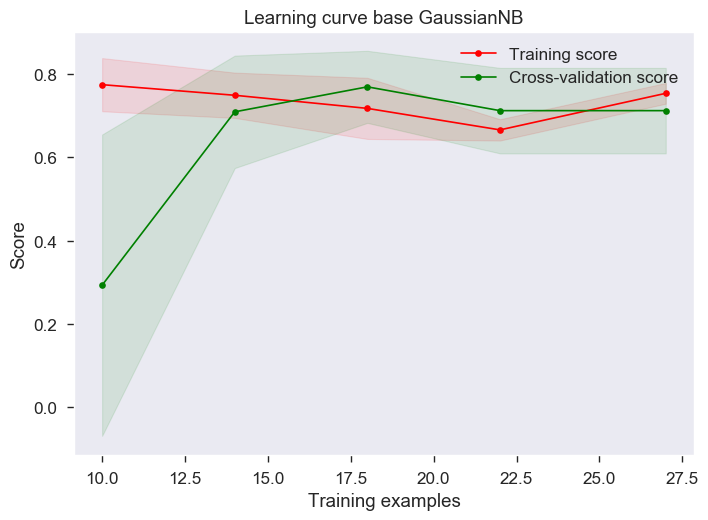

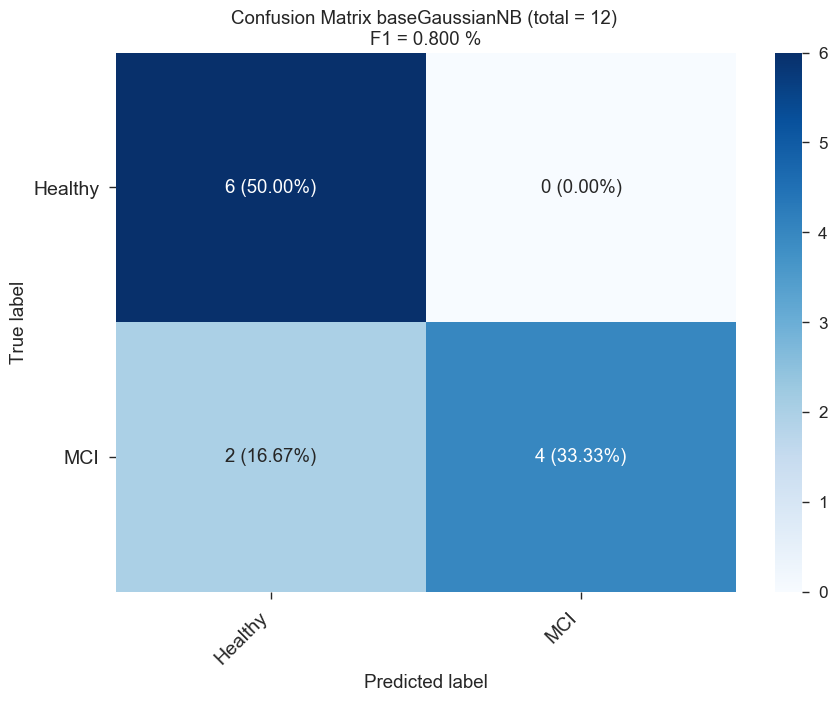

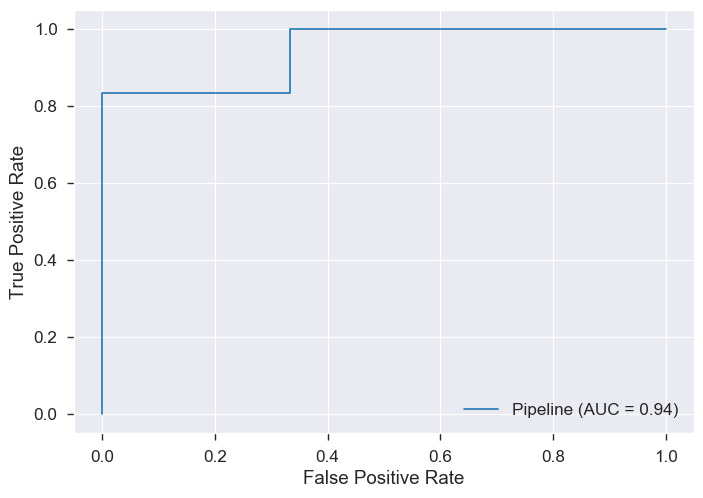

0.8
Model Performance base model
F1 = 0.80%.


In [66]:
basePipelineGNB = Pipeline(steps=[
('prescaling', prescaling),
('classifier', classifiers[names.index('GNB')])])
basePipelineGNB.fit(X_train,y_train)
baseTrainScores = cross_val_score(basePipelineGNB, X_train, y_train, cv=cv, scoring=SCORING); 
fig = plot_learning_curve(basePipelineGNB, "Learning curve base "+type(basePipelineGNB['classifier']).__name__, X_train, y_train, cv=cv, scoring=SCORING, train_sizes=np.linspace(.4, 1.0, 5)) 
fig.savefig('C:/Users/karst/Dropbox/Impulsfonds_Karsten/0_ProjectFiles/2_PresentationsAndPapers/0_FirstMCIStudy/Results/MLResults/Game'+str(seed)+'/'
    +type(base_model).__name__+'base'+'_learnCurve'+'.png')
print("Cross Validated Training score base model: %0.4f (+/- %0.4f)" % (baseTrainScores.mean(), baseTrainScores.std()))
base_f1,base_auc = evaluate(basePipelineGNB, X_test, y_test, 'base')

In [64]:
RandomCVGNB.best_estimator_.get_params()

{'memory': None,
 'steps': [('prescaling',
   ColumnTransformer(n_jobs=None, remainder='drop', sparse_threshold=0.3,
                     transformer_weights=None,
                     transformers=[('log',
                                    FunctionTransformer(accept_sparse=False,
                                                        check_inverse=True,
                                                        func=<ufunc 'log1p'>,
                                                        inv_kw_args=None,
                                                        inverse_func=None,
                                                        kw_args=None,
                                                        validate=True),
                                    ['totalTimeMoveAvg', 'totalTimeMoveSD',
                                     'totalTimeMoveMin', 'thinkTimeMoveAvg',
                                     'moveTimeMoveAvg',...
          'thinkTimeMoveMax', 'moveTimeMoveAvg', 'moveTimeM

### DT

In [ ]:
###Parameters to finetune###
max_features = ['auto', 'sqrt']# Number of features to consider at every split
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)] # Maximum number of levels in tree
max_depth.append(None)
min_samples_split = [2, 5, 10] # Minimum number of samples required to split a node
min_samples_leaf = [1, 2, 4] # Minimum number of samples required at each leaf node
criterion = ['mse','gini', 'entropy']

                                                   


random_grid = {'classifier__max_features': max_features,
               'classifier__max_depth': max_depth,
               'classifier__min_samples_split': min_samples_split,
               'classifier__min_samples_leaf': min_samples_leaf,
              'classifier__criterion':criterion}

###Training and comparing###
# Use the random grid to search for best hyperparameters
# First create the base model to tune and check its performance
base_model = classifiers[names.index('DT')]


randomCVDT=finetune(base_model, random_grid, X_train, y_train, X_test, y_test)

In [ ]:
base_model.get_params().keys()

In [ ]:
randomCVDT.best_estimator_.get_params()

### SVC

In [ ]:
C=[0.001,0.01,0.5,1.0,10,100,1000]
kernel=['poly', 'rbf','sigmoid']
degree=[2,3,4,5,6]
gamma=['scale','auto']

random_grid = {'classifier__C': C,  # penalty parameter C of the error term
              'classifier__kernel':kernel, # specifies the kernel type to be used in the algorithm  
              'classifier__gamma':gamma, # kernel coefficient for 'rbf'
               'classifier__degree':degree
             }


###Training and comparing###
# Use the random grid to search for best hyperparameters
# First create the base model to tune and check its performance
base_model = classifiers[names.index('SVC')]


randomCVSVC=finetune(base_model, random_grid, X_train, y_train, X_test, y_test)


In [ ]:
randomCVSVC.best_params_

## AutoML

General Reads
* https://github.com/ClimbsRocks/auto_ml

# Ensemble Generation

Ensemble Learning refers to the technique of combining different models. It reduces both bias and variance of the final model, thus increasing the score and reducing the risk of overfitting. Needs to be composed of several weak learners with different algorithms.

General reads:
* https://link.springer.com/chapter/10.1007%2F3-540-33019-4_19
* Stacking https://www.kaggle.com/arthurtok/introduction-to-ensembling-stacking-in-python#Second-Level-Predictions-from-the-First-level-Output
  
Sklearn implementations:
* https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.StackingClassifier.html

from sklearn.ensemble import StackingClassifier
cv=cv
stack_method='auto'
n_jobs=-1
estimators = [
     ('ET', randomCVET.best_estimator_),
     ('XGBRFC', randomCVXGBRFC.best_estimator_),
     ('GNB', RandomCVGNB.best_estimator_)
    ]

clf = StackingClassifier(estimators=estimators, final_estimator=LogisticRegression(), n_jobs=n_jobs,cv=cv,stack_method=stack_method)


In [ ]:
#clf.fit(X_train, y_train)##I don't think we need this

# Save Models

In [68]:
baseUrl=r'C:/Users/karst/Dropbox/Impulsfonds_Karsten/0_ProjectFiles/2_PresentationsAndPapers/0_FirstMCIStudy/Results/MLResults/Game'+str(seed)+'/'
X_train.to_csv(baseUrl+"X_train.csv", index = True)
y_train.to_csv(baseUrl+"y_train.csv", index = True,header=False)
X_test.to_csv(baseUrl+"X_test.csv", index = True)
y_test.to_csv(baseUrl+"y_test.csv", index = True,header=False)

In [73]:
#Save everything for testing in other file
from joblib import dump, load
dump(basePipelineGNB, 'basePipelineGNB'+str(seed)+'.joblib')




['basePipelineGNB498512.joblib']

In [ ]:
y_train


## Variable Importance Plot — Global Interpretability

In [ ]:
# use Kernel SHAP to explain test set predictions
shap.initjs()

def model_predict(data_asarray):
    data_asframe =  pd.DataFrame(data_asarray, columns=feature_names)
    return estimator.predict(data_asframe)

shap_kernel_explainer = shap.KernelExplainer(model_predict, X_train, link='logit')

shap_values = explainer.shap_values(X_train.iloc[0,:])
shap.summary_plot(shap_values, X_train, plot_type="bar")



In [ ]:
randomCVRF.best_estimator_.predict_proba

In [ ]:
f = plt.figure()
shap.summary_plot(rf_shap_values, X_test)
f.savefig("/summary_plot1.png", bbox_inches='tight', dpi=600)

This plot is made of all the dots in the train data. It demonstrates the following information:

* Feature importance: Variables are ranked in descending order.
* Impact: The horizontal location shows whether the effect of that value is associated with a higher or lower prediction.
* Original value: Color shows whether that variable is high (in red) or low (in blue) for that observation.
* Correlation: A high level of the “alcohol” content has a high and positive impact on the quality rating. The “high” comes from the red color, and the “positive” impact is shown on the X-axis. Similarly, we will say the “volatile acidity” is negatively correlated with the target variable.

## SHAP Dependence Plot — Global Interpretability

The partial dependence plot shows the marginal effect one or two features have on the predicted outcome of a machine learning model (J. H. Friedman 2001). It tells whether the relationship between the target and a feature is linear, monotonic or more complex. In order to create a dependence plot, you only need one line of code. The function automatically includes another variable that your chosen variable interacts most with. The following plot shows there is an approximately linear and positive trend between “alcohol” and the target variable, and “alcohol” interacts with “sulphates” frequently.

In [ ]:
shap.dependence_plot(“alcohol”, shap_values, X_train

## Individual SHAP Value Plot — Local Interpretability

Can be used to explain why some are misclassified. Combined with the COTESS results.

In [ ]:
# Get the predictions and put them with the test data.
X_output = X_test.copy()
X_output.loc[:,'predict'] = np.round(model.predict(X_output),2)

# Randomly pick some observations
random_picks = np.arange(1,330,50) # Every 50 rows
S = X_output.iloc[random_picks]
S

# Initialize your Jupyter notebook with initjs(), otherwise you will get an error message.
shap.initjs()

# Write in a function
def shap_plot(j):
    explainerModel = shap.TreeExplainer(model)
    shap_values_Model = explainerModel.shap_values(S)
    p = shap.force_plot(explainerModel.expected_value, shap_values_Model[j], S.iloc[[j]])
    return(p)

shap_plot(0)